<a href="https://colab.research.google.com/github/AdvancedUno/HuBMAP-HPA---Hacking-the-Human-Body-Kaggle-/blob/main/hubmap_baseline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Imports

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#!pip install -qq torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html
!pip install -qq git+https://github.com/qubvel/segmentation_models.pytorch
!pip install -qq timm==0.4.12
!pip install -qq einops

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 376 kB 39.4 MB/s 
     |████████████████████████████████| 58 kB 6.7 MB/s 


In [3]:
#!pip install -qq torch==1.9.0  torchvision==0.10.0 torchaudio==0.9.0 -f https://download.pytorch.org/whl/torch_stable.html

In [4]:
#! pip install pytorch==1.9.0 torchvision==0.10.0 torchaudio==0.9.0 cudatoolkit=10.2

In [5]:
import os
import gc
import sys
import glob

import torch
import torch.nn as nn
import albumentations as A

import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import tqdm
import segmentation_models_pytorch as smp
from sklearn.model_selection import StratifiedKFold

import tifffile as tiff

torch.backends.cudnn.benchmark = True

## Configuration

In [6]:
fold = 0
nfolds = 2
imsize = 1024
train_csv = "/content/drive/MyDrive/DeepLearning/train.csv"
BATCH_SIZE = 1
DEVICE = ('cuda' if torch.cuda.is_available() else 'cpu')
EPOCHS = 40
NUM_WORKERS = 4
SEED = 422
TRAIN_PATH = "/content/drive/MyDrive/DeepLearning/train_images/"
MASK_PATH = '/content/drive/MyDrive/DeepLearning/mask/'

In [7]:
def set_seed(seed=12):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    torch.backends.cudnn.deterministic = True
set_seed(12)

## Helper Functions

In [8]:
def transformer(p=1.0):
    return A.Compose([
        A.augmentations.crops.RandomResizedCrop(height=1024, width=1024),
        A.HorizontalFlip(p=0.4),
        A.VerticalFlip(p=0.4),
        A.RandomRotate90(p=0.4),
#         A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=0.9, 
#                          border_mode=cv2.BORDER_REFLECT),
#         A.OneOf([
#             A.OpticalDistortion(p=0.4),
#             #A.GridDistortion(p=.1),
#             A.PiecewiseAffine(p=0.4),
#         ], p=0.5),
        A.OneOf([
            A.HueSaturationValue(10,15,10),
            A.CLAHE(clip_limit=2),
            A.RandomBrightnessContrast(),            
        ], p=0.5),
        #A.Normalize()
    ], p=p)

In [9]:
def read_tiff(image_file, mode='rgb'):
	image = tiff.imread(image_file)
	image = image.squeeze()
	if image.shape[0] == 3:
		image = image.transpose(1, 2, 0)
	if mode=='bgr':
		image = image[:,:,::-1]
	image = np.ascontiguousarray(image)
	return image

In [42]:
class HuBMAPDataset(torch.utils.data.Dataset):
    def __init__(self, fold=fold, train=True, tfms=None):
        self.train = train
        ids = pd.read_csv(train_csv).id.values
        labels = pd.read_csv(train_csv).organ.values
        kf = StratifiedKFold(n_splits=nfolds,random_state=SEED,shuffle=True)
        ids = (ids[list(kf.split(ids,labels))[fold][0 if train else 1]]).tolist()
        self.fnames = [fname for fname in os.listdir(TRAIN_PATH) if int(fname.split('.')[0]) in ids]
        self.image_size = imsize
        self.tfms = tfms
        
    def img2tensor(self, img,dtype:np.dtype=np.float32):
        if img.ndim==2 : img = np.expand_dims(img,2)
        img = np.transpose(img,(2,0,1)) # C , H , W
        return torch.from_numpy(img.astype(dtype, copy=False)/255)
    
    def mask2tensor(self, img,dtype:np.dtype=np.float32):
        if img.ndim==2 : img = np.expand_dims(img,2)
        img = np.transpose(img,(2,0,1)) # C , H , W
        return torch.from_numpy(img.astype(dtype, copy=False))
    
    def __len__(self):
        return len(self.fnames)
    
    def resize(self, img, interp):
        return  cv2.resize(
            img, (self.image_size, self.image_size), interpolation=interp)
    
    def __getitem__(self, idx):
        fname = self.fnames[idx]
        #img = cv2.cvtColor(cv2.imread(TRAIN_PATH + fname), cv2.COLOR_BGR2RGB)
        img = read_tiff(TRAIN_PATH + fname,'rgb')
        mask = cv2.imread((MASK_PATH + fname.replace('tiff','png')),cv2.IMREAD_GRAYSCALE)
        if self.tfms is not None:
            augmented = self.tfms(image=img,mask=mask)
            img,mask = augmented['image'],augmented['mask']
            return self.img2tensor(img) , self.mask2tensor(mask>0.5)
        return self.img2tensor(self.resize(img , cv2.INTER_NEAREST)) , self.mask2tensor(self.resize(mask , cv2.INTER_NEAREST)>0.5)
        
        

In [43]:
# ds = HuBMAPDataset(tfms=transformer())
# dl = torch.utils.data.DataLoader(ds,batch_size=4,shuffle=False,num_workers=4)
# it = iter(dl)
# imgs,masks = next(it)

In [44]:
# TRAIN_IMG_PATH = "../input/hubmap-organ-segmentation/train_images"
# TEST_IMG_PATH = "../input/hubmap-organ-segmentation/test_images"

# TRAIN_IMG_ANNOTATIONS = "../input/hubmap-organ-segmentation/train_annotations"
# TRAIN_IMG_INFO = "../input/hubmap-organ-segmentation/train.csv"

In [45]:
# plt.figure(figsize=(16,16))
# for i,(img,mask) in enumerate(zip(imgs,masks)):
#     img = ((img.permute(1,2,0))).numpy().astype(np.uint8)  # H , W , C
#     plt.subplot(8,8,i+1)
#     plt.imshow(img,vmin=0,vmax=255)
#     plt.imshow(mask.squeeze().numpy(), alpha=0.2)
#     plt.axis('off')
#     plt.subplots_adjust(wspace=None, hspace=None)
    
# del ds,dl,imgs,masks

In [46]:
# CoAT-5level

# https://github.com/mlpc-ucsd/CoaT/blob/main/src/models/coat.py

"""
CoaT architecture.

Modified from timm/models/vision_transformer.py
"""

import torch
import torch.nn as nn
import torch.nn.functional as F

from timm.data import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
from timm.models.layers import DropPath, to_2tuple, trunc_normal_
from timm.models.registry import register_model

from einops import rearrange
from functools import partial
from torch import nn, einsum
import pdb

# __all__ = [
# 	"coat_tiny",
# 	"coat_mini",
# 	"coat_small",
# 	"coat_lite_tiny",
# 	"coat_lite_mini",
# 	"coat_lite_small"
# ]



def init_weight(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        #nn.init.xavier_uniform_(m.weight, gain=1)
        #nn.init.xavier_normal_(m.weight, gain=1)
        #nn.init.kaiming_uniform_(m.weight, mode='fan_in', nonlinearity='relu')
        nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='relu')
        #nn.init.orthogonal_(m.weight, gain=1)
        if m.bias is not None:
            m.bias.data.zero_()
    elif classname.find('Batch') != -1:
        m.weight.data.normal_(1,0.02)
        m.bias.data.zero_()
    elif classname.find('Linear') != -1:
        nn.init.orthogonal_(m.weight, gain=1)
        if m.bias is not None:
            m.bias.data.zero_()
    elif classname.find('Embedding') != -1:
        nn.init.orthogonal_(m.weight, gain=1)


#---------------------------------------------
#https://github.com/facebookresearch/ConvNeXt/blob/main/models/convnext.py#L15
class LayerNorm2d(nn.Module):
	def __init__(self, dim, eps=1e-6):
		super().__init__()
		self.dim = dim
		self.weight = nn.Parameter(torch.ones(dim))
		self.bias = nn.Parameter(torch.zeros(dim))
		self.eps = eps
	
	def forward(self, x):
		batch_size,C,H,W = x.shape
		#assert C==self.dim, 'C=%d, self.dim=%d'%(C,self.dim)
		#print('C=%d, self.dim=%d'%(C,self.dim))
		
		u = x.mean(1, keepdim=True)
		s = (x - u).pow(2).mean(1, keepdim=True)
		x = (x - u) / torch.sqrt(s + self.eps)
		x = self.weight[:, None, None] * x + self.bias[:, None, None]
		return x
#---------------------------------------------

def _cfg_coat(url='', **kwargs):
	return {
		'url': url,
		'num_classes': 1000, 'input_size': (3, 224, 224), 'pool_size': None,
		'crop_pct': .9, 'interpolation': 'bicubic',
		'mean': IMAGENET_DEFAULT_MEAN, 'std': IMAGENET_DEFAULT_STD,
		'first_conv': 'patch_embed.proj', 'classifier': 'head',
		**kwargs
	}


class Mlp(nn.Module):
	""" Feed-forward network (FFN, a.k.a. MLP) class. """
	def __init__(self, in_features, hidden_features=None, out_features=None, act_layer=nn.GELU, drop=0.):
		super().__init__()
		out_features = out_features or in_features
		hidden_features = hidden_features or in_features
		self.fc1 = nn.Linear(in_features, hidden_features)
		self.act = act_layer()
		self.fc2 = nn.Linear(hidden_features, out_features)
		self.drop = nn.Dropout(drop)
	
	def forward(self, x):
		x = self.fc1(x)
		x = self.act(x)
		x = self.drop(x)
		x = self.fc2(x)
		x = self.drop(x)
		return x


class ConvRelPosEnc(nn.Module):
	""" Convolutional relative position encoding. """
	def __init__(self, Ch, h, window):
		"""
		Initialization.
			Ch: Channels per head.
			h: Number of heads.
			window: Window size(s) in convolutional relative positional encoding. It can have two forms:
					1. An integer of window size, which assigns all attention heads with the same window size in ConvRelPosEnc.
					2. A dict mapping window size to #attention head splits (e.g. {window size 1: #attention head split 1, window size 2: #attention head split 2})
					   It will apply different window size to the attention head splits.
		"""
		super().__init__()
		
		if isinstance(window, int):
			window = {window: h}                                                         # Set the same window size for all attention heads.
			self.window = window
		elif isinstance(window, dict):
			self.window = window
		else:
			raise ValueError()
		
		self.conv_list = nn.ModuleList()
		self.head_splits = []
		for cur_window, cur_head_split in window.items():
			dilation = 1                                                                 # Use dilation=1 at default.
			padding_size = (cur_window + (cur_window - 1) * (dilation - 1)) // 2         # Determine padding size. Ref: https://discuss.pytorch.org/t/how-to-keep-the-shape-of-input-and-output-same-when-dilation-conv/14338
			cur_conv = nn.Conv2d(cur_head_split*Ch, cur_head_split*Ch,
			                     kernel_size=(cur_window, cur_window),
			                     padding=(padding_size, padding_size),
			                     dilation=(dilation, dilation),
			                     groups=cur_head_split*Ch,
			                     )
			self.conv_list.append(cur_conv)
			self.head_splits.append(cur_head_split)
		self.channel_splits = [x*Ch for x in self.head_splits]
	
	def forward(self, q, v, size):
		B, h, N, Ch = q.shape
		H, W = size
		assert N == 1 + H * W
		
		# Convolutional relative position encoding.
		q_img = q[:,:,1:,:]                                                              # Shape: [B, h, H*W, Ch].
		v_img = v[:,:,1:,:]                                                              # Shape: [B, h, H*W, Ch].
		
		v_img = rearrange(v_img, 'B h (H W) Ch -> B (h Ch) H W', H=H, W=W)               # Shape: [B, h, H*W, Ch] -> [B, h*Ch, H, W].
		v_img_list = torch.split(v_img, self.channel_splits, dim=1)                      # Split according to channels.
		conv_v_img_list = [conv(x) for conv, x in zip(self.conv_list, v_img_list)]
		conv_v_img = torch.cat(conv_v_img_list, dim=1)
		conv_v_img = rearrange(conv_v_img, 'B (h Ch) H W -> B h (H W) Ch', h=h)          # Shape: [B, h*Ch, H, W] -> [B, h, H*W, Ch].
		
		EV_hat_img = q_img * conv_v_img
		zero = torch.zeros((B, h, 1, Ch), dtype=q.dtype, layout=q.layout, device=q.device)
		EV_hat = torch.cat((zero, EV_hat_img), dim=2)                                # Shape: [B, h, N, Ch].
		
		return EV_hat


class FactorAtt_ConvRelPosEnc(nn.Module):
	""" Factorized attention with convolutional relative position encoding class. """
	def __init__(self, dim, num_heads=8, qkv_bias=False, qk_scale=None, attn_drop=0., proj_drop=0., shared_crpe=None):
		super().__init__()
		self.num_heads = num_heads
		head_dim = dim // num_heads
		self.scale = qk_scale or head_dim ** -0.5
		
		self.qkv = nn.Linear(dim, dim * 3, bias=qkv_bias)
		self.attn_drop = nn.Dropout(attn_drop)                                           # Note: attn_drop is actually not used.
		self.proj = nn.Linear(dim, dim)
		self.proj_drop = nn.Dropout(proj_drop)
		
		# Shared convolutional relative position encoding.
		self.crpe = shared_crpe
	
	def forward(self, x, size):
		B, N, C = x.shape
		
		# Generate Q, K, V.
		qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)  # Shape: [3, B, h, N, Ch].
		q, k, v = qkv[0], qkv[1], qkv[2]                                                 # Shape: [B, h, N, Ch].
		
		# Factorized attention.
		k_softmax = k.softmax(dim=2)                                                     # Softmax on dim N.
		k_softmax_T_dot_v = einsum('b h n k, b h n v -> b h k v', k_softmax, v)          # Shape: [B, h, Ch, Ch].
		factor_att        = einsum('b h n k, b h k v -> b h n v', q, k_softmax_T_dot_v)  # Shape: [B, h, N, Ch].
		
		# Convolutional relative position encoding.
		crpe = self.crpe(q, v, size=size)                                                # Shape: [B, h, N, Ch].
		
		# Merge and reshape.
		x = self.scale * factor_att + crpe
		x = x.transpose(1, 2).reshape(B, N, C)                                           # Shape: [B, h, N, Ch] -> [B, N, h, Ch] -> [B, N, C].
		
		# Output projection.
		x = self.proj(x)
		x = self.proj_drop(x)
		
		return x                                                                         # Shape: [B, N, C].


class ConvPosEnc(nn.Module):
	""" Convolutional Position Encoding.
		Note: This module is similar to the conditional position encoding in CPVT.
	"""
	def __init__(self, dim, k=3):
		super(ConvPosEnc, self).__init__()
		self.proj = nn.Conv2d(dim, dim, k, 1, k//2, groups=dim)
	
	def forward(self, x, size):
		B, N, C = x.shape
		H, W = size
		assert N == 1 + H * W
		
		# Extract CLS token and image tokens.
		cls_token, img_tokens = x[:, :1], x[:, 1:]                                       # Shape: [B, 1, C], [B, H*W, C].
		
		# Depthwise convolution.
		feat = img_tokens.transpose(1, 2).view(B, C, H, W)
		x = self.proj(feat) + feat
		x = x.flatten(2).transpose(1, 2)
		
		# Combine with CLS token.
		x = torch.cat((cls_token, x), dim=1)
		
		return x


class SerialBlock(nn.Module):
	""" Serial block class.
		Note: In this implementation, each serial block only contains a conv-attention and a FFN (MLP) module. """
	def __init__(self, dim, num_heads, mlp_ratio=4., qkv_bias=False, qk_scale=None, drop=0., attn_drop=0.,
	             drop_path=0., act_layer=nn.GELU, norm_layer=nn.LayerNorm,
	             shared_cpe=None, shared_crpe=None):
		super().__init__()
		
		# Conv-Attention.
		self.cpe = shared_cpe
		
		self.norm1 = norm_layer(dim)
		self.factoratt_crpe = FactorAtt_ConvRelPosEnc(
			dim, num_heads=num_heads, qkv_bias=qkv_bias, qk_scale=qk_scale, attn_drop=attn_drop, proj_drop=drop,
			shared_crpe=shared_crpe)
		self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
		
		# MLP.
		self.norm2 = norm_layer(dim)
		mlp_hidden_dim = int(dim * mlp_ratio)
		self.mlp = Mlp(in_features=dim, hidden_features=mlp_hidden_dim, act_layer=act_layer, drop=drop)
	
	def forward(self, x, size):
		# Conv-Attention.
		x = self.cpe(x, size)                  # Apply convolutional position encoding.
		cur = self.norm1(x)
		cur = self.factoratt_crpe(cur, size)   # Apply factorized attention and convolutional relative position encoding.
		x = x + self.drop_path(cur)
		
		# MLP.
		cur = self.norm2(x)
		cur = self.mlp(cur)
		x = x + self.drop_path(cur)
		
		return x


class ParallelBlock(nn.Module):
	""" Parallel block class. """
	def __init__(self, dims, num_heads, mlp_ratios=[], qkv_bias=False, qk_scale=None, drop=0., attn_drop=0.,
	             drop_path=0., act_layer=nn.GELU, norm_layer=nn.LayerNorm,
	             shared_cpes=None, shared_crpes=None):
		super().__init__()
		
		# Conv-Attention.
		self.cpes = shared_cpes
		
		self.norm12 = norm_layer(dims[1])
		self.norm13 = norm_layer(dims[2])
		self.norm14 = norm_layer(dims[3])
		self.norm15 = norm_layer(dims[4])


		self.factoratt_crpe2 = FactorAtt_ConvRelPosEnc(
			dims[1], num_heads=num_heads, qkv_bias=qkv_bias, qk_scale=qk_scale, attn_drop=attn_drop, proj_drop=drop,
			shared_crpe=shared_crpes[1]
		)
		self.factoratt_crpe3 = FactorAtt_ConvRelPosEnc(
			dims[2], num_heads=num_heads, qkv_bias=qkv_bias, qk_scale=qk_scale, attn_drop=attn_drop, proj_drop=drop,
			shared_crpe=shared_crpes[2]
		)
		self.factoratt_crpe4 = FactorAtt_ConvRelPosEnc(
			dims[3], num_heads=num_heads, qkv_bias=qkv_bias, qk_scale=qk_scale, attn_drop=attn_drop, proj_drop=drop,
			shared_crpe=shared_crpes[3]
		)
		self.factoratt_crpe5 = FactorAtt_ConvRelPosEnc(
			dims[4], num_heads=num_heads, qkv_bias=qkv_bias, qk_scale=qk_scale, attn_drop=attn_drop, proj_drop=drop,
			shared_crpe=shared_crpes[4]
		)


		self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
		
		# MLP.
		self.norm22 = norm_layer(dims[1])
		self.norm23 = norm_layer(dims[2])
		self.norm24 = norm_layer(dims[3])
		self.norm25 = norm_layer(dims[4])

		assert dims[1] == dims[2] == dims[3] ==dims[4]                             # In parallel block, we assume dimensions are the same and share the linear transformation.
		assert mlp_ratios[1] == mlp_ratios[2] == mlp_ratios[3]
		mlp_hidden_dim = int(dims[1] * mlp_ratios[1])
		self.mlp2 = self.mlp3 = self.mlp4 =self.mlp5= Mlp(in_features=dims[1], hidden_features=mlp_hidden_dim, act_layer=act_layer, drop=drop)
	
	def upsample(self, x, output_size, size):
		""" Feature map up-sampling. """
		return self.interpolate(x, output_size=output_size, size=size)
	
	def downsample(self, x, output_size, size):
		""" Feature map down-sampling. """
		return self.interpolate(x, output_size=output_size, size=size)
	
	def interpolate(self, x, output_size, size):
		""" Feature map interpolation. """
		B, N, C = x.shape
		H, W = size
		assert N == 1 + H * W
		
		cls_token  = x[:, :1, :]
		img_tokens = x[:, 1:, :]
		
		img_tokens = img_tokens.transpose(1, 2).reshape(B, C, H, W)
		img_tokens = F.interpolate(img_tokens, size=output_size, mode='bilinear')  # FIXME: May have alignment issue.
		img_tokens = img_tokens.reshape(B, C, -1).transpose(1, 2)
		
		out = torch.cat((cls_token, img_tokens), dim=1)
		
		return out
	
	def forward(self, x1, x2, x3, x4, x5,sizes):
		_, (H2, W2), (H3, W3), (H4, W4),(H5,W5) = sizes
		
		# Conv-Attention.
		x2 = self.cpes[1](x2, size=(H2, W2))  # Note: x1 is ignored.
		x3 = self.cpes[2](x3, size=(H3, W3))
		x4 = self.cpes[3](x4, size=(H4, W4))
		x5 = self.cpes[4](x5, size=(H5, W5))
		
		cur2 = self.norm12(x2)
		cur3 = self.norm13(x3)
		cur4 = self.norm14(x4)
		cur5 = self.norm15(x5)

		cur2 = self.factoratt_crpe2(cur2, size=(H2,W2))
		cur3 = self.factoratt_crpe3(cur3, size=(H3,W3))
		cur4 = self.factoratt_crpe4(cur4, size=(H4,W4))
		cur5 = self.factoratt_crpe4(cur5, size=(H5,W5))


		upsample3_2 = self.upsample(cur3, output_size=(H2,W2), size=(H3,W3))
		upsample4_3 = self.upsample(cur4, output_size=(H3,W3), size=(H4,W4))
		upsample4_2 = self.upsample(cur4, output_size=(H2,W2), size=(H4,W4))
		downsample2_3 = self.downsample(cur2, output_size=(H3,W3), size=(H2,W2))
		downsample3_4 = self.downsample(cur3, output_size=(H4,W4), size=(H3,W3))
		downsample2_4 = self.downsample(cur2, output_size=(H4,W4), size=(H2,W2))
		upsample5_2 = self.upsample(cur5, output_size=(H2,W2), size=(H5,W5))
		upsample5_3 = self.upsample(cur5, output_size=(H3,W3), size=(H5,W5))
		downsample3_5 = self.downsample(cur3, output_size=(H5,W5), size=(H3,W3))
		upsample5_4 = self.upsample(cur5, output_size=(H4,W4), size=(H5,W5))
		downsample2_5 = self.downsample(cur2, output_size=(H5,W5), size=(H2,W2))
		downsample4_5 = self.downsample(cur4, output_size=(H5,W5), size=(H4,W4))
        
     

		# cur2 = cur2  + upsample3_2   + upsample4_2+  upsample5_2
		# cur3 = cur3  + upsample4_3   + downsample2_3 + upsample5_3
		# cur4 = cur4  + downsample3_4 + downsample2_4 + upsample5_4 
		# cur5 = cur5  + downsample3_5 + downsample2_5 + downsample4_5 4
        # not use all connetction
		cur2 = cur2  + upsample3_2   + upsample4_2
		cur3 = cur3  + upsample4_3   + downsample2_3
		cur4 = cur4  + upsample5_4   + downsample2_4
		cur5 = cur5  + downsample4_5 + downsample2_5


		x2 = x2 + self.drop_path(cur2)
		x3 = x3 + self.drop_path(cur3)
		x4 = x4 + self.drop_path(cur4)
		x5 = x5 + self.drop_path(cur5)
		
		# MLP.
		cur2 = self.norm22(x2)
		cur3 = self.norm23(x3)
		cur4 = self.norm24(x4)
		cur5 = self.norm25(x5)

		cur2 = self.mlp2(cur2)
		cur3 = self.mlp3(cur3)
		cur4 = self.mlp4(cur4)
		cur5 = self.mlp5(cur5)

		x2 = x2 + self.drop_path(cur2)
		x3 = x3 + self.drop_path(cur3)
		x4 = x4 + self.drop_path(cur4)
		x5 = x5 + self.drop_path(cur5)
		
		return x1, x2, x3, x4, x5


class PatchEmbed(nn.Module):
	""" Image to Patch Embedding """
	def __init__(self, patch_size=16, in_chans=3, embed_dim=768):
		super().__init__()
		patch_size = to_2tuple(patch_size)
		
		self.patch_size = patch_size
		self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)
		self.norm = nn.LayerNorm(embed_dim)
	
	def forward(self, x):
		_, _, H, W = x.shape
		out_H, out_W = H // self.patch_size[0], W // self.patch_size[1]
		
		x = self.proj(x).flatten(2).transpose(1, 2)
		out = self.norm(x)
		
		return out, (out_H, out_W)


class CoaT(nn.Module):
	""" CoaT class. """
	def __init__(self, patch_size=16, in_chans=3, embed_dims=[0, 0, 0, 0],
	             serial_depths=[0, 0, 0, 0], parallel_depth=0,
	             num_heads=0, mlp_ratios=[0, 0, 0, 0], qkv_bias=True, qk_scale=None, drop_rate=0., attn_drop_rate=0.,
	             drop_path_rate=0.,
	             norm_layer=partial(nn.LayerNorm, eps=1e-6),
	             return_interm_layers=True,
	             out_features=['x1_nocls','x2_nocls','x3_nocls','x4_nocls','x5_nocls'],
	             crpe_window={3:2, 5:3, 7:3},
	             pretrain=None,
	             out_norm = nn.Identity, #use nn.Identity, nn.BatchNorm2d, LayerNorm2d
	             **kwargs):
		super().__init__()
		self.return_interm_layers = return_interm_layers
		self.pretrain     = pretrain
		self.embed_dims   = embed_dims
		self.out_features = out_features
		#self.num_classes  = num_classes
		
		# Patch embeddings.
		self.patch_embed1 = PatchEmbed(patch_size=patch_size, in_chans=in_chans, embed_dim=embed_dims[0])
		self.patch_embed2 = PatchEmbed(patch_size=2, in_chans=embed_dims[0], embed_dim=embed_dims[1])
		self.patch_embed3 = PatchEmbed(patch_size=2, in_chans=embed_dims[1], embed_dim=embed_dims[2])
		self.patch_embed4 = PatchEmbed(patch_size=2, in_chans=embed_dims[2], embed_dim=embed_dims[3])
		self.patch_embed5 = PatchEmbed(patch_size=2, in_chans=embed_dims[3], embed_dim=embed_dims[4])
		
		# Class tokens.
		self.cls_token1 = nn.Parameter(torch.zeros(1, 1, embed_dims[0]))
		self.cls_token2 = nn.Parameter(torch.zeros(1, 1, embed_dims[1]))
		self.cls_token3 = nn.Parameter(torch.zeros(1, 1, embed_dims[2]))
		self.cls_token4 = nn.Parameter(torch.zeros(1, 1, embed_dims[3]))
		self.cls_token5 = nn.Parameter(torch.zeros(1, 1, embed_dims[4]))
		
		# Convolutional position encodings.
		self.cpe1 = ConvPosEnc(dim=embed_dims[0], k=3)
		self.cpe2 = ConvPosEnc(dim=embed_dims[1], k=3)
		self.cpe3 = ConvPosEnc(dim=embed_dims[2], k=3)
		self.cpe4 = ConvPosEnc(dim=embed_dims[3], k=3)
		self.cpe5 = ConvPosEnc(dim=embed_dims[4], k=3)
		
		# Convolutional relative position encodings.
		self.crpe1 = ConvRelPosEnc(Ch=embed_dims[0] // num_heads, h=num_heads, window=crpe_window)
		self.crpe2 = ConvRelPosEnc(Ch=embed_dims[1] // num_heads, h=num_heads, window=crpe_window)
		self.crpe3 = ConvRelPosEnc(Ch=embed_dims[2] // num_heads, h=num_heads, window=crpe_window)
		self.crpe4 = ConvRelPosEnc(Ch=embed_dims[3] // num_heads, h=num_heads, window=crpe_window)
		self.crpe5 = ConvRelPosEnc(Ch=embed_dims[4] // num_heads, h=num_heads, window=crpe_window)

		# Enable stochastic depth.
		dpr = drop_path_rate
		
		# Serial blocks 1.
		self.serial_blocks1 = nn.ModuleList([
			SerialBlock(
				dim=embed_dims[0], num_heads=num_heads, mlp_ratio=mlp_ratios[0], qkv_bias=qkv_bias, qk_scale=qk_scale,
				drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr, norm_layer=norm_layer,
				shared_cpe=self.cpe1, shared_crpe=self.crpe1
			)
			for _ in range(serial_depths[0])]
		)
		
		# Serial blocks 2.
		self.serial_blocks2 = nn.ModuleList([
			SerialBlock(
				dim=embed_dims[1], num_heads=num_heads, mlp_ratio=mlp_ratios[1], qkv_bias=qkv_bias, qk_scale=qk_scale,
				drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr, norm_layer=norm_layer,
				shared_cpe=self.cpe2, shared_crpe=self.crpe2
			)
			for _ in range(serial_depths[1])]
		)
		
		# Serial blocks 3.
		self.serial_blocks3 = nn.ModuleList([
			SerialBlock(
				dim=embed_dims[2], num_heads=num_heads, mlp_ratio=mlp_ratios[2], qkv_bias=qkv_bias, qk_scale=qk_scale,
				drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr, norm_layer=norm_layer,
				shared_cpe=self.cpe3, shared_crpe=self.crpe3
			)
			for _ in range(serial_depths[2])]
		)
		
		# Serial blocks 4.
		self.serial_blocks4 = nn.ModuleList([
			SerialBlock(
				dim=embed_dims[3], num_heads=num_heads, mlp_ratio=mlp_ratios[3], qkv_bias=qkv_bias, qk_scale=qk_scale,
				drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr, norm_layer=norm_layer,
				shared_cpe=self.cpe4, shared_crpe=self.crpe4
			)
			for _ in range(serial_depths[3])]
		)

		# Serial blocks 5.
		self.serial_blocks5 = nn.ModuleList([
			SerialBlock(
				dim=embed_dims[4], num_heads=num_heads, mlp_ratio=mlp_ratios[4], qkv_bias=qkv_bias, qk_scale=qk_scale,
				drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr, norm_layer=norm_layer,
				shared_cpe=self.cpe4, shared_crpe=self.crpe4
			)
			for _ in range(serial_depths[4])]
		)
		
		# Parallel blocks.
		self.parallel_depth = parallel_depth
		if self.parallel_depth > 0:
			self.parallel_blocks = nn.ModuleList([
				ParallelBlock(
					dims=embed_dims, num_heads=num_heads, mlp_ratios=mlp_ratios, qkv_bias=qkv_bias, qk_scale=qk_scale,
					drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr, norm_layer=norm_layer,
					shared_cpes=[self.cpe1, self.cpe2, self.cpe3, self.cpe4,  self.cpe5],
					shared_crpes=[self.crpe1, self.crpe2, self.crpe3, self.crpe4,  self.cpe5]
				)
				for _ in range(parallel_depth)]
			)
		
		# Classification head(s).
		# if not self.return_interm_layers:
		# 	self.norm1 = norm_layer(embed_dims[0])
		# 	self.norm2 = norm_layer(embed_dims[1])
		# 	self.norm3 = norm_layer(embed_dims[2])
		# 	self.norm4 = norm_layer(embed_dims[3])
		#
		# 	if self.parallel_depth > 0:                                  # CoaT series: Aggregate features of last three scales for classification.
		# 		assert embed_dims[1] == embed_dims[2] == embed_dims[3]
		# 		self.aggregate = torch.nn.Conv1d(in_channels=3, out_channels=1, kernel_size=1)
		# 		self.head = nn.Linear(embed_dims[3], num_classes)
		# 	else:
		# 		self.head = nn.Linear(embed_dims[3], num_classes)        # CoaT-Lite series: Use feature of last scale for classification.
		#---
		# add a norm layer for each output
		self.out_norm = nn.ModuleList(
			[ out_norm(embed_dims[i]) for i in range(4)]
		)
		
		# Initialize weights.
		trunc_normal_(self.cls_token1, std=.02)
		trunc_normal_(self.cls_token2, std=.02)
		trunc_normal_(self.cls_token3, std=.02)
		trunc_normal_(self.cls_token4, std=.02)
		trunc_normal_(self.cls_token5, std=.02)
		self.apply(self._init_weights)
	
	def _init_weights(self, m):
		if isinstance(m, nn.Linear):
			trunc_normal_(m.weight, std=.02)
			if isinstance(m, nn.Linear) and m.bias is not None:
				nn.init.constant_(m.bias, 0)
		elif isinstance(m, nn.LayerNorm):
			nn.init.constant_(m.bias, 0)
			nn.init.constant_(m.weight, 1.0)
	
	@torch.jit.ignore
	def no_weight_decay(self):
		return {'cls_token1', 'cls_token2', 'cls_token3', 'cls_token4'}
	
	# def get_classifier(self):
	# 	return self.head
	
	# def reset_classifier(self, num_classes, global_pool=''):
	# 	self.num_classes = num_classes
	# 	self.head = nn.Linear(self.embed_dim, num_classes) if num_classes > 0 else nn.Identity()
	
	def insert_cls(self, x, cls_token):
		""" Insert CLS token. """
		cls_tokens = cls_token.expand(x.shape[0], -1, -1)
		x = torch.cat((cls_tokens, x), dim=1)
		return x
	
	def remove_cls(self, x):
		""" Remove CLS token. """
		return x[:, 1:, :]
	
	def forward(self, x0):
		B = x0.shape[0]
		
		
		# Serial blocks 1.
		x1, (H1, W1) = self.patch_embed1(x0)
		cls = self.cls_token1#torch.zeros_like(self.cls_token1)#self.cls_token1
		x1 = self.insert_cls(x1, cls)
		for blk in self.serial_blocks1:
			x1 = blk(x1, size=(H1, W1))
		x1_nocls = self.remove_cls(x1)
		x1_nocls = x1_nocls.reshape(B, H1, W1, -1).permute(0, 3, 1, 2).contiguous()
		
		# Serial blocks 2.
		x2, (H2, W2) = self.patch_embed2(x1_nocls)
		cls = self.cls_token2# torch.zeros_like(self.cls_token2)#self.cls_token2#
		x2 = self.insert_cls(x2,cls)
		for blk in self.serial_blocks2:
			x2 = blk(x2, size=(H2, W2))
		x2_nocls = self.remove_cls(x2)
		x2_nocls = x2_nocls.reshape(B, H2, W2, -1).permute(0, 3, 1, 2).contiguous()
		
		# Serial blocks 3.
		x3, (H3, W3) = self.patch_embed3(x2_nocls)
		cls = self.cls_token3#torch.zeros_like(self.cls_token3)# self.cls_token3
		x3 = self.insert_cls(x3, cls)
		for blk in self.serial_blocks3:
			x3 = blk(x3, size=(H3, W3))
		x3_nocls = self.remove_cls(x3)
		x3_nocls = x3_nocls.reshape(B, H3, W3, -1).permute(0, 3, 1, 2).contiguous()
		
		# Serial blocks 4.
		x4, (H4, W4) = self.patch_embed4(x3_nocls)
		cls = self.cls_token5#torch.zeros_like(self.cls_token4)#self.cls_token4
		x4 = self.insert_cls(x4, cls)
		for blk in self.serial_blocks4:
			x4 = blk(x4, size=(H4, W4))
		x4_nocls = self.remove_cls(x4)
		x4_nocls = x4_nocls.reshape(B, H4, W4, -1).permute(0, 3, 1, 2).contiguous()

		# Serial blocks 5.
		x5, (H5, W5) = self.patch_embed4(x4_nocls)
		cls = self.cls_token4#torch.zeros_like(self.cls_token4)#self.cls_token4
		x5 = self.insert_cls(x5, cls)
		for blk in self.serial_blocks5:
			x5 = blk(x5, size=(H5, W5))
		x5_nocls = self.remove_cls(x5)
		x5_nocls = x5_nocls.reshape(B, H5, W5, -1).permute(0, 3, 1, 2).contiguous()
		
		# Only serial blocks: Early return.
		if self.parallel_depth == 0:
			x1_nocls = self.out_norm[0](x1_nocls)
			x2_nocls = self.out_norm[1](x2_nocls)
			x3_nocls = self.out_norm[2](x3_nocls)
			x4_nocls = self.out_norm[3](x4_nocls)
			return [x1_nocls,x2_nocls,x3_nocls,x4_nocls]
		 
	 
			
		
		# Parallel blocks.
		for blk in self.parallel_blocks:
			x1, x2, x3, x4,x5 = blk(x1, x2, x3, x4,x5, sizes=[(H1, W1), (H2, W2), (H3, W3), (H4, W4), (H5, W5)])
		# pdb.set_trace()
		# remove cls and return feature for seg
		if self.return_interm_layers:       # Return intermediate features for down-stream tasks (e.g. Deformable DETR and Detectron2).
			feat_out = {}
			if 'x1_nocls' in self.out_features:
				x1_nocls = self.remove_cls(x1)
				x1_nocls = x1_nocls.reshape(B, H1, W1, -1).permute(0, 3, 1, 2).contiguous()
				feat_out['x1_nocls'] = x1_nocls
			if 'x2_nocls' in self.out_features:
				x2_nocls = self.remove_cls(x2)
				x2_nocls = x2_nocls.reshape(B, H2, W2, -1).permute(0, 3, 1, 2).contiguous()
				feat_out['x2_nocls'] = x2_nocls
			if 'x3_nocls' in self.out_features:
				x3_nocls = self.remove_cls(x3)
				x3_nocls = x3_nocls.reshape(B, H3, W3, -1).permute(0, 3, 1, 2).contiguous()
				feat_out['x3_nocls'] = x3_nocls
			if 'x4_nocls' in self.out_features:
				x4_nocls = self.remove_cls(x4)
				x4_nocls = x4_nocls.reshape(B, H4, W4, -1).permute(0, 3, 1, 2).contiguous()
				feat_out['x4_nocls'] = x4_nocls
			if 'x5_nocls' in self.out_features:
				x5_nocls = self.remove_cls(x5)
				x5_nocls = x5_nocls.reshape(B, H5, W5, -1).permute(0, 3, 1, 2).contiguous()
				feat_out['x5_nocls'] = x5_nocls
			feat_out = list(feat_out.values())
			return feat_out
		else:
			x2 = self.norm2(x2)
			x3 = self.norm3(x3)
			x4 = self.norm4(x4)
			x2_cls = x2[:, :1]              # Shape: [B, 1, C].
			x3_cls = x3[:, :1]
			x4_cls = x4[:, :1]
			merged_cls = torch.cat((x2_cls, x3_cls, x4_cls), dim=1)       # Shape: [B, 3, C].
			merged_cls = self.aggregate(merged_cls).squeeze(dim=1)        # Shape: [B, C].
			return merged_cls
	
 



 #CoaT.
##@register_model
# def coat_tiny(**kwargs):
# 	model = CoaT(patch_size=4, embed_dims=[152, 152, 152, 152], serial_depths=[2, 2, 2, 2], parallel_depth=6, num_heads=8, mlp_ratios=[4, 4, 4, 4], **kwargs)
# 	model.default_cfg = _cfg_coat()
# 	return model
#
# #@register_model
# def coat_mini(**kwargs):
# 	model = CoaT(patch_size=4, embed_dims=[152, 216, 216, 216], serial_depths=[2, 2, 2, 2], parallel_depth=6, num_heads=8, mlp_ratios=[4, 4, 4, 4], **kwargs)
# 	model.default_cfg = _cfg_coat()
# 	return model
#
# #@register_model
# def coat_small(**kwargs):
# 	model = CoaT(patch_size=4, embed_dims=[152, 320, 320, 320,320], serial_depths=[2, 2, 2, 2,2], parallel_depth=6, num_heads=8, mlp_ratios=[4,4, 4, 4, 4], **kwargs)
# 	model.default_cfg = _cfg_coat()
# 	return model
# #
# # CoaT-Lite.
# #@register_model
# def coat_lite_tiny(**kwargs):
# 	model = CoaT(patch_size=4, embed_dims=[64, 128, 256, 320], serial_depths=[2, 2, 2, 2], parallel_depth=0, num_heads=8, mlp_ratios=[8, 8, 4, 4], **kwargs)
# 	model.default_cfg = _cfg_coat()
# 	return model
#
# #@register_model
# def coat_lite_mini(**kwargs):
# 	model = CoaT(patch_size=4, embed_dims=[64, 128, 320, 512], serial_depths=[2, 2, 2, 2], parallel_depth=0, num_heads=8, mlp_ratios=[8, 8, 4, 4], **kwargs)
# 	model.default_cfg = _cfg_coat()
# 	return model

 ##@register_model
class coat_lite_small (CoaT):
	def __init__(self, **kwargs):
		super(coat_lite_small, self).__init__(
	        patch_size=4, embed_dims=[64, 128, 320, 512], serial_depths=[2, 2, 2, 2],
			parallel_depth=6, num_heads=8, mlp_ratios=[8,8,4,4], **kwargs)
	 

  ##@register_model
class coat_lite_medium (CoaT):
	def __init__(self, **kwargs):
		super(coat_lite_medium, self).__init__(
			patch_size=4, embed_dims=[128, 256, 320, 512],
			serial_depths=[3, 6, 10, 8],
		    parallel_depth=0, num_heads=8, mlp_ratios=[4, 4, 4, 4],
		    pretrain = 'coat_lite_medium_384x384_f9129688.pth',
			**kwargs)

 ##@register_model
class coat_parallel_small_plus (CoaT):
	def __init__(self, **kwargs):
		super(coat_parallel_small_plus, self).__init__(
			patch_size=4, embed_dims=[152, 320, 320, 320, 320],
			serial_depths=[2, 2, 2, 2, 2],
			parallel_depth=6, num_heads=8, mlp_ratios=[4, 4, 4, 4, 4], 
			pretrain = 'coat_small_7479cf9b.pth',
			**kwargs)


            
 ##@register_model
class coat_parallel_small (CoaT):
	def __init__(self, **kwargs):
		super(coat_parallel_small, self).__init__(
			patch_size=4, embed_dims=[152, 320, 320, 320],
			serial_depths=[2, 2, 2, 2],
			parallel_depth=6, num_heads=8, mlp_ratios=[4, 4, 4, 4], 
			pretrain = 'coat_small_7479cf9b.pth',
			**kwargs)
			
			
			


if 0:
	net = coat_parallel_small()
	# print(net)
	x = torch.rand(2,3,786,786)
	out = net(x)
	# pdb.set_trace()
	print([f.shape for f in out])
	
	# checkpoint = '/root/share1/data/pretrain_model/coat_lite_medium_384x384_f9129688.pth'
	# checkpoint = torch.load(checkpoint, map_location=lambda storage, loc: storage)
	# print(list(checkpoint.keys()))
	# #['epoch', 'arch', 'state_dict', 'optimizer', 'version', 'args', 'amp', 'metric']
	# state_dict = checkpoint['model']
	# print( net.load_state_dict(state_dict,strict=False) )

In [47]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

class MixUpSample(nn.Module):
	def __init__( self, scale_factor=2):
		super().__init__()
		assert(scale_factor!=1)
		
		self.mixing = nn.Parameter(torch.tensor(0.5))
		self.scale_factor = scale_factor
	
	def forward(self, x):
		x = self.mixing *F.interpolate(x, scale_factor=self.scale_factor, mode='bilinear', align_corners=False) \
			+ (1-self.mixing )*F.interpolate(x, scale_factor=self.scale_factor, mode='nearest')
		return x

#https://github.com/lhoyer/DAFormer/blob/master/mmseg/models/decode_heads/daformer_head.py
def Conv2dBnReLU(in_channel, out_channel, kernel_size=3, padding=1,stride=1, dilation=1):
	return nn.Sequential(
		nn.Conv2d(in_channel, out_channel, kernel_size=kernel_size, padding=padding, stride=stride, dilation=dilation, bias=False),
		nn.BatchNorm2d(out_channel),
		nn.ReLU(inplace=True),
	)

class ASPP(nn.Module):
	
	def __init__(self,
				 in_channel,
				 channel,
				 dilation,
				 ):
		super(ASPP, self).__init__()
		
		self.conv = nn.ModuleList()
		for d in dilation:
			self.conv.append(
				Conv2dBnReLU(
					in_channel,
					channel,
					kernel_size=1 if d == 1 else 3,
					dilation=d,
					padding=0 if d == 1 else d,
				)
			)
		
		self.out = Conv2dBnReLU(
			len(dilation) * channel,
			channel,
			kernel_size=3,
			padding=1,
			)
	
	def forward(self, x):
		aspp = []
		for conv in self.conv:
			aspp.append(conv(x))
		aspp = torch.cat(aspp, dim=1)
		out = self.out(aspp)
		return out

#DepthwiseSeparable
class DSConv2d(nn.Module):
	def __init__(self,
				 in_channel,
				 out_channel,
				 kernel_size,
				 stride   = 1,
				 padding  = 0,
				 dilation = 1
		):
		super().__init__()
		
		self.depthwise = nn.Sequential(
			nn.Conv2d( in_channel, in_channel, kernel_size, stride=stride, padding=padding, dilation=dilation),
			nn.BatchNorm2d(in_channel),
			nn.ReLU(inplace=True)
		)
		
		self.pointwise = nn.Sequential(
			nn.Conv2d( in_channel, out_channel, kernel_size=1, stride=1, padding=0),
			nn.BatchNorm2d(out_channel),
			nn.ReLU(inplace=True)
		)
	
	def forward(self, x):
		x = self.depthwise(x)
		x = self.pointwise(x)
		return x

class DSASPP(nn.Module):
	
	def __init__(self,
				 in_channel,
				 channel,
				 dilation,
				 ):
		super(DSASPP, self).__init__()
		
		self.conv = nn.ModuleList()
		for d in dilation:
			if d == 1:
				self.conv.append(
					Conv2dBnReLU(
						in_channel,
						channel,
						kernel_size=1 if d == 1 else 3,
						dilation=d,
						padding=0 if d == 1 else d,
					)
				)
			else:
				self.conv.append(
					DSConv2d(
						in_channel,
						channel,
						kernel_size=3,
						dilation=d,
						padding=d,
					)
				)
		
		self.out = Conv2dBnReLU(
			len(dilation) * channel,
			channel,
			kernel_size=3,
			padding=1,
		)
	 
	def forward(self, x):
		aspp = []
		for conv in self.conv:
			aspp.append(conv(x))
		aspp = torch.cat(aspp, dim=1)
		out = self.out(aspp)
		return out

	
##############################################################################################33

class DaformerDecoder(nn.Module):
	def __init__(
			self,
			encoder_dim = [32, 64, 160, 256],
			decoder_dim = 256,
			dilation = [1, 6, 12, 18],
			use_bn_mlp  = True,
			fuse = 'conv3x3',
	):
		super().__init__()
		self.mlp = nn.ModuleList([
			nn.Sequential(
				# Conv2dBnReLU(dim, decoder_dim, 1, padding=0), #follow mmseg to use conv-bn-relu
				*(
				  ( nn.Conv2d(dim, decoder_dim, 1, padding= 0,  bias=False),
					nn.BatchNorm2d(decoder_dim),
					nn.ReLU(inplace=True),
				)if use_bn_mlp else
				  ( nn.Conv2d(dim, decoder_dim, 1, padding= 0,  bias=True),)
				),
				
				MixUpSample(2**i) if i!=0 else nn.Identity(),
			) for i, dim in enumerate(encoder_dim)])
	  
		if fuse=='conv1x1':
			self.fuse = nn.Sequential(
				nn.Conv2d(len(encoder_dim) * decoder_dim, decoder_dim, 1, padding=0, bias=False),
				nn.BatchNorm2d(decoder_dim),
				nn.ReLU(inplace=True),
			)
		
		if fuse=='conv3x3':
			self.fuse = nn.Sequential(
				nn.Conv2d(len(encoder_dim) * decoder_dim, decoder_dim, 3, padding=1, bias=False),
				nn.BatchNorm2d(decoder_dim),
				nn.ReLU(inplace=True),
			)
		
		if fuse=='aspp':
			self.fuse = ASPP(
				decoder_dim*len(encoder_dim),
				decoder_dim,
				dilation,
			)
			
		if fuse=='ds-aspp':
			self.fuse = DSASPP(
				decoder_dim*len(encoder_dim),
				decoder_dim,
				dilation,
			)
		
	
	def forward(self, feature):
		
		out = []
		for i,f in enumerate(feature):
			f = self.mlp[i](f)
			out.append(f)
			#print(f.shape)
		x = self.fuse(torch.cat(out, dim = 1))
		return x, out


class daformer_conv3x3 (DaformerDecoder):
	def __init__(self, **kwargs):
		super(daformer_conv3x3, self).__init__(
			fuse = 'conv3x3',
			**kwargs
		)
class daformer_conv1x1 (DaformerDecoder):
	def __init__(self, **kwargs):
		super(daformer_conv1x1, self).__init__(
			fuse = 'conv1x1',
			**kwargs
		)

class daformer_aspp (DaformerDecoder):
	def __init__(self, **kwargs):
		super(daformer_aspp, self).__init__(
			fuse = 'aspp',
			**kwargs
		)

In [48]:
import torch
import numpy as np
import tifffile as tiff
from torch import nn

class RGB(nn.Module):
    IMAGE_RGB_MEAN = [0.485, 0.456, 0.406]  # [0.5, 0.5, 0.5]
    IMAGE_RGB_STD = [0.229, 0.224, 0.225]  # [0.5, 0.5, 0.5]

    def __init__(self, ):
        super(RGB, self).__init__()
        self.register_buffer('mean', torch.zeros(1, 3, 1, 1))
        self.register_buffer('std', torch.ones(1, 3, 1, 1))
        self.mean.data = torch.FloatTensor(self.IMAGE_RGB_MEAN).view(self.mean.shape)
        self.std.data = torch.FloatTensor(self.IMAGE_RGB_STD).view(self.std.shape)

    def forward(self, x):
        x = (x - self.mean) / self.std
        return x

class dotdict(dict):
    """dot.notation access to dictionary attributes"""
    __getattr__ = dict.get
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__


def rle_encode(mask):
	m = mask.T.flatten()
	m = np.concatenate([[0], m, [0]])
	run = np.where(m[1:] != m[:-1])[0] + 1
	run[1::2] -= run[::2]
	rle =  ' '.join(str(r) for r in run)
	return rle

def read_tiff(image_file, mode='rgb'):
	image = tiff.imread(image_file)
	image = image.squeeze()
	if image.shape[0] == 3:
		image = image.transpose(1, 2, 0)
	if mode=='bgr':
		image = image[:,:,::-1]
	image = np.ascontiguousarray(image)
	return image


organ_meta = dotdict(
	kidney = dotdict(
		label = 1,
		um    = 0.5000,
		ftu   ='glomeruli',
	),
	prostate = dotdict(
		label = 2,
		um    = 6.2630,
		ftu   ='glandular acinus',
	),
	largeintestine = dotdict(
		label = 3,
		um    = 0.2290,
		ftu   ='crypt',
	),
	spleen = dotdict(
		label = 4,
		um    = 0.4945,
		ftu   ='white pulp',
	),
	lung = dotdict(
		label = 5,
		um    = 0.7562,
		ftu   ='alveolus',
	),
)

organ_to_label = {k: organ_meta[k].label for k in organ_meta.keys()}
label_to_organ = {v:k for k,v in organ_to_label.items()}

def image_to_tensor(image, mode='rgb'):
    if  mode=='bgr' :
        image = image[:,:,::-1]
    
    x = image.transpose(2,0,1)
    x = np.ascontiguousarray(x)
    x = torch.tensor(x)
    return x


In [49]:
class Net(nn.Module):
    
    def __init__(self,
                 encoder=coat_parallel_small_plus,
                 decoder=daformer_conv1x1,
                 encoder_cfg={},
                 decoder_cfg={},
                 ):
        
        super(Net, self).__init__()
        decoder_dim = decoder_cfg.get('decoder_dim', 320)

        self.encoder = encoder

        self.rgb = RGB()

        encoder_dim = self.encoder.embed_dims
        # [64, 128, 320, 512]

        self.decoder = decoder(
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim,
        )
        self.logit = nn.Sequential(
            nn.Conv2d(decoder_dim, 1, kernel_size=1),
            nn.Upsample(scale_factor = 4, mode='bilinear', align_corners=False),
        )

    def forward(self, batch):

        x = self.rgb(batch)

        B, C, H, W = x.shape
        encoder = self.encoder(x)

        last, decoder = self.decoder(encoder)
        logit = self.logit(last)

        

        output = {}
        probability_from_logit = torch.sigmoid(logit)
        output['probability'] = probability_from_logit

        return output

## CV

In [50]:
class CustomLoss(nn.Module):
    def __init__(self):
        super(CustomLoss,self).__init__()
        self.diceloss = smp.losses.DiceLoss(mode='binary')
        self.binloss = smp.losses.SoftBCEWithLogitsLoss(reduction = 'mean' , smooth_factor = 0.1)

    def forward(self, output, mask):
        dice = self.diceloss(outputs,mask)
        bce = self.binloss(outputs , mask)
        loss = dice * 0.7 + bce * 0.3
        return loss

## Dataset

In [51]:
class DiceCoef(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super().__init__()

    def forward(self, y_pred, y_true, smooth=1.):
        y_true = y_true.view(-1)
        y_pred = y_pred.view(-1)
        
        #Round off y_pred
        y_pred = torch.round((y_pred - y_pred.min()) / (y_pred.max() - y_pred.min()))
        
        intersection = (y_true * y_pred).sum()
        dice = (2.0*intersection + smooth)/(y_true.sum() + y_pred.sum() + smooth)
        
        return dice

In [52]:
def plot_df(df):
    fig,ax = plt.subplots(1,2,figsize=(15,5))
    ax[0].plot(df['Train_loss'])
    ax[0].plot(df['Val_loss'])
    ax[0].legend()
    ax[0].set_title('Loss')
    ax[1].plot(df['Train_Dice'])
    ax[1].plot(df['Val_Dice'])
    ax[1].legend()
    ax[1].set_title('Dice')

In [53]:
def init_model():
    #encoder = coat_parallel_small_plus()
    #checkpoint = '../input/coat-model/Coat/FOLD0_best_loss.pth'
    #checkpoint = torch.load(checkpoint, map_location=lambda storage, loc: storage)
    #state_dict = checkpoint #['model']
    #encoder.load_state_dict(state_dict,strict=False)
    
    #net = torch.load(checkpoint)#Net(encoder=encoder).cuda()
    
    encoder = coat_parallel_small_plus()
    checkpoint = '/content/drive/MyDrive/DeepLearning/CoatModel/0_best_score.pth'
    checkpoint = torch.load(checkpoint, map_location=lambda storage, loc: storage)
    #print(checkpoint)
    state_dict = checkpoint#['model']
    encoder.load_state_dict(state_dict,strict=False)
    
    #encoder = coat_parallel_small()
        #checkpoint = '../input/hubmap-coat-medium/coat_lite_medium_384x384_f9129688.pth'
        #checkpoint = torch.load(checkpoint, map_location=lambda storage, loc: storage)
        #state_dict = checkpoint['model']
        #encoder.load_state_dict(state_dict,strict=False)

    model = Net(encoder=encoder).cuda()

        # insert in the checkpoint the folder destination with your folds
    checkpoint = '/content/drive/MyDrive/DeepLearning/CoatModel/0_best_score.pth'
        
    model.load_state_dict(torch.load(checkpoint))
    
    return model

Running on device :  cuda


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


######## FOLD: 0 ##############


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 1, train_loss: 0.6947856170790536 , Dice coe : 0.5926955048388637 


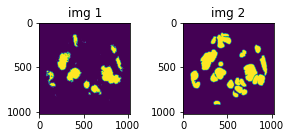

0.6673986911773682


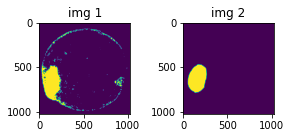

0.6963757872581482


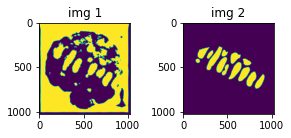

0.33079245686531067


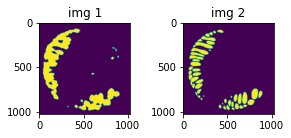

0.7916427254676819


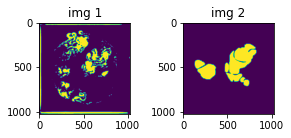

0.322753369808197


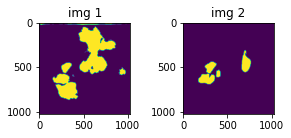

0.32468509674072266


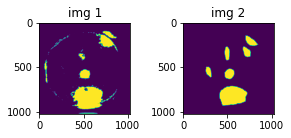

0.7483522295951843


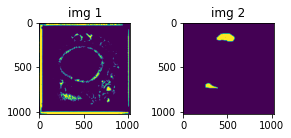

0.03882494196295738


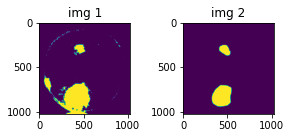

0.668428361415863


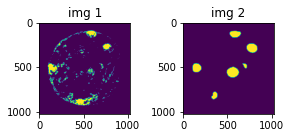

0.43938305974006653


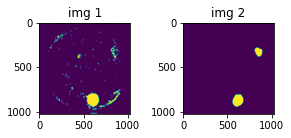

0.6374642252922058


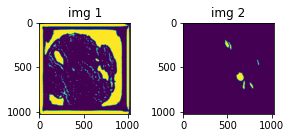

0.003236965974792838


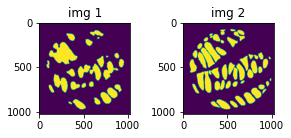

0.7787911295890808


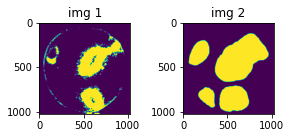

0.600232720375061


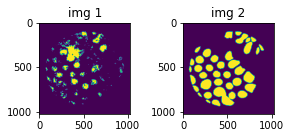

0.3087177872657776


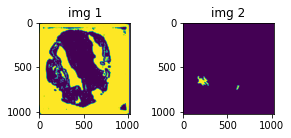

0.0007194312056526542


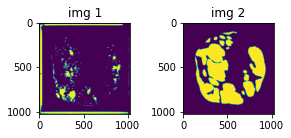

0.18387117981910706


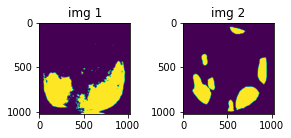

0.6306484341621399


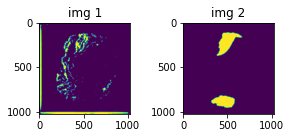

0.186397522687912


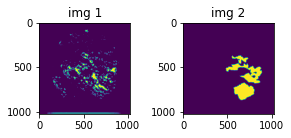

0.20290474593639374


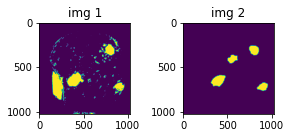

0.5944327712059021


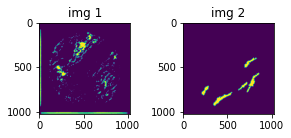

0.03776637464761734


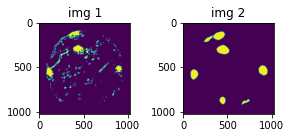

0.4998766779899597


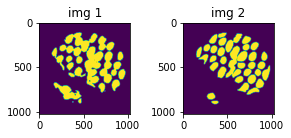

0.8361835479736328


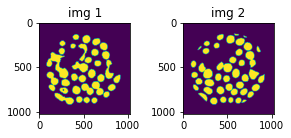

0.8550130128860474


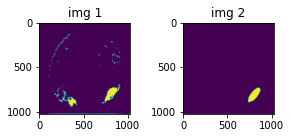

0.6174858212471008


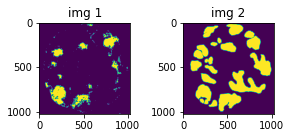

0.3433246910572052


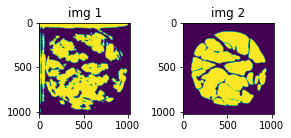

0.7505358457565308


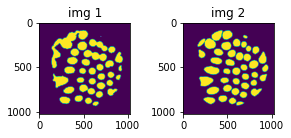

0.88364177942276


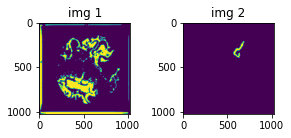

0.046413604170084


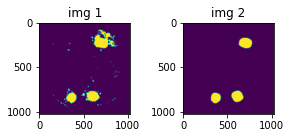

0.8016854524612427


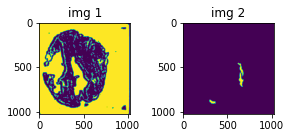

0.002966935047879815


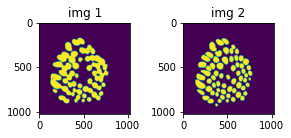

0.8900777101516724


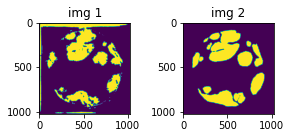

0.7565914988517761


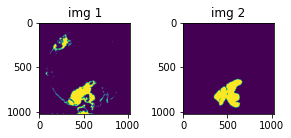

0.6655073165893555


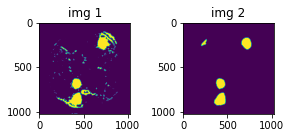

0.7451584339141846


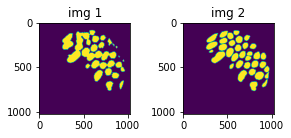

0.8588884472846985


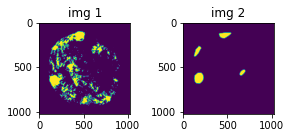

0.26200735569000244


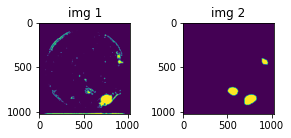

0.5750342607498169


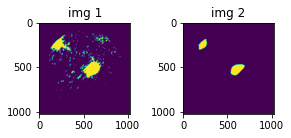

0.6013805270195007


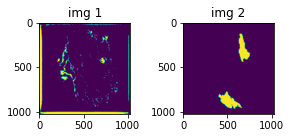

0.013653550297021866


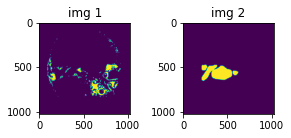

0.07036430388689041


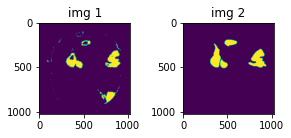

0.6746885776519775


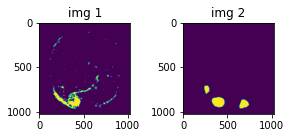

0.46171602606773376


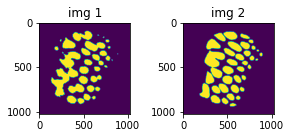

0.8231580257415771


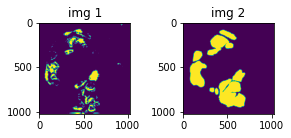

0.38548657298088074


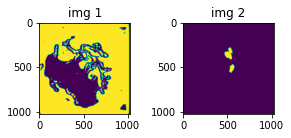

0.013659436255693436


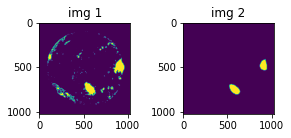

0.6245339512825012


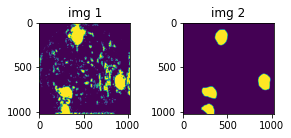

0.6315367817878723


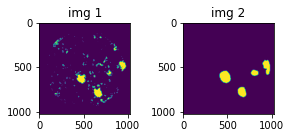

0.6364103555679321


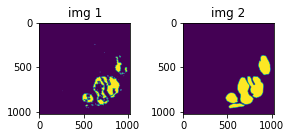

0.6508786678314209


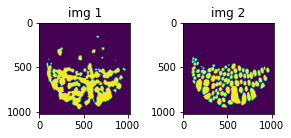

0.7845962643623352


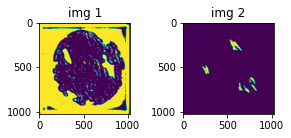

0.0010642448905855417


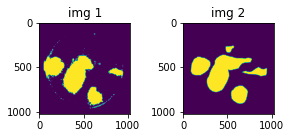

0.8313992023468018


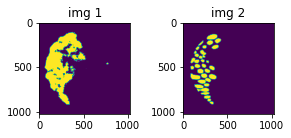

0.6343506574630737


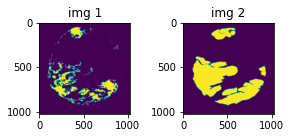

0.4411907196044922


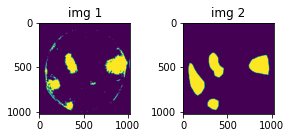

0.7455810308456421


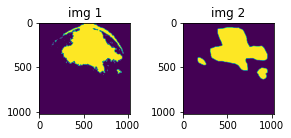

0.8136070966720581


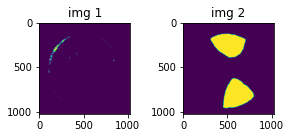

0.0003801399434451014


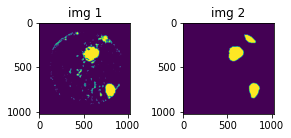

0.8051313757896423


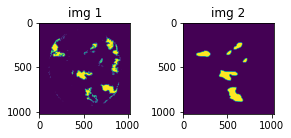

0.37389370799064636


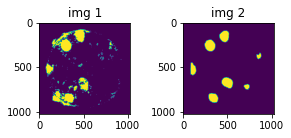

0.6706722974777222


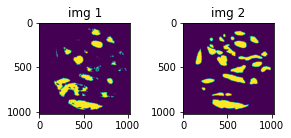

0.5600863695144653


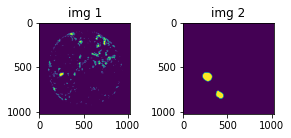

0.09990797191858292


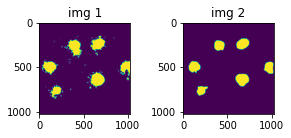

0.8364850282669067


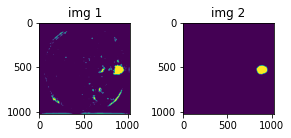

0.6742812395095825


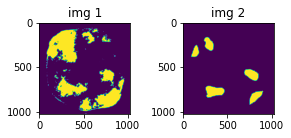

0.43929633498191833


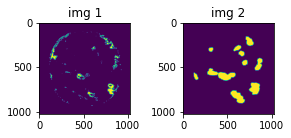

0.2238759547472


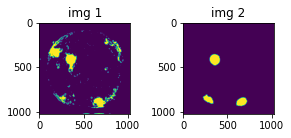

0.529408872127533


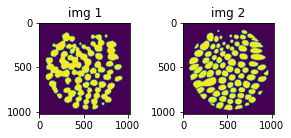

0.864085853099823


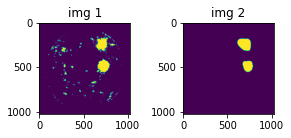

0.7335520386695862


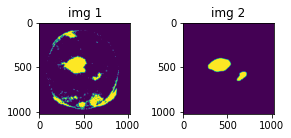

0.5467205047607422


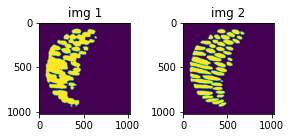

0.841698944568634


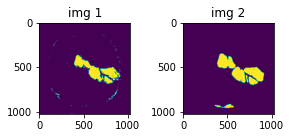

0.7703897356987


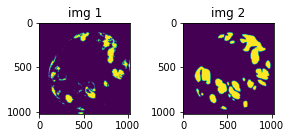

0.5456879138946533


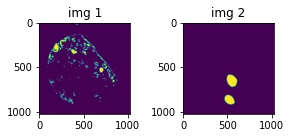

2.1776530047645792e-05


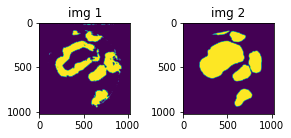

0.7744274139404297


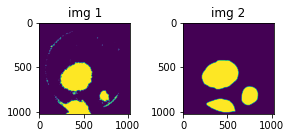

0.7681961059570312


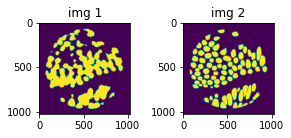

0.7990152835845947


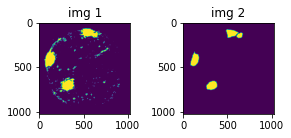

0.7337471842765808


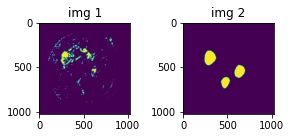

0.33416256308555603


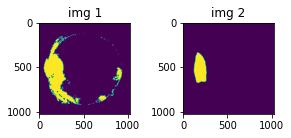

0.5305004715919495


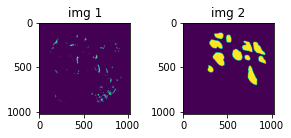

0.06532340496778488


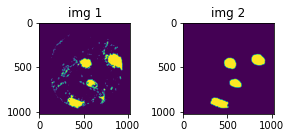

0.7708251476287842


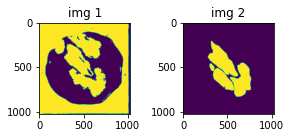

0.2991231381893158


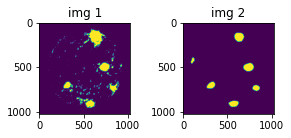

0.6855798959732056


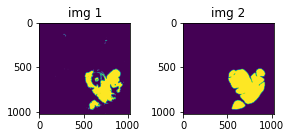

0.7917773723602295


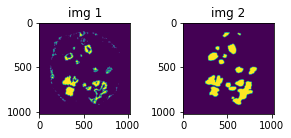

0.5802146196365356


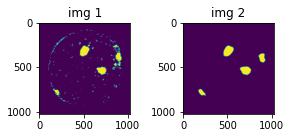

0.7672725319862366


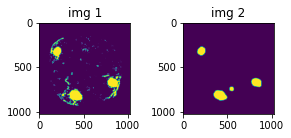

0.7362785935401917


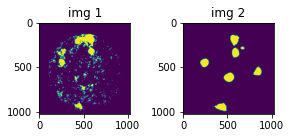

0.42480191588401794


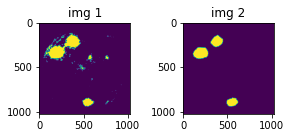

0.8007599115371704


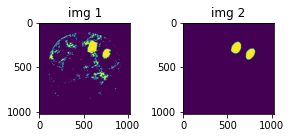

0.5913521647453308


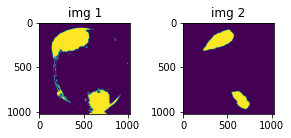

0.6190550327301025


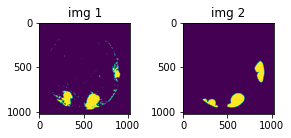

0.6477782726287842


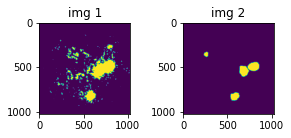

0.5726321935653687


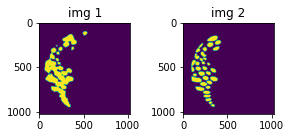

0.7795224189758301


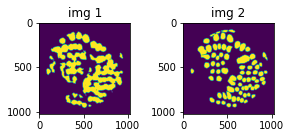

0.7974547743797302


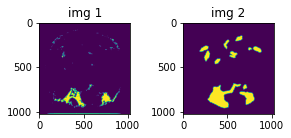

0.40769949555397034


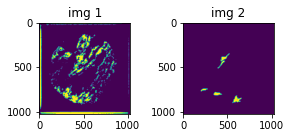

0.0705283060669899


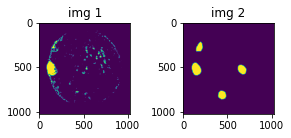

0.431453675031662


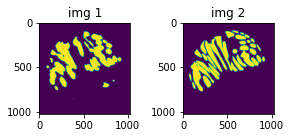

0.7663522362709045


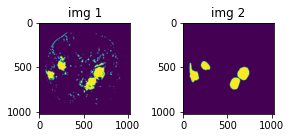

0.7512016892433167


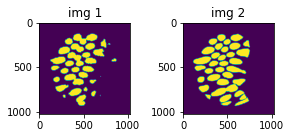

0.8223195672035217


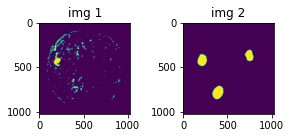

0.2609832286834717


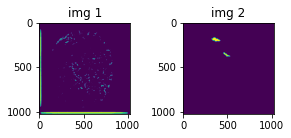

0.006477797869592905


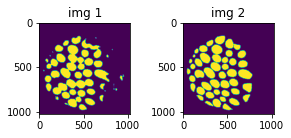

0.8796845078468323


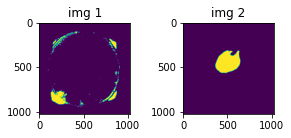

1.3379358279053122e-05


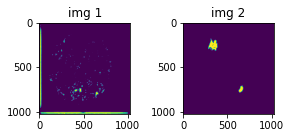

0.0018954395782202482


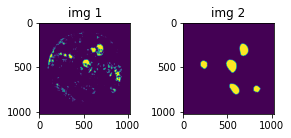

0.30535274744033813


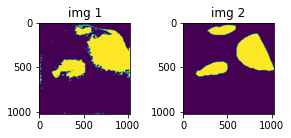

0.7863122820854187


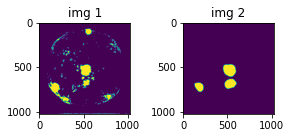

0.6029375195503235


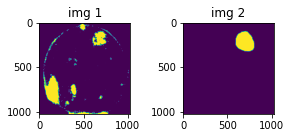

0.2963242530822754


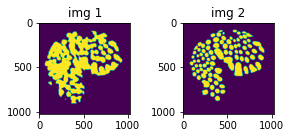

0.793965220451355


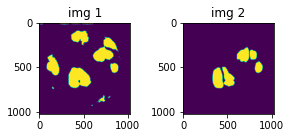

0.6655870676040649


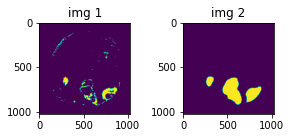

0.43599551916122437


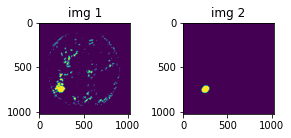

0.3986508548259735


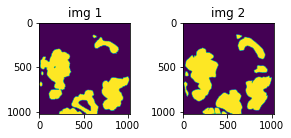

0.8599896430969238


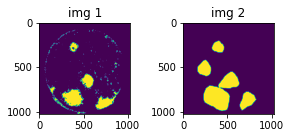

0.5535532832145691


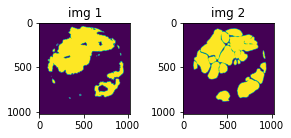

0.8137744665145874


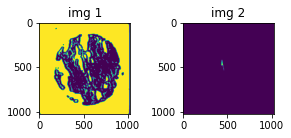

0.0002182775060646236


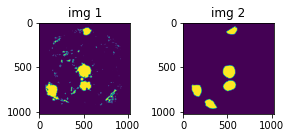

0.7297826409339905


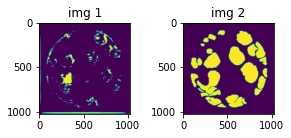

0.1918809711933136


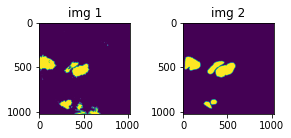

0.7701228857040405


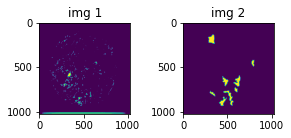

0.03215830400586128


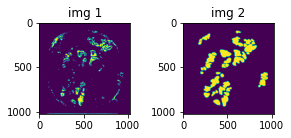

0.36673927307128906


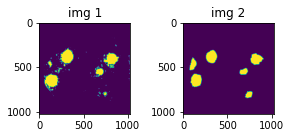

0.7972820401191711


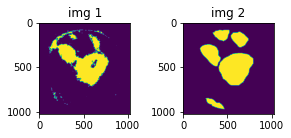

0.77767014503479


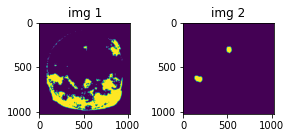

0.07034972310066223


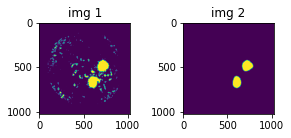

0.7439612746238708


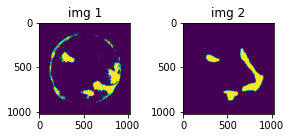

0.5387617349624634


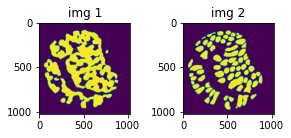

0.8060038089752197


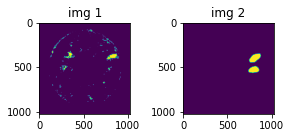

0.3086468577384949


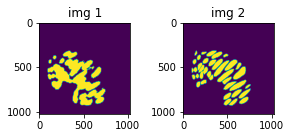

0.8028490543365479


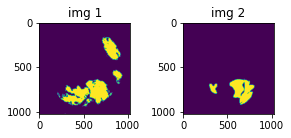

0.5094273686408997


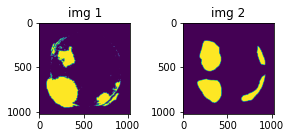

0.6290705800056458


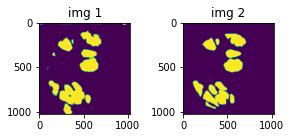

0.8870497345924377


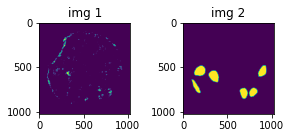

0.0841168686747551


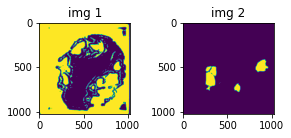

0.06025244668126106


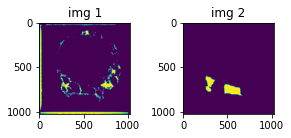

0.0990622341632843


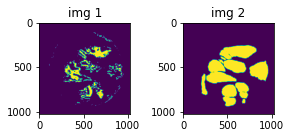

0.39178386330604553


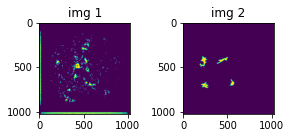

0.02723383903503418


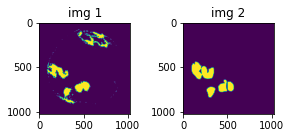

0.6435686945915222


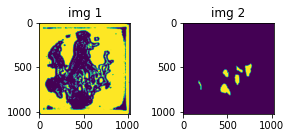

0.019698666408658028


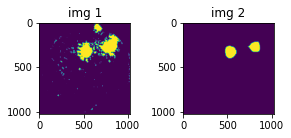

0.5757450461387634


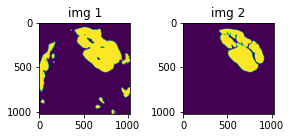

0.7685552835464478


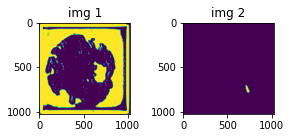

2.628024276418728e-06


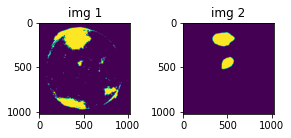

0.42463886737823486


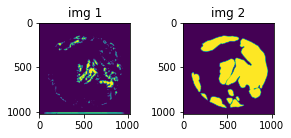

0.2073245495557785


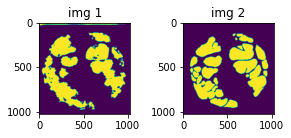

0.8024813532829285


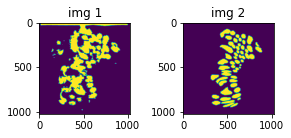

0.6442267894744873


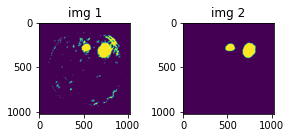

0.7742505073547363


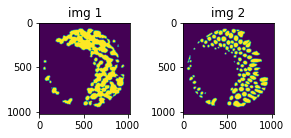

0.7709565758705139


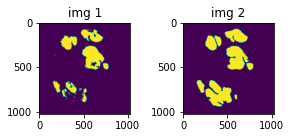

0.758150577545166


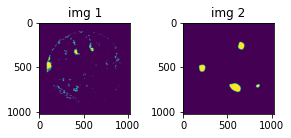

0.0025099869817495346


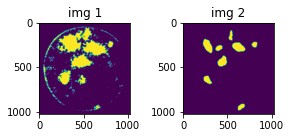

0.47370773553848267


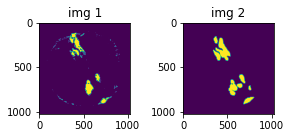

0.618415355682373


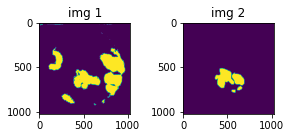

0.3489307463169098


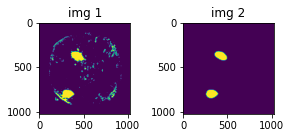

0.7333849668502808


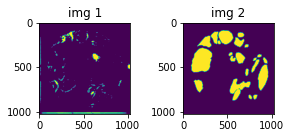

0.13380767405033112


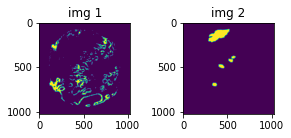

0.055639367550611496


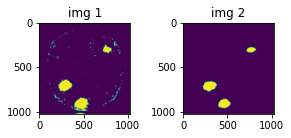

0.8099881410598755


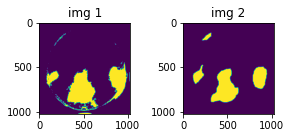

0.7828283309936523


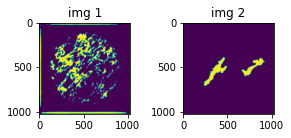

0.1491435319185257


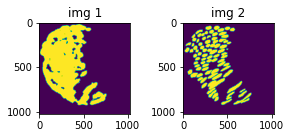

0.7253040671348572


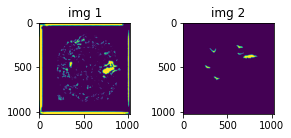

0.0035637635737657547


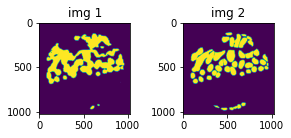

0.8421155214309692


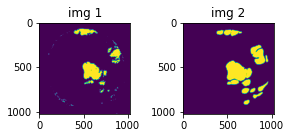

0.6519720554351807


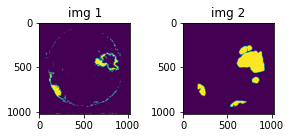

0.3723849654197693


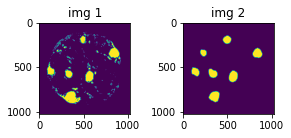

0.7464090585708618


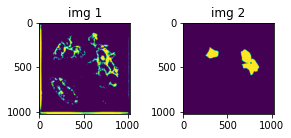

0.16722185909748077


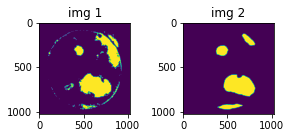

0.7215278148651123


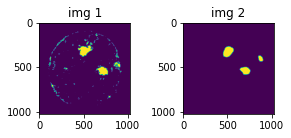

0.6389399766921997


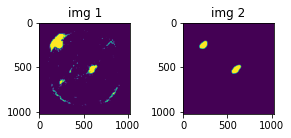

0.5955551862716675


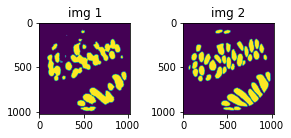

0.832848846912384


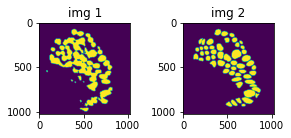

0.7838078737258911
FOLD: 0, EPOCH: 1, valid_loss: 0.750571492720734 , Val Dice COE : 0.5166132234888129
Saved model for best score : FOLD0_best_score.pth
Saved model for best loss : FOLD0_best_loss.pth


  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 2, train_loss: 0.6922856298514775 , Dice coe : 0.5546712940447625 
0.5692010521888733
0.6505686640739441
0.3186222314834595
0.6348137259483337
0.30021828413009644
0.31576621532440186
0.7539629936218262
8.9613939053379e-05
0.6012333035469055
0.20280961692333221
0.6686692833900452
0.0009304924169555306
0.6228625774383545
0.7495009899139404
0.2944924831390381
1.6263151110251783e-06
0.0993710607290268
0.5833024382591248
7.440713670803234e-05
0.008327051997184753
0.6824339032173157
0.00013241144188214093
0.401787668466568
0.8047316670417786
0.7651587128639221
0.784207820892334
0.3446276783943176
0.26096034049987793
0.7537065744400024
0.002480903174728155
0.7580509781837463
1.633904162190447e-06
0.804794430732727
0.48572051525115967
0.7483511567115784
0.8172942996025085
0.7801673412322998
0.4954308271408081
0.6659714579582214
0.5896790027618408
1.7419903315385454e-06
0.04282262921333313
0.5956324934959412
0.3077037036418915
0.6677639484405518
0.31657674908638
0.00726000592112

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 3, train_loss: 0.6913389331953866 , Dice coe : 0.5311705239080038 
0.691145122051239
0.7731701135635376
0.6094747185707092
0.5675364136695862
0.46890711784362793
0.3143209218978882
0.7403494119644165
5.260666148387827e-05
0.7115722894668579
0.7004600167274475
0.71142578125
0.005325034726411104
0.5929150581359863
0.6657359004020691
0.023458005860447884
0.007094521075487137
0.24201005697250366
0.6666695475578308
0.0018351306207478046
0.2875002920627594
0.7878029942512512
3.752486009034328e-05
0.7292542457580566
0.7350145578384399
0.6961872577667236
0.7883251905441284
0.28077635169029236
0.6288581490516663
0.7461827993392944
6.811061030020937e-05
0.8514317870140076
0.0016821690369397402
0.6825570464134216
0.7396459579467773
0.783428966999054
0.8878891468048096
0.7154510021209717
0.5838849544525146
0.8353583812713623
0.7954075932502747
0.0003725619171746075
0.20482872426509857
0.7894249558448792
0.7078695893287659
0.6798008680343628
0.5174677968025208
0.06997161358594894
0.

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 4, train_loss: 0.6973492852279118 , Dice coe : 0.4720363030693391 
0.41186362504959106
0.694696307182312
0.6391806602478027
0.36733368039131165
0.41331222653388977
0.28574955463409424
0.667104184627533
0.0013745796168223023
0.6876326203346252
0.7660079598426819
0.6110777854919434
0.11304515600204468
0.5618515610694885
0.6996546387672424
0.20410315692424774
0.03795433044433594
0.4590115249156952
0.6023429036140442
0.532972514629364
0.4795944392681122
0.7566545009613037
0.12244541198015213
0.8001790046691895
0.751772940158844
0.7332963347434998
0.433097243309021
0.28927773237228394
0.2747475206851959
0.7931765913963318
0.0398111417889595
0.7947735786437988
0.14318834245204926
0.7319331765174866
0.45413652062416077
0.7761752605438232
0.8323129415512085
0.7373781204223633
0.5062676668167114
0.7787759304046631
0.6279848217964172
0.33658409118652344
0.1683778464794159
0.7067418694496155
0.6726167798042297
0.7429249882698059
0.5743233561515808
0.033807482570409775
0.5577698349

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 5, train_loss: 0.699170948266983 , Dice coe : 0.45359289739841446 
0.5151785612106323
0.643688440322876
0.4942910969257355
0.5346584320068359
0.06518127769231796
0.25143882632255554
0.6610764861106873
4.2580370063660666e-05
0.5398229360580444
0.7187727093696594
0.43116214871406555
0.001171417417936027
0.5114070773124695
0.5797650814056396
0.6188778281211853
2.5364358862134395e-06
0.1417149007320404
0.6965414881706238
0.05141827464103699
0.4540356993675232
0.7007414698600769
0.0006013016682118177
0.7688589692115784
0.736347496509552
0.6668523550033569
0.5487871170043945
0.38194790482521057
0.15650370717048645
0.7174015045166016
0.06305699050426483
0.766313374042511
0.004833487328141928
0.6308058500289917
0.4697757661342621
0.5520557165145874
0.8707388043403625
0.6163807511329651
0.29914727807044983
0.7966691851615906
0.16600370407104492
0.00027088422211818397
0.02149384096264839
0.6150551438331604
0.5084148049354553
0.48816779255867004
0.5101609826087952
0.00107067986391

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 6, train_loss: 0.6974160655907222 , Dice coe : 0.3941689899029903 


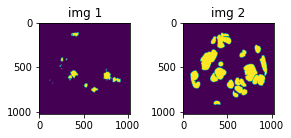

0.19388695061206818


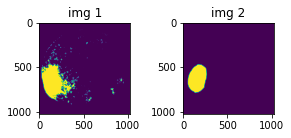

0.7048296332359314


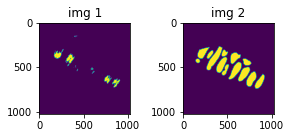

0.23406778275966644


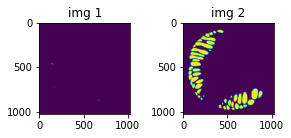

0.02165815606713295


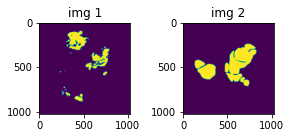

0.23982758820056915


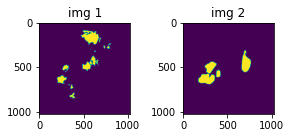

0.18467941880226135


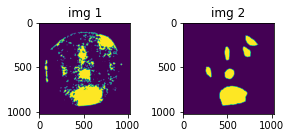

0.6901406049728394


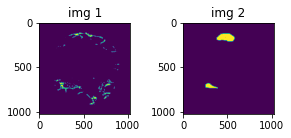

0.11367769539356232


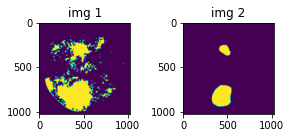

0.47229740023612976


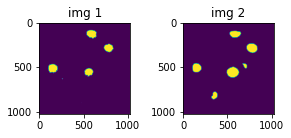

0.7454550266265869


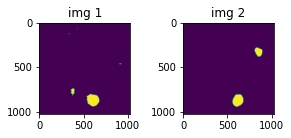

0.6753634214401245


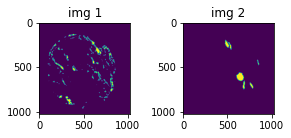

0.02671719901263714


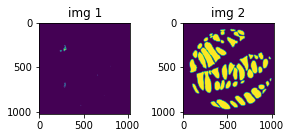

0.01895959861576557


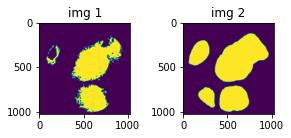

0.7440047860145569


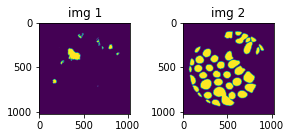

0.02227758802473545


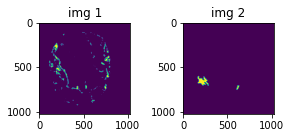

0.01397231686860323


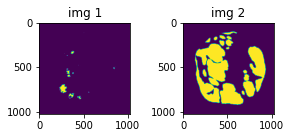

0.05392866209149361


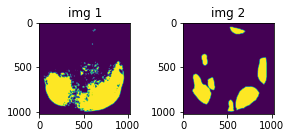

0.6176127791404724


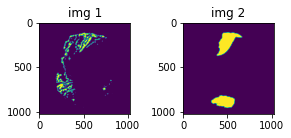

0.24841922521591187


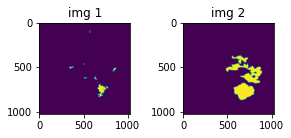

0.16547131538391113


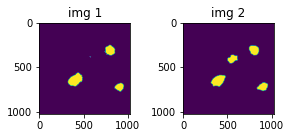

0.7997686862945557


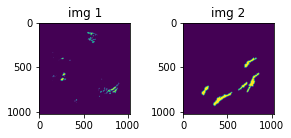

0.0016250043408945203


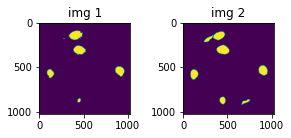

0.7792536616325378


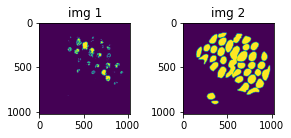

0.14227069914340973


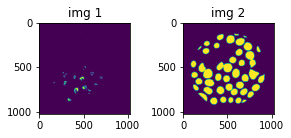

0.038349103182554245


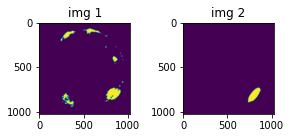

0.4691762328147888


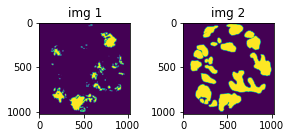

0.3131973147392273


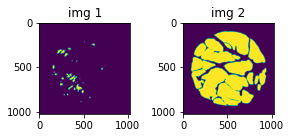

0.05398508533835411


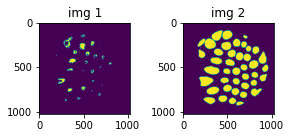

0.1287318468093872


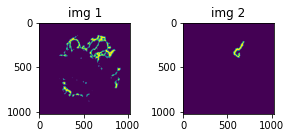

0.11810750514268875


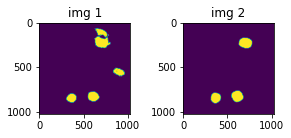

0.7439579963684082


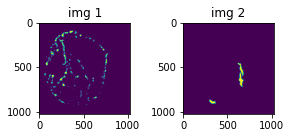

4.0118749893736094e-05


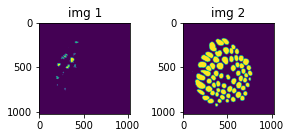

0.04542186111211777


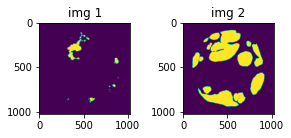

0.14790739119052887


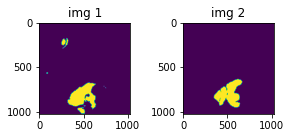

0.7474973797798157


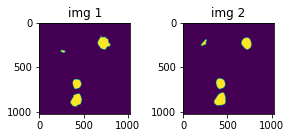

0.8596386909484863


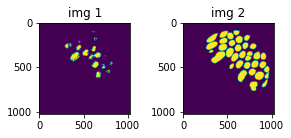

0.24597731232643127


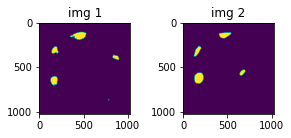

0.6165096759796143


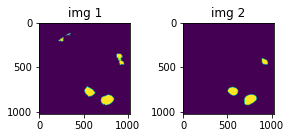

0.7714015245437622


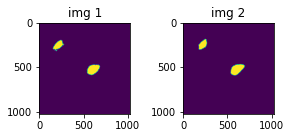

0.9077131748199463


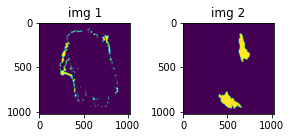

0.024762535467743874


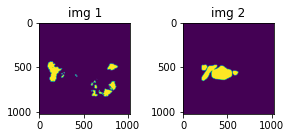

0.037000447511672974


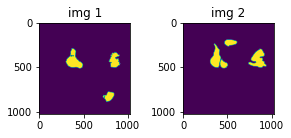

0.6607113480567932


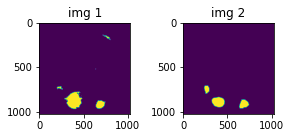

0.6943932175636292


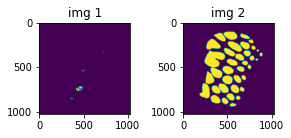

0.012387563474476337


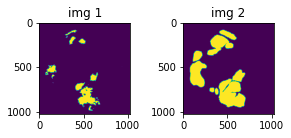

0.3991466164588928


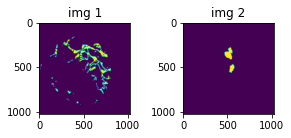

0.10506992787122726


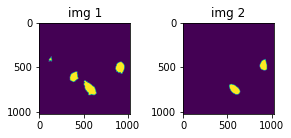

0.6375570893287659


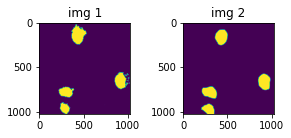

0.8457697629928589


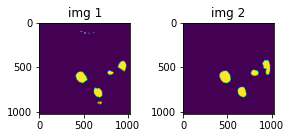

0.836843729019165


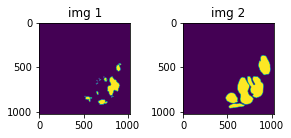

0.3878919780254364


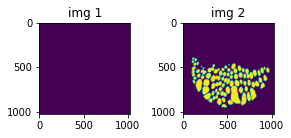

0.004883855581283569


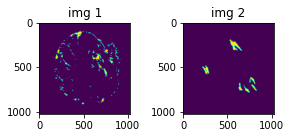

2.7473282898426987e-05


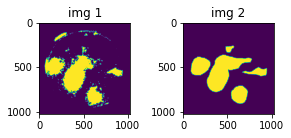

0.8408820629119873


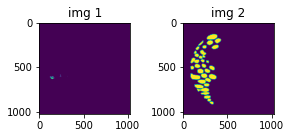

0.03090704046189785


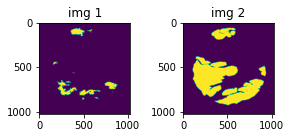

0.23549866676330566


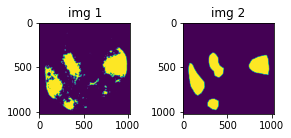

0.7971143126487732


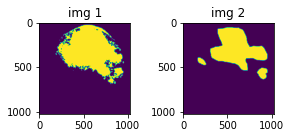

0.7544334530830383


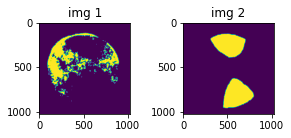

0.033713825047016144


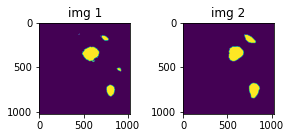

0.800502598285675


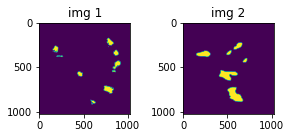

0.08323889970779419


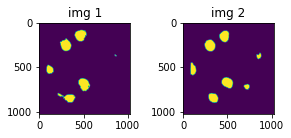

0.8150408864021301


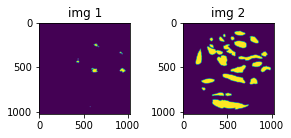

0.0466168150305748


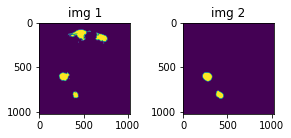

0.47987496852874756


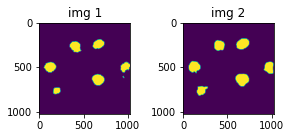

0.8466865420341492


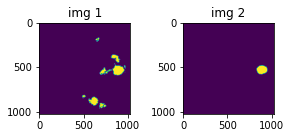

0.4847204387187958


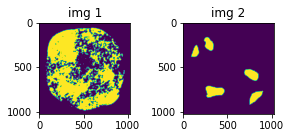

0.2736194431781769


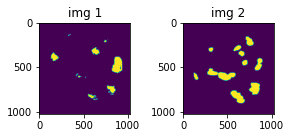

0.3037426471710205


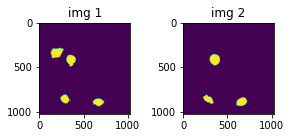

0.6836205720901489


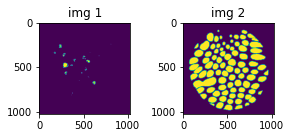

0.023892585188150406


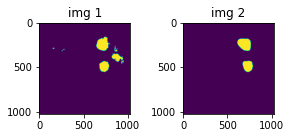

0.747746467590332


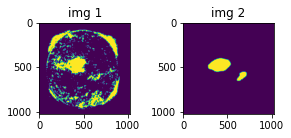

0.38474565744400024


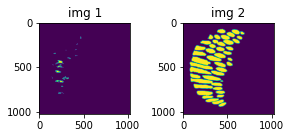

0.033261947333812714


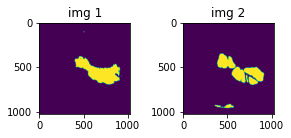

0.8188965320587158


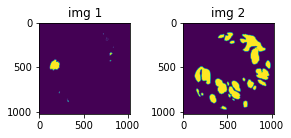

0.021296273916959763


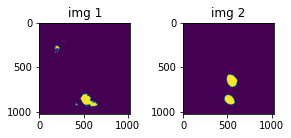

0.48942315578460693


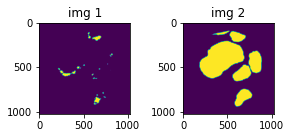

0.09370297938585281


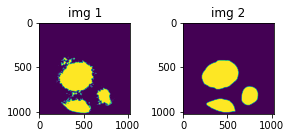

0.8496477007865906


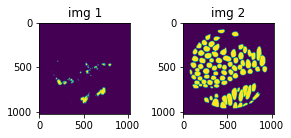

0.08202432841062546


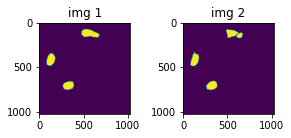

0.9041752219200134


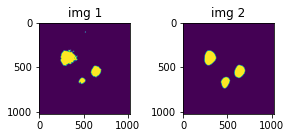

0.7895286083221436


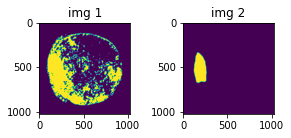

0.28968796133995056


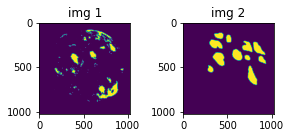

0.1347699761390686


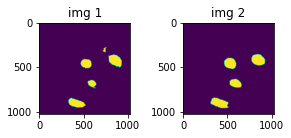

0.8318873643875122


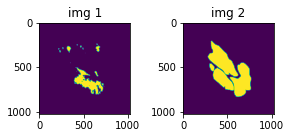

0.36213207244873047


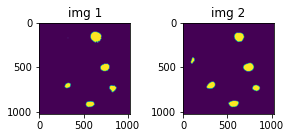

0.8129704594612122


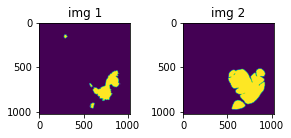

0.5104139447212219


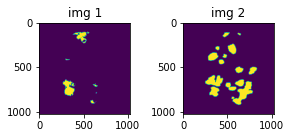

0.25747886300086975


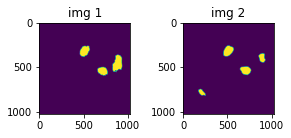

0.6845383644104004


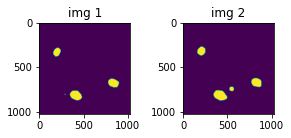

0.8406769633293152


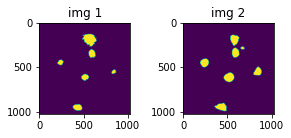

0.6821955442428589


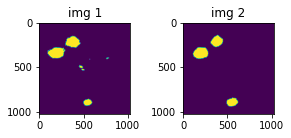

0.8508540391921997


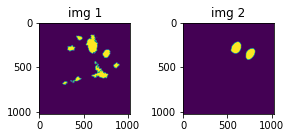

0.4832232892513275


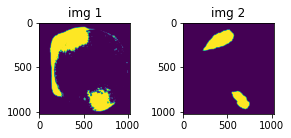

0.596886932849884


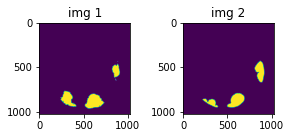

0.6890827417373657


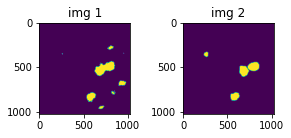

0.7836808562278748


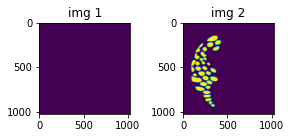

0.011101392097771168


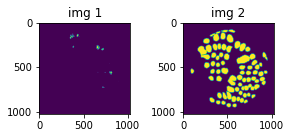

0.03772624209523201


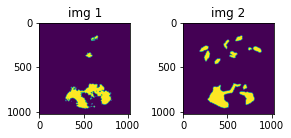

0.6136835813522339


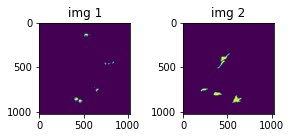

6.776904047001153e-05


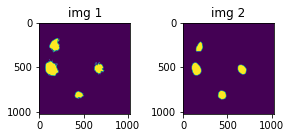

0.7737907767295837


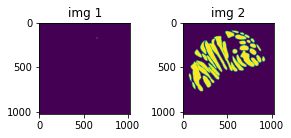

0.0035275891423225403


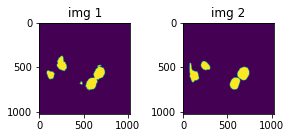

0.8148758411407471


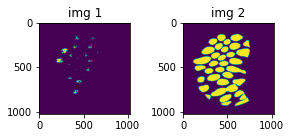

0.04764411970973015


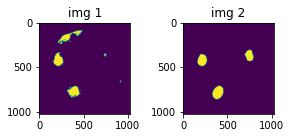

0.6244427561759949


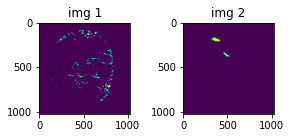

0.0002303616638528183


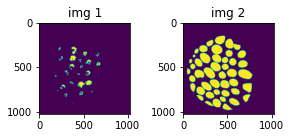

0.12301616370677948


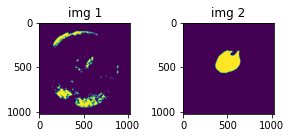

0.06984006613492966


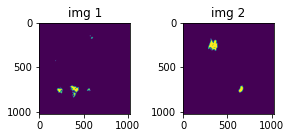

6.312732875812799e-05


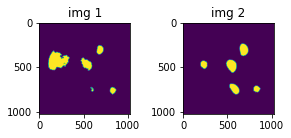

0.48422664403915405


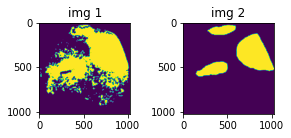

0.6178382039070129


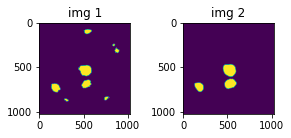

0.7683157324790955


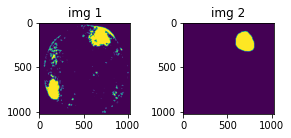

0.4530096650123596


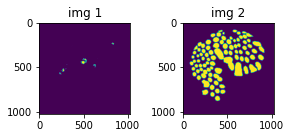

0.018654311075806618


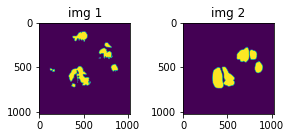

0.5273793339729309


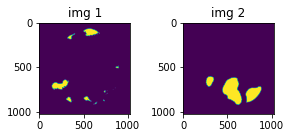

0.1088545098900795


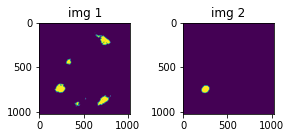

0.3597729802131653


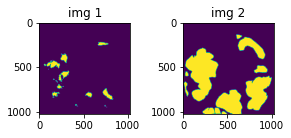

0.16543932259082794


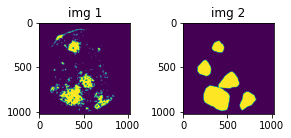

0.5901765823364258


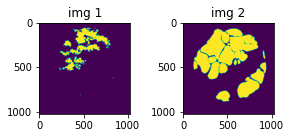

0.33913978934288025


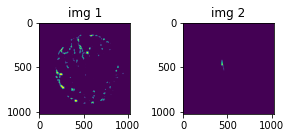

9.239582141162828e-05


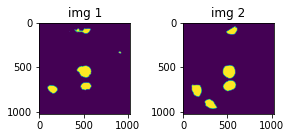

0.6967585682868958


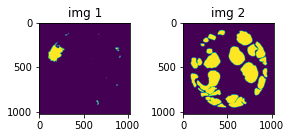

0.02160276100039482


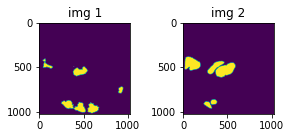

0.35305526852607727


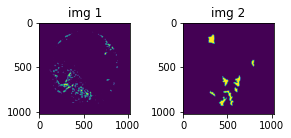

0.037350382655858994


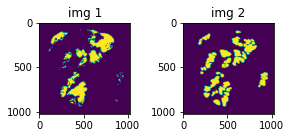

0.6501345038414001


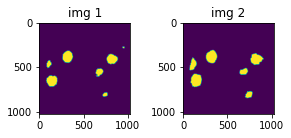

0.8425074815750122


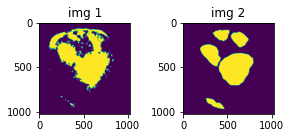

0.8072066903114319


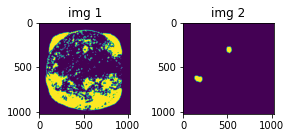

0.06086138263344765


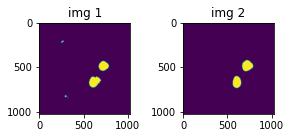

0.8369073867797852


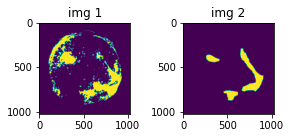

0.5115241408348083


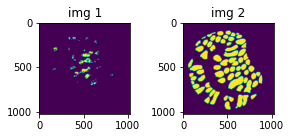

0.10325585305690765


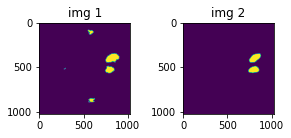

0.7604397535324097


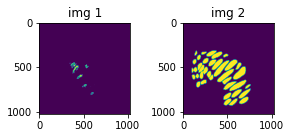

0.05882607400417328


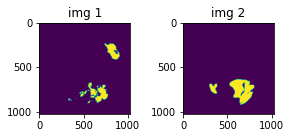

0.4264029264450073


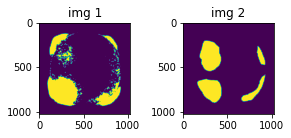

0.5289943218231201


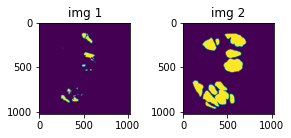

0.17437022924423218


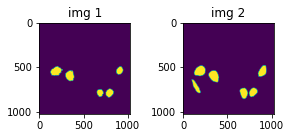

0.752960205078125


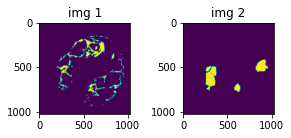

0.12655551731586456


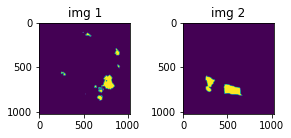

0.000361786806024611


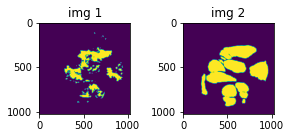

0.449178546667099


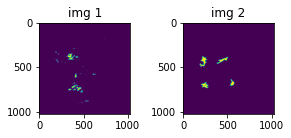

0.00079345703125


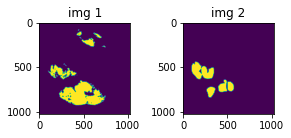

0.44871971011161804


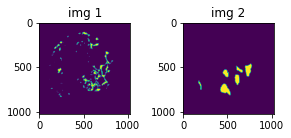

0.09699153155088425


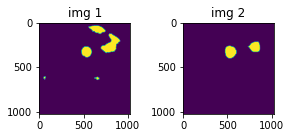

0.6188417077064514


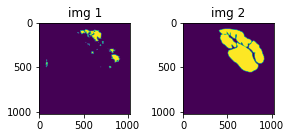

0.20037610828876495


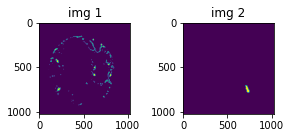

9.159186447504908e-05


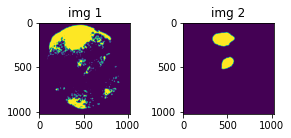

0.36002078652381897


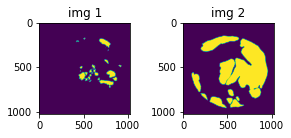

0.17360801994800568


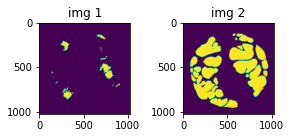

0.13797079026699066


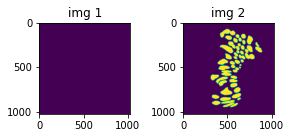

0.0034244542475789785


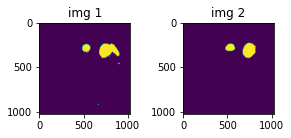

0.8110491633415222


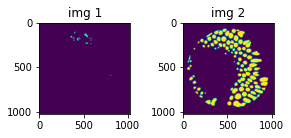

0.03959174454212189


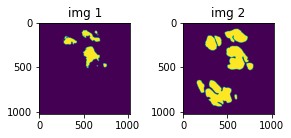

0.38719063997268677


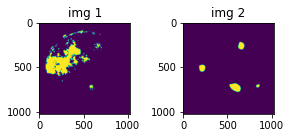

0.1351923942565918


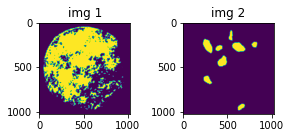

0.21973051130771637


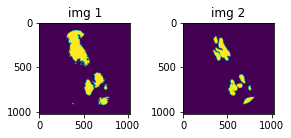

0.7240636348724365


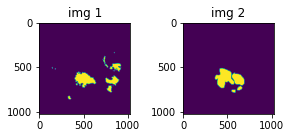

0.45132023096084595


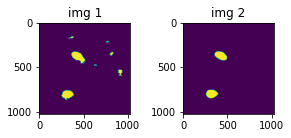

0.8055859208106995


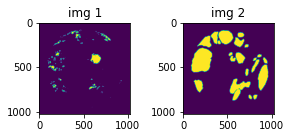

0.14499971270561218


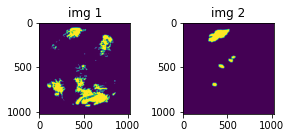

0.171483114361763


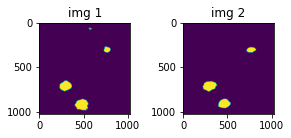

0.8325362801551819


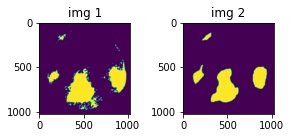

0.8153261542320251


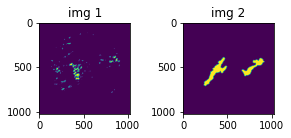

0.1259552389383316


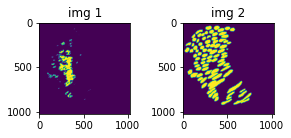

0.1695195734500885


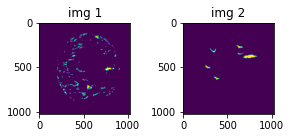

4.724781319964677e-05


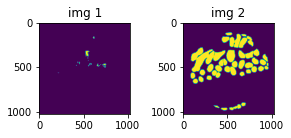

0.0321335569024086


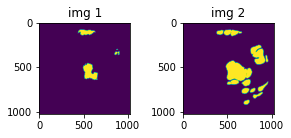

0.3839649260044098


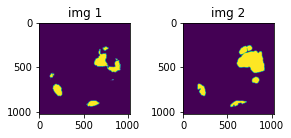

0.6240500211715698


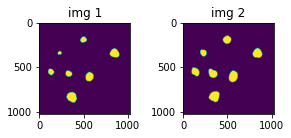

0.7502267360687256


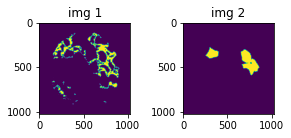

0.22704406082630157


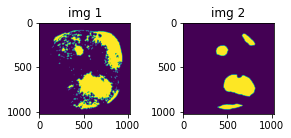

0.5981278419494629


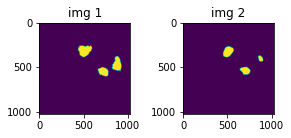

0.6480161547660828


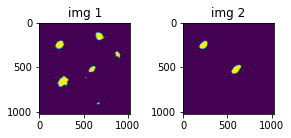

0.4521772861480713


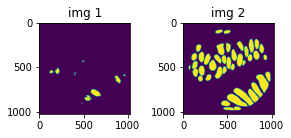

0.1139560267329216


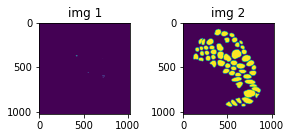

0.01093475241214037
FOLD: 0, EPOCH: 6, valid_loss: 0.7423406984995712 , Val Dice COE : 0.3851731879614342


  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 7, train_loss: 0.6835662410940443 , Dice coe : 0.4505955407095202 
0.4526084065437317
0.0889274924993515
0.6395525932312012
0.34119051694869995
0.3806432783603668
0.2862655818462372
0.47671037912368774
0.10607591271400452
0.3897152543067932
0.20485618710517883
0.30230480432510376
0.06484953314065933
0.3733302354812622
0.570030927658081
0.09964415431022644
0.017365863546729088
0.44604411721229553
0.42630165815353394
0.09884428232908249
0.26571840047836304
0.2095050811767578
0.08838328719139099
0.21652087569236755
0.649934709072113
0.5714725255966187
0.13024365901947021
0.1135353371500969
0.5275572538375854
0.620671272277832
0.2023322731256485
0.26416510343551636
0.02607656829059124
0.5753358602523804
0.6503804922103882
0.6299124956130981
0.30081766843795776
0.7046641707420349
0.1676427721977234
0.16824933886528015
0.20773029327392578
0.03023126721382141
0.3811389207839966
0.4046267867088318
0.20014901459217072
0.5172700881958008
0.6505535244941711
0.20863987505435944
0.1

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 8, train_loss: 0.7015375721454621 , Dice coe : 0.5187687984576795 
0.2667050361633301
0.6048412919044495
0.5351530909538269
0.15180416405200958
0.5207542181015015
0.3183123767375946
0.726729691028595
5.077173045719974e-05
0.36929720640182495
0.35883355140686035
0.7177050709724426
0.007009705528616905
0.3462846279144287
0.8233058452606201
0.00043200055370107293
9.966114885173738e-05
0.33490055799484253
0.6251184940338135
1.6253026842605323e-05
0.027694540098309517
0.7518458366394043
3.961808033636771e-05
0.37265899777412415
0.6559287309646606
0.48378780484199524
0.6110439896583557
0.12957286834716797
0.4079955816268921
0.5099219083786011
0.13163454830646515
0.9033138155937195
0.00010511931031942368
0.43989112973213196
0.5173408389091492
0.7734891176223755
0.8999658226966858
0.5540115237236023
0.6233575344085693
0.39148131012916565
0.8187664151191711
2.215673703176435e-05
0.08114307373762131
0.5949884057044983
0.606283962726593
0.22788332402706146
0.4056249260902405
0.065

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 9, train_loss: 0.7055908359800066 , Dice coe : 0.3793634895147209 
0.570995032787323
0.22005410492420197
0.5068472623825073
0.6062516570091248
0.4240626394748688
0.2492906004190445
0.13921944797039032
0.13989803194999695
0.3965059518814087
0.39670512080192566
0.21265149116516113
0.006397901568561792
0.6426090598106384
0.47102245688438416
0.5006495118141174
0.05361324921250343
0.7862287759780884
0.021254852414131165
0.374955415725708
0.3153593838214874
0.3192752003669739
0.13021260499954224
0.49663087725639343
0.7139923572540283
0.6918741464614868
0.23895642161369324
0.6707314848899841
0.6877949833869934
0.7033841609954834
0.04410325363278389
0.42099088430404663
0.17612320184707642
0.7720552086830139
0.7932482957839966
0.6533858180046082
0.3154040575027466
0.6478704214096069
0.1226162388920784
0.4558058977127075
0.08063631504774094
0.33058515191078186
0.3173186779022217
0.6344025135040283
0.1750095933675766
0.8099604249000549
0.7224366664886475
0.15772995352745056
0.1562

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 10, train_loss: 0.7023100064482007 , Dice coe : 0.44112203587388127 
0.6207218766212463
0.5086361169815063
0.7340855002403259
0.6565251350402832
0.5626333951950073
0.3311733603477478
0.5579692721366882
0.005853165872395039
0.8211788535118103
0.3853178918361664
0.6873207092285156
0.07750774174928665
0.6605743765830994
0.1766122430562973
0.36880284547805786
0.0010812109103426337
0.43076369166374207
0.6410843729972839
0.26320454478263855
0.14018553495407104
0.7521768808364868
0.00028946646489202976
0.001633227220736444
0.8027474880218506
0.7755917310714722
0.541913628578186
0.45226535201072693
0.5826688408851624
0.8232384920120239
0.10159613937139511
0.6379836797714233
0.11404586583375931
0.8684511184692383
0.6540462374687195
0.7228068113327026
0.885093629360199
0.8113608360290527
0.2825546860694885
0.46936866641044617
0.2509915828704834
0.04077756032347679
0.32390835881233215
0.7590147256851196
0.5617008209228516
0.8073492646217346
0.5008766055107117
0.2914656102657318
0.

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 11, train_loss: 0.6939581385680608 , Dice coe : 0.454230507635314 


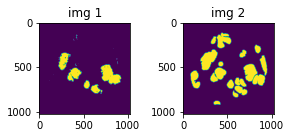

0.5666004419326782


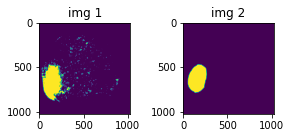

0.77876877784729


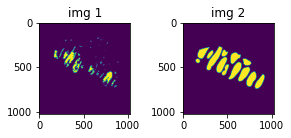

0.3883582353591919


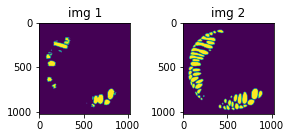

0.4736996293067932


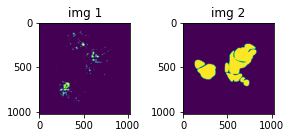

0.03762244060635567


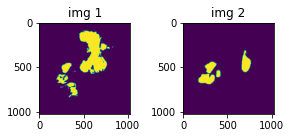

0.3453969359397888


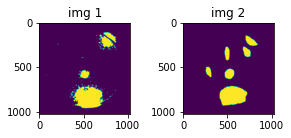

0.744892954826355


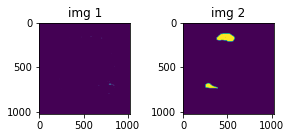

0.00037858300493098795


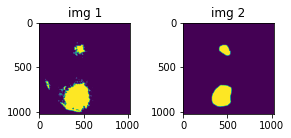

0.7421998381614685


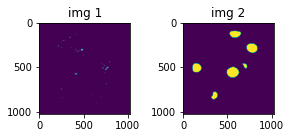

0.00015626045933458954


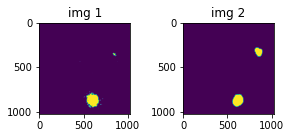

0.6985880136489868


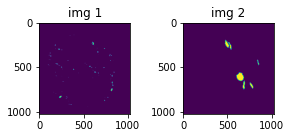

0.0002217458822997287


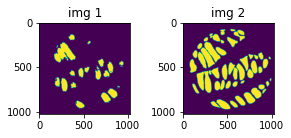

0.5177754163742065


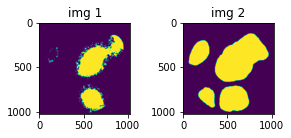

0.5707066655158997


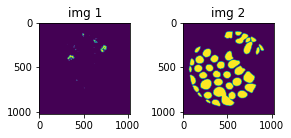

0.03726135194301605


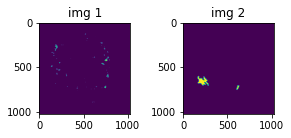

0.0001035625537042506


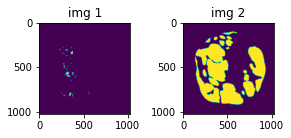

0.02195694111287594


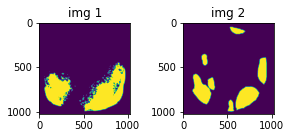

0.6707979440689087


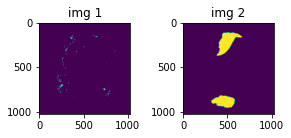

0.00698239216580987


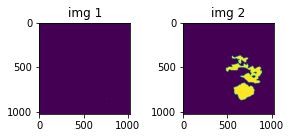

0.0002889179449994117


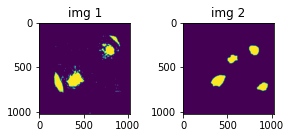

0.5548499226570129


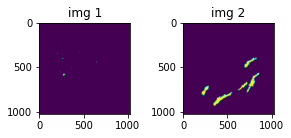

0.0005162212764844298


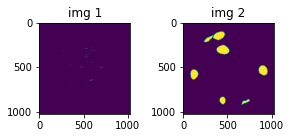

2.1258050765027292e-05


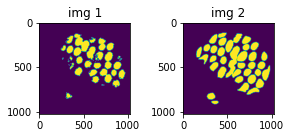

0.723844051361084


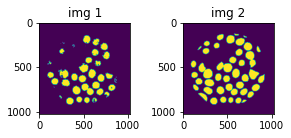

0.7263866662979126


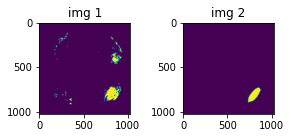

0.6374927759170532


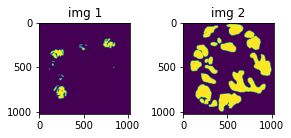

0.15823739767074585


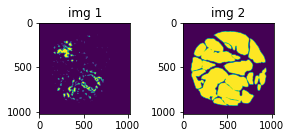

0.10209362208843231


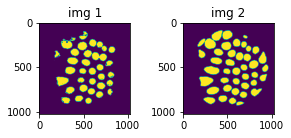

0.789570152759552


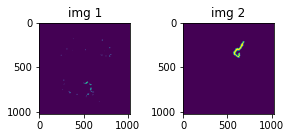

0.00014513787755277008


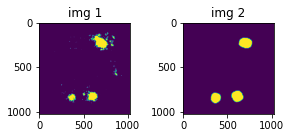

0.7123968601226807


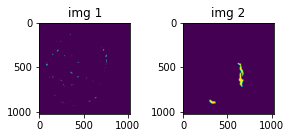

0.00030156815773807466


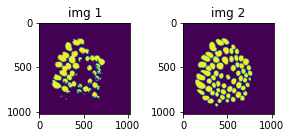

0.7111132740974426


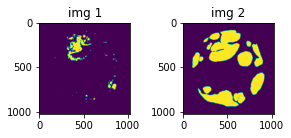

0.21635732054710388


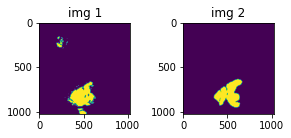

0.7392730116844177


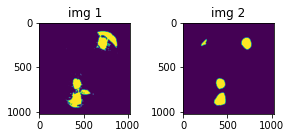

0.7119777798652649


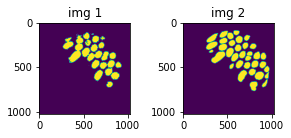

0.7998465895652771


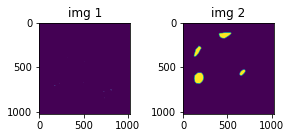

4.193575296085328e-05


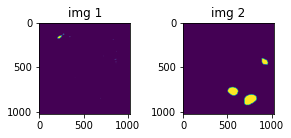

0.0014726027147844434


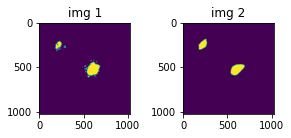

0.806937575340271


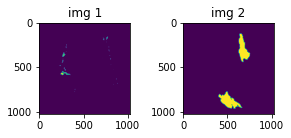

2.1928381102043204e-05


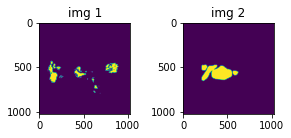

0.15053655207157135


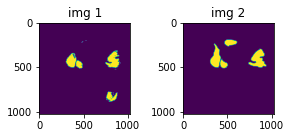

0.6871830821037292


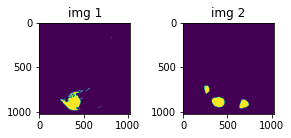

0.5327809453010559


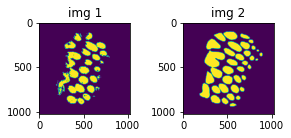

0.7531253695487976


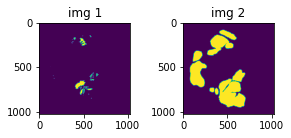

0.10877539217472076


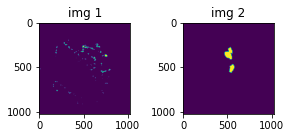

0.017434537410736084


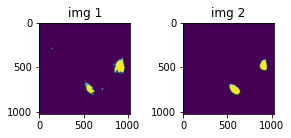

0.7431111931800842


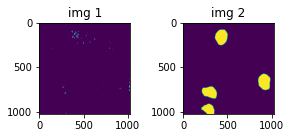

0.03880256786942482


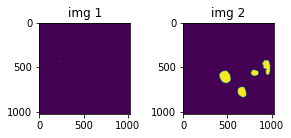

2.8036334697389975e-05


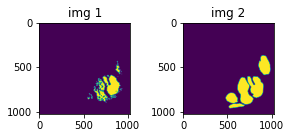

0.5204083919525146


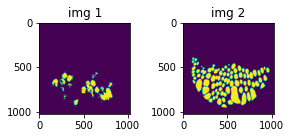

0.3341329097747803


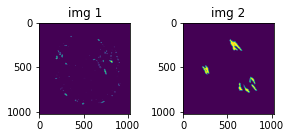

5.097619578009471e-05


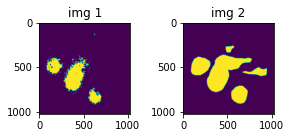

0.6199442744255066


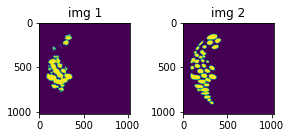

0.6267139911651611


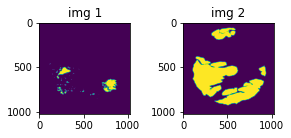

0.14295871555805206


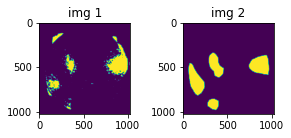

0.5830520391464233


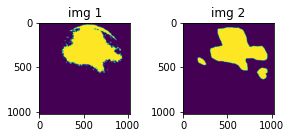

0.8265862464904785


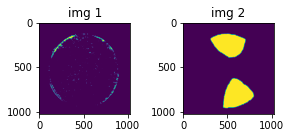

0.028021419420838356


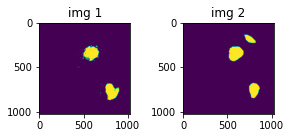

0.7658343315124512


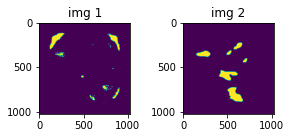

0.09931446611881256


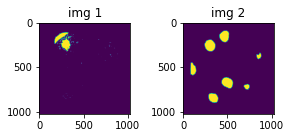

0.2369811236858368


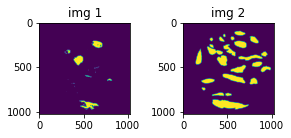

0.2690926194190979


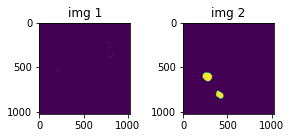

7.252683280967176e-05


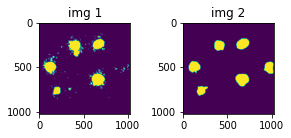

0.7721760869026184


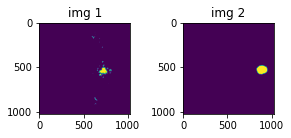

7.121492672013119e-05


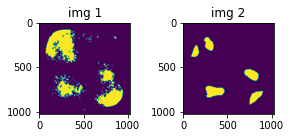

0.5032854080200195


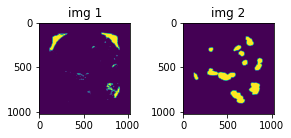

0.08313135802745819


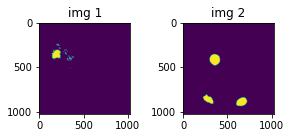

0.020893147215247154


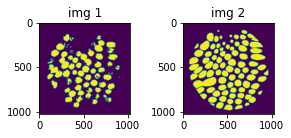

0.6884704828262329


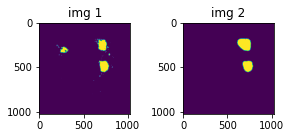

0.7535730004310608


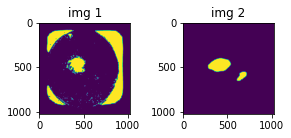

0.23684938251972198


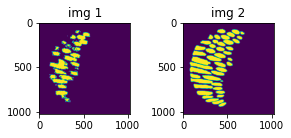

0.5762133598327637


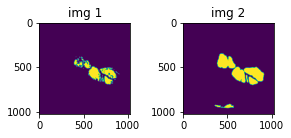

0.6198755502700806


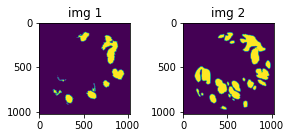

0.5684106349945068


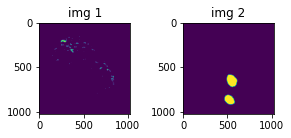

4.238725159666501e-05


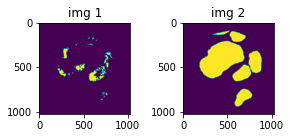

0.1820744127035141


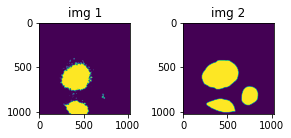

0.6881253123283386


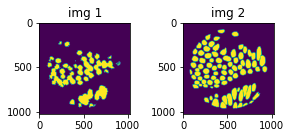

0.637921929359436


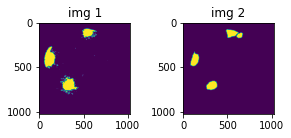

0.7182411551475525


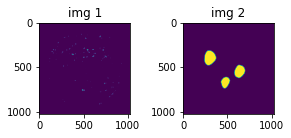

0.000947818742133677


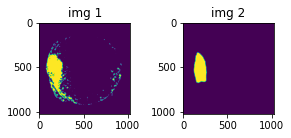

0.7090700268745422


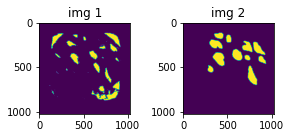

0.3525370657444


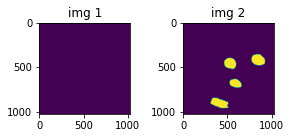

0.0018214936135336757


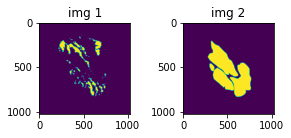

0.20739130675792694


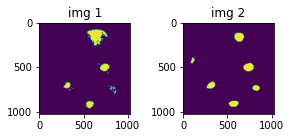

0.673546552658081


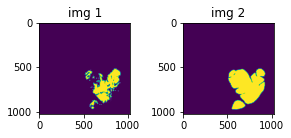

0.6224693655967712


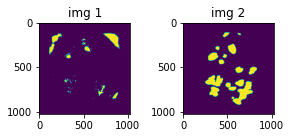

0.12262196838855743


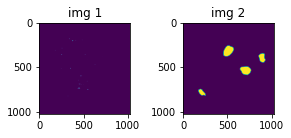

0.0011613992974162102


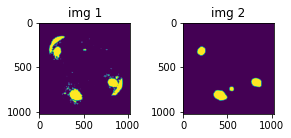

0.6884822845458984


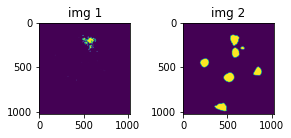

0.12203383445739746


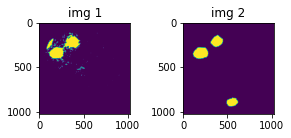

0.7180405855178833


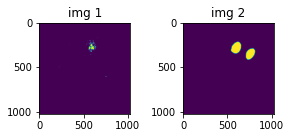

0.23365826904773712


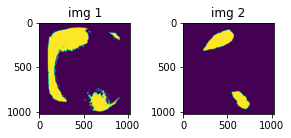

0.5009360909461975


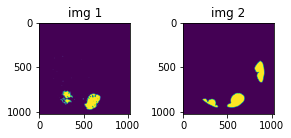

0.5159417986869812


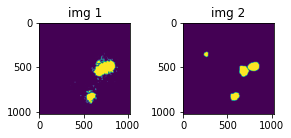

0.7869152426719666


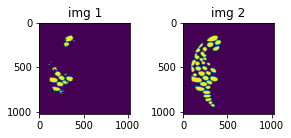

0.47816208004951477


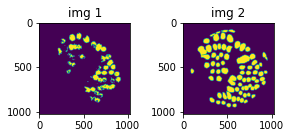

0.5026856064796448


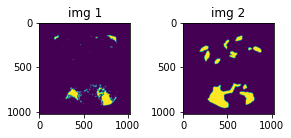

0.3598002791404724


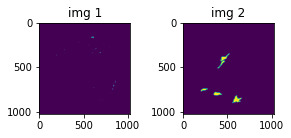

8.47601259010844e-05


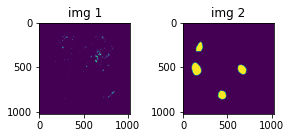

2.8864193154731765e-05


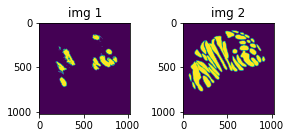

0.35911858081817627


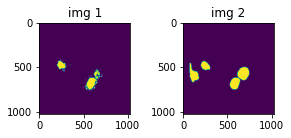

0.5499780178070068


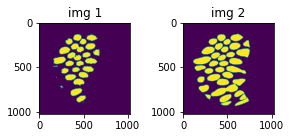

0.6885097026824951


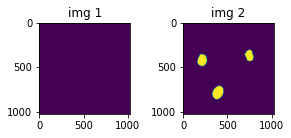

2.9282577088451944e-05


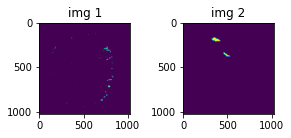

0.0038745386991649866


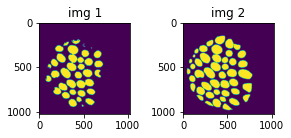

0.7838341593742371


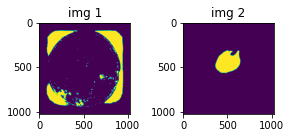

0.00043845802429132164


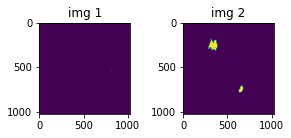

9.590486297383904e-05


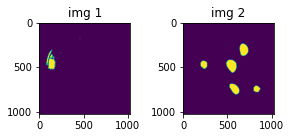

1.9926272216252983e-05


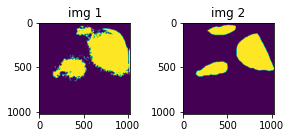

0.7515627145767212


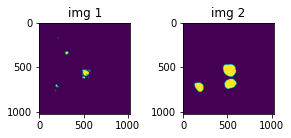

0.1797097772359848


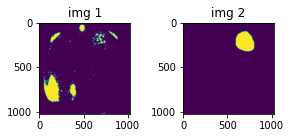

0.08641263842582703


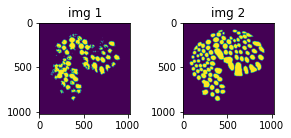

0.6408205032348633


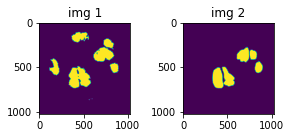

0.7378070950508118


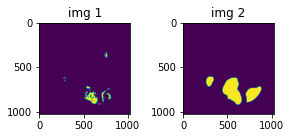

0.2928363084793091


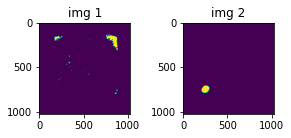

3.3823776902863756e-05


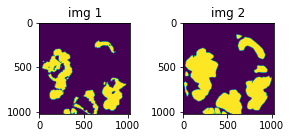

0.7029250264167786


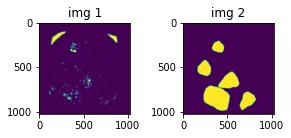

0.07932893931865692


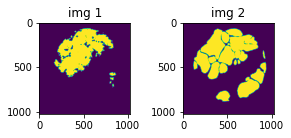

0.6866801381111145


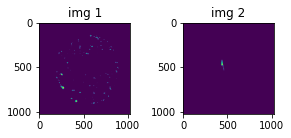

0.00033444815198890865


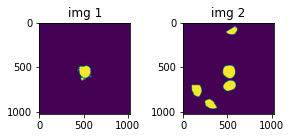

0.37985503673553467


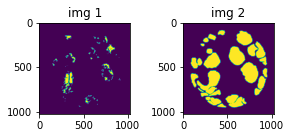

0.14216049015522003


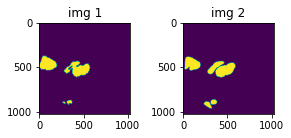

0.8560070395469666


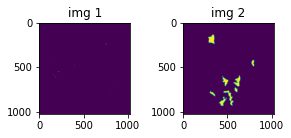

3.9977610867936164e-05


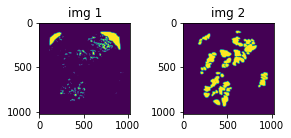

0.12091236561536789


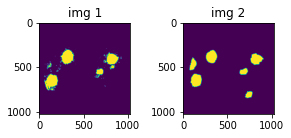

0.7951725125312805


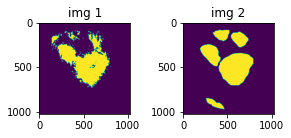

0.8040657639503479


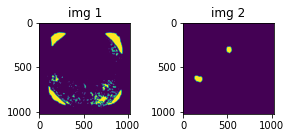

0.05518114194273949


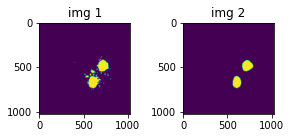

0.8752808570861816


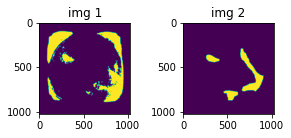

0.31942659616470337


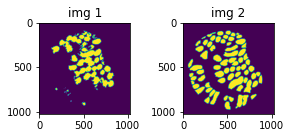

0.6212486624717712


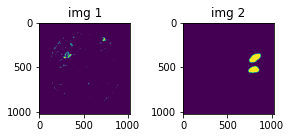

5.3780790040036663e-05


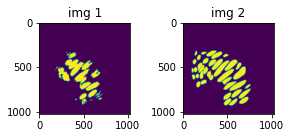

0.6412091255187988


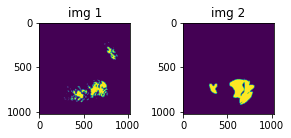

0.3991474509239197


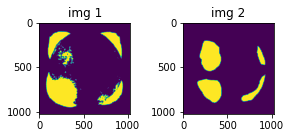

0.41657939553260803


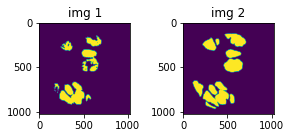

0.7346081733703613


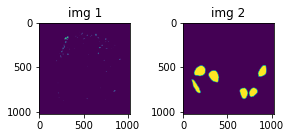

0.0003173121658619493


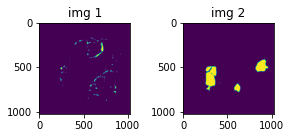

0.00408526137471199


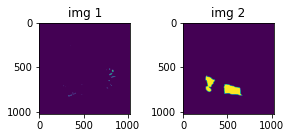

0.0009494004771113396


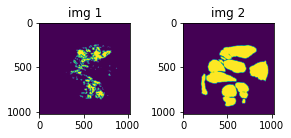

0.2871480882167816


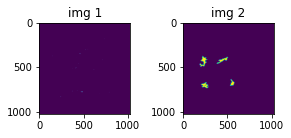

0.0004377900331746787


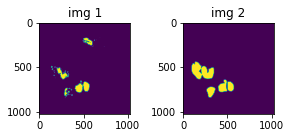

0.48904451727867126


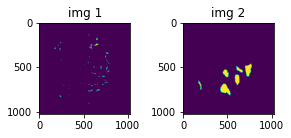

0.015029124915599823


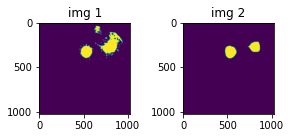

0.7118268609046936


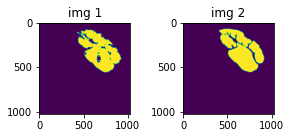

0.8892803192138672


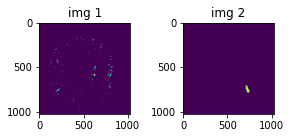

0.0002320185594726354


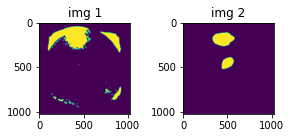

0.4066163897514343


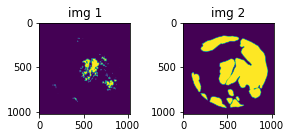

0.146603062748909


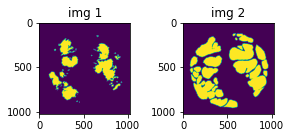

0.5186358094215393


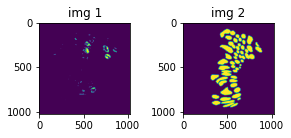

0.0771837830543518


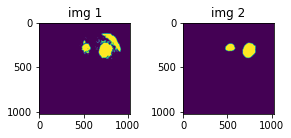

0.735106348991394


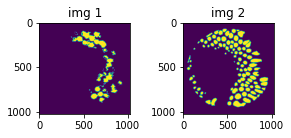

0.46593016386032104


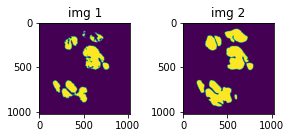

0.7495533227920532


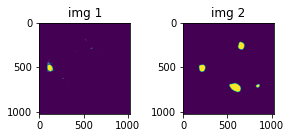

4.4531527237268165e-05


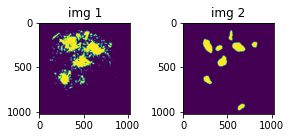

0.48531922698020935


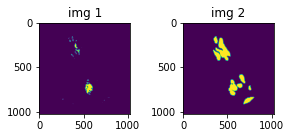

0.2343914657831192


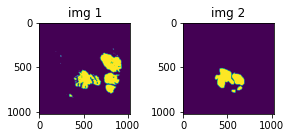

0.3647419810295105


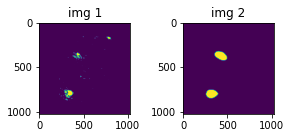

0.4310205578804016


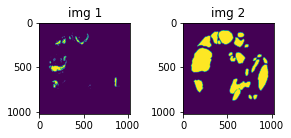

0.13650503754615784


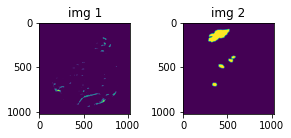

0.0035949868615716696


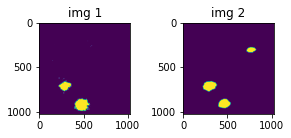

0.7027163505554199


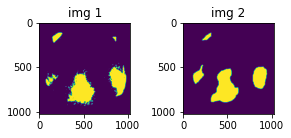

0.7573431134223938


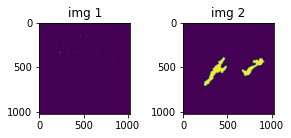

0.0006293783080764115


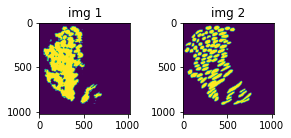

0.7174299359321594


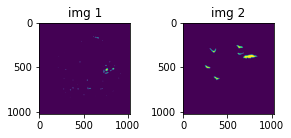

0.00010639429820002988


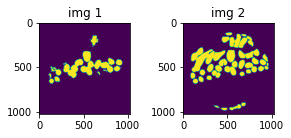

0.5753753185272217


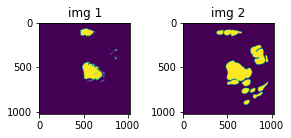

0.48789268732070923


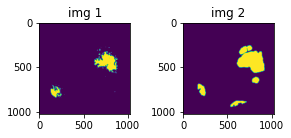

0.534334659576416


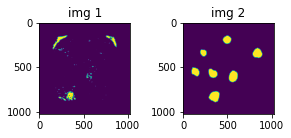

0.1539084017276764


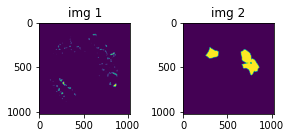

0.006601898930966854


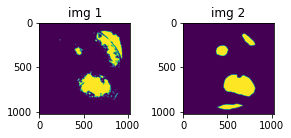

0.6503440737724304


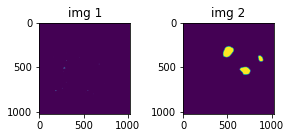

4.7776025894563645e-05


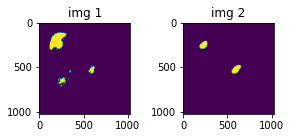

0.40337300300598145


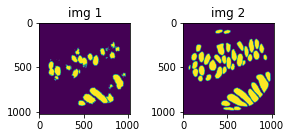

0.5855063796043396


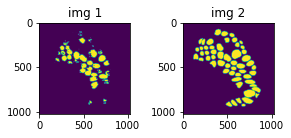

0.5476883053779602
FOLD: 0, EPOCH: 11, valid_loss: 0.7378702939233996 , Val Dice COE : 0.36767318929786474


  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 12, train_loss: 0.6813142052718572 , Dice coe : 0.48516557130180965 
0.3214813768863678
0.8042259216308594
0.6185706257820129
0.424885630607605
0.08613776415586472
0.08812785148620605
0.7782546877861023
1.2441989383660257e-05
0.4827302396297455
0.5520222783088684
0.7314963936805725
2.9892686143284664e-05
0.45032310485839844
0.7374294996261597
0.006416732911020517
2.224991112598218e-05
0.0013747928896918893
0.6613349318504333
1.2292563042137772e-05
0.00012067578791175038
0.7582435011863708
2.167833736166358e-05
0.46714478731155396
0.5212968587875366
0.635768711566925
0.451994925737381
0.07026316225528717
0.18816150724887848
0.6612066030502319
0.00010210333130089566
0.8452937006950378
3.4652435715543106e-05
0.5967273712158203
0.15872390568256378
0.6782238483428955
0.8645234704017639
0.7084609866142273
0.5410929322242737
0.6457964181900024
0.8517636656761169
2.283522189827636e-05
0.19973836839199066
0.4233893156051636
0.5208166241645813
0.6396135091781616
0.039482876658439

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 13, train_loss: 0.6899861429418837 , Dice coe : 0.4701067371511142 
0.06279660761356354
0.18140390515327454
0.004038065671920776
0.05525119975209236
0.0021717767231166363
2.0693223632406443e-05
0.4944290816783905
1.1448328223195858e-05
0.2705036997795105
0.7973496913909912
0.6153362989425659
0.00011203728354303166
0.1997242569923401
0.8457640409469604
0.02177690528333187
7.426771844620816e-06
0.002473267260938883
0.6005584597587585
7.800555067660753e-06
0.0051211644895374775
0.7533971071243286
1.591343061591033e-05
0.7763506770133972
0.01950599066913128
0.09070183336734772
0.04725867509841919
0.5128664374351501
0.0010233301436528563
0.4333708882331848
0.0001273885281989351
0.8511918187141418
6.67334006720921e-06
0.2700482904911041
0.0029532897751778364
0.48633578419685364
0.8354517221450806
0.20792795717716217
0.6433268785476685
0.8441244959831238
0.8160129189491272
7.0393289206549525e-06
0.02955818362534046
0.3116089999675751
0.6611630320549011
0.015259810723364353
0.0

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 14, train_loss: 0.6758181626456125 , Dice coe : 0.5349027786633633 
0.6339131593704224
0.27461501955986023
0.7490549087524414
0.6047353744506836
0.5477277636528015
0.38661035895347595
0.5816716551780701
0.017077399417757988
0.38303661346435547
0.5674133896827698
0.6739957928657532
0.0001247349428012967
0.628865122795105
0.7935731410980225
0.006283821538090706
4.61893760075327e-05
0.3991438150405884
0.6194342374801636
0.0015934029361233115
0.003719800151884556
0.5237935781478882
3.971879050368443e-05
0.4156048595905304
0.8234381079673767
0.8162108063697815
0.17874033749103546
0.0032254867255687714
0.5815169811248779
0.8250070214271545
0.002390438225120306
0.8416915535926819
0.0007882412755861878
0.8483256101608276
0.7063146233558655
0.7344169616699219
0.6401946544647217
0.8201467990875244
0.5774889588356018
0.7327762246131897
0.8543499112129211
0.00037881318712607026
0.00032707402715459466
0.30761316418647766
0.21341851353645325
0.7966252565383911
0.15445171296596527
0.0

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 15, train_loss: 0.6930963601384844 , Dice coe : 0.5533857715737889 
0.5637866258621216
0.5166934132575989
0.6397905945777893
0.5312806367874146
0.4877215027809143
0.30988919734954834
0.2371004968881607
0.04461841285228729
0.38572409749031067
0.18683432042598724
0.5180575251579285
1.723840796330478e-05
0.6308265924453735
0.8375988602638245
0.543599545955658
0.0001585729914950207
0.457583487033844
0.6080553531646729
0.005954904947429895
0.00019566153059713542
0.6881741881370544
3.495770215522498e-05
0.29713311791419983
0.7981609106063843
0.7686854600906372
0.18084487318992615
0.2961009740829468
0.47794967889785767
0.855998694896698
5.8038305724039674e-05
0.7778132557868958
0.0012752409093081951
0.7525883316993713
0.6779641509056091
0.5735546350479126
0.8266813158988953
0.8004979491233826
0.19402115046977997
0.4805680513381958
0.22850745916366577
0.002070292364805937
0.23441779613494873
0.7627859711647034
0.0041335579007864
0.7588514089584351
0.6027766466140747
0.028550080

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 16, train_loss: 0.6971540297780718 , Dice coe : 0.480290028420859 


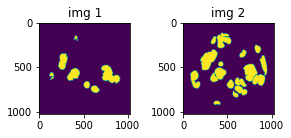

0.5435348153114319


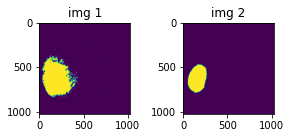

0.6707546710968018


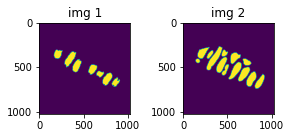

0.6216854453086853


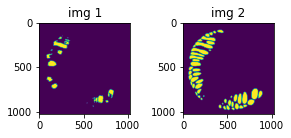

0.3867802619934082


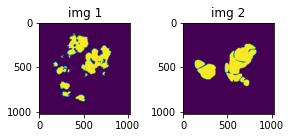

0.4958101809024811


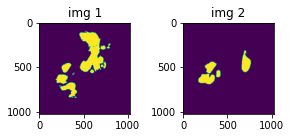

0.3287433683872223


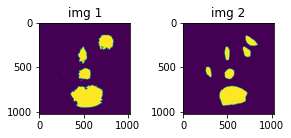

0.7675008773803711


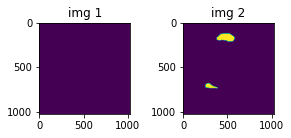

0.0008135813986882567


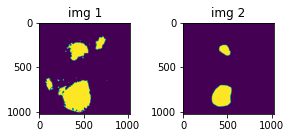

0.5823730826377869


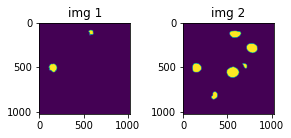

0.28023824095726013


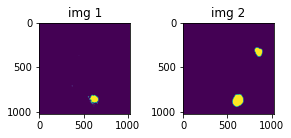

0.464306503534317


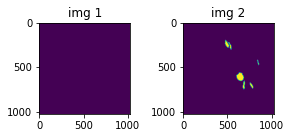

8.31186116556637e-05


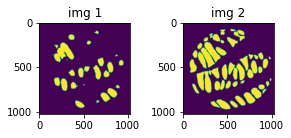

0.5651004910469055


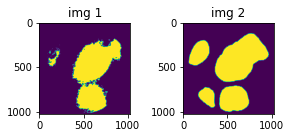

0.7799350023269653


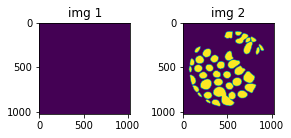

0.023583099246025085


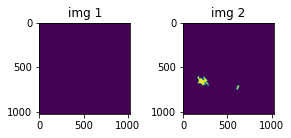

0.00012613521539606154


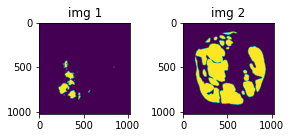

0.15783925354480743


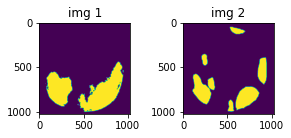

0.7055335640907288


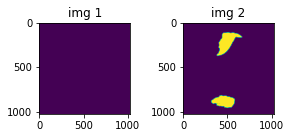

0.00014850994921289384


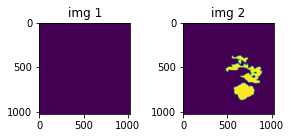

1.3366125131142326e-05


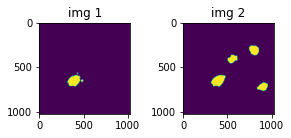

0.486791729927063


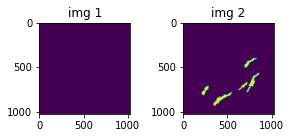

4.0319329855265096e-05


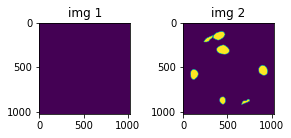

2.0081934053450823e-05


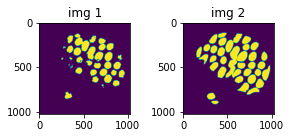

0.7020465135574341


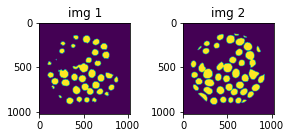

0.7599698901176453


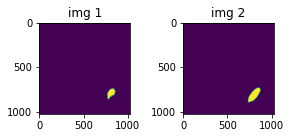

0.6649428606033325


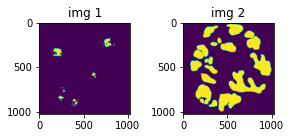

0.07933816313743591


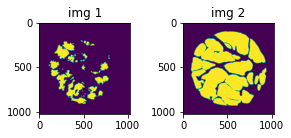

0.36163273453712463


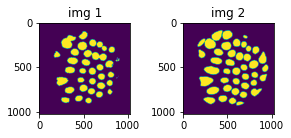

0.8027602434158325


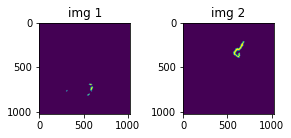

0.00014130280760582536


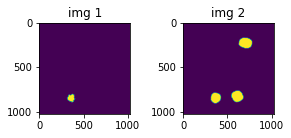

0.22927215695381165


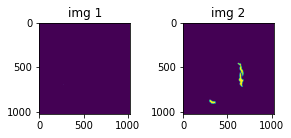

0.00011096316302428022


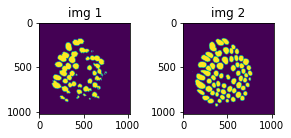

0.7348369359970093


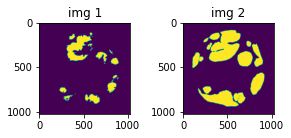

0.4891532361507416


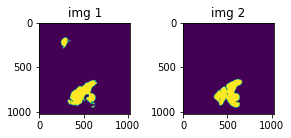

0.7788289785385132


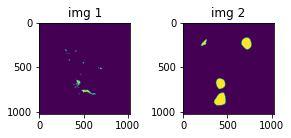

0.06763053685426712


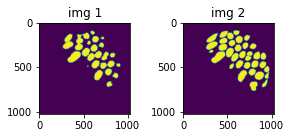

0.7688544988632202


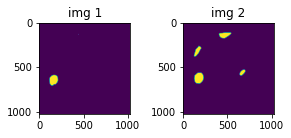

0.41013234853744507


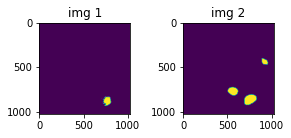

0.32628369331359863


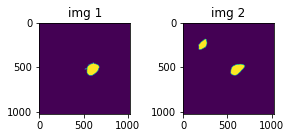

0.7182953953742981


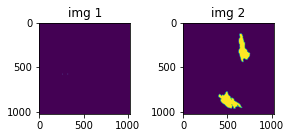

1.904217788251117e-05


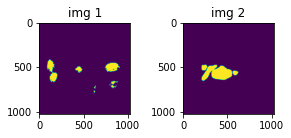

0.0742047131061554


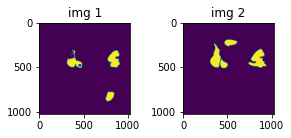

0.6194501519203186


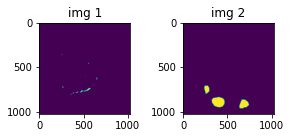

0.010190192610025406


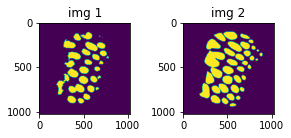

0.7492328882217407


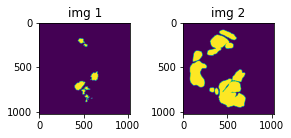

0.19690416753292084


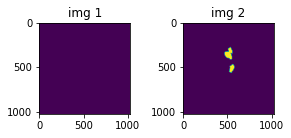

0.0016722407890483737


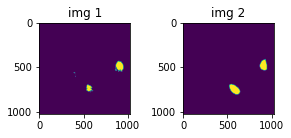

0.7027016878128052


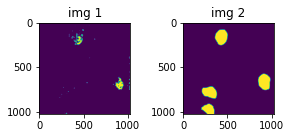

0.24346838891506195


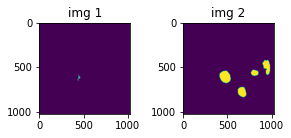

0.0462559275329113


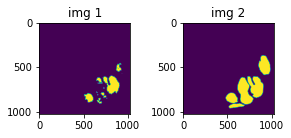

0.5040406584739685


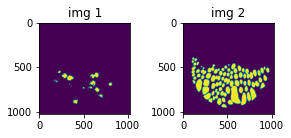

0.14688973128795624


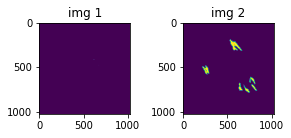

5.833284740219824e-05


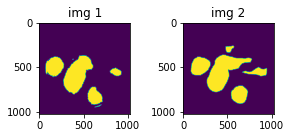

0.8396948575973511


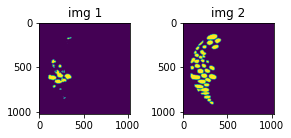

0.36432111263275146


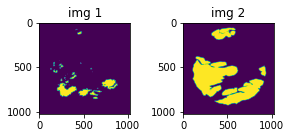

0.2913547456264496


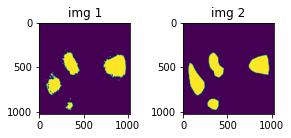

0.7926990985870361


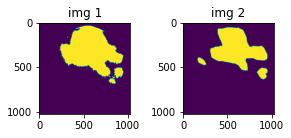

0.800999104976654


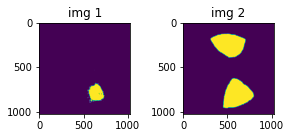

0.24898222088813782


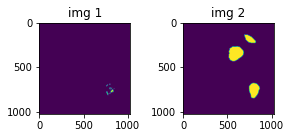

0.05347461625933647


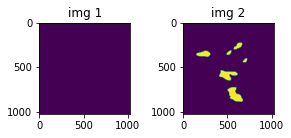

2.2179834559210576e-05


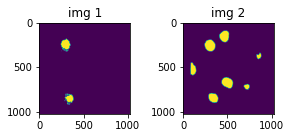

0.41258004307746887


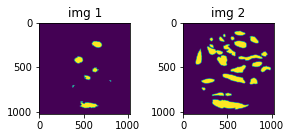

0.27877533435821533


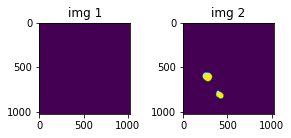

7.078643830027431e-05


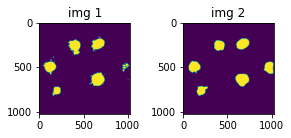

0.8279033899307251


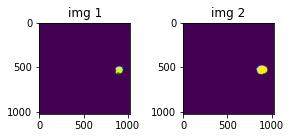

0.6953243613243103


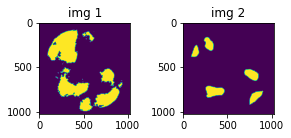

0.44995030760765076


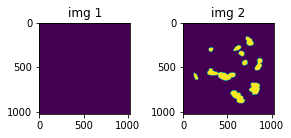

0.012946163304150105


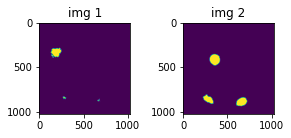

0.026556221768260002


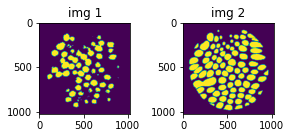

0.6153517365455627


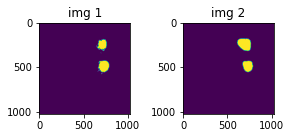

0.8133018612861633


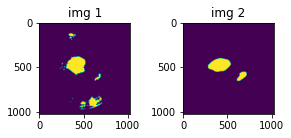

0.6558585166931152


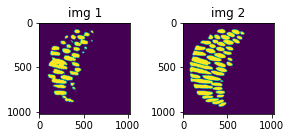

0.6701084971427917


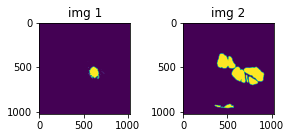

0.21119189262390137


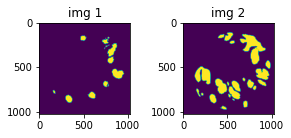

0.40327227115631104


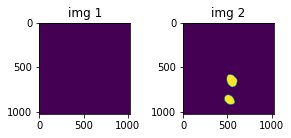

4.674863157561049e-05


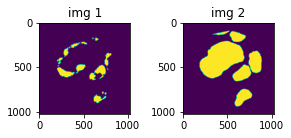

0.3570447862148285


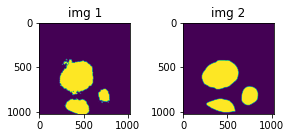

0.8356603384017944


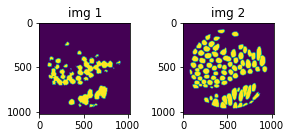

0.571982741355896


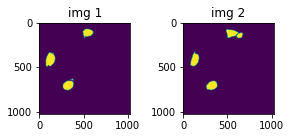

0.8471677899360657


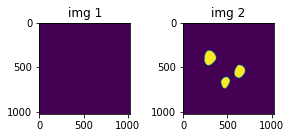

0.04918879643082619


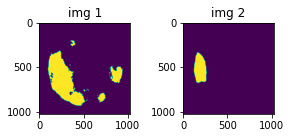

0.39895933866500854


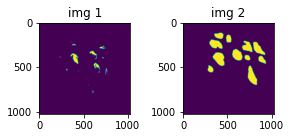

0.32281607389450073


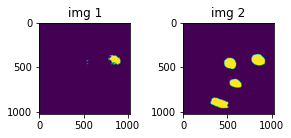

0.26257017254829407


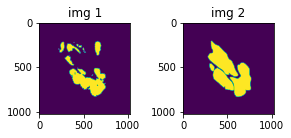

0.6208655834197998


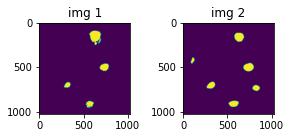

0.723630428314209


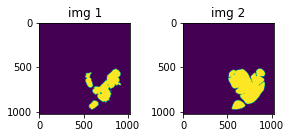

0.7001239061355591


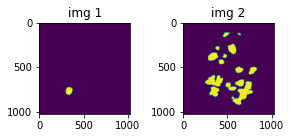

0.0893528163433075


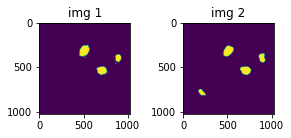

0.8557177782058716


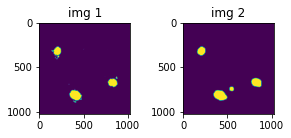

0.8625416159629822


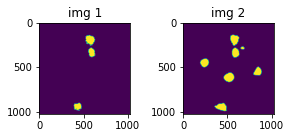

0.5478219389915466


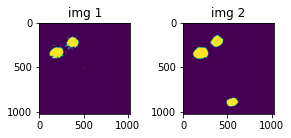

0.7534196376800537


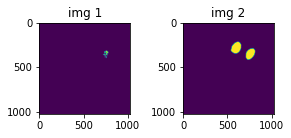

0.11484364420175552


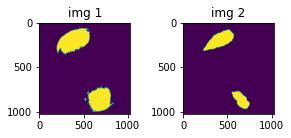

0.6917463541030884


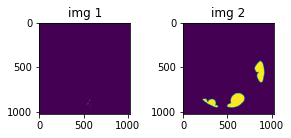

0.024335216730833054


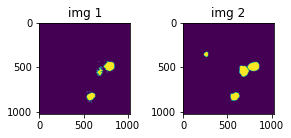

0.7417209148406982


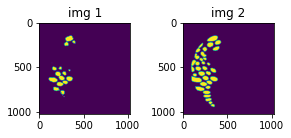

0.5343523621559143


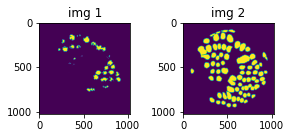

0.25975915789604187


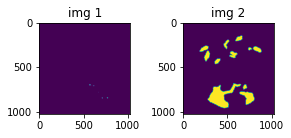

0.02192559838294983


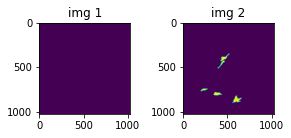

0.00045016416697762907


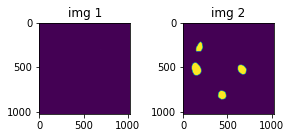

0.0006426931940950453


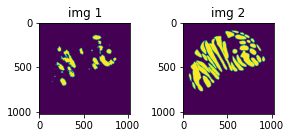

0.39076846837997437


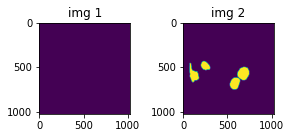

0.010851816274225712


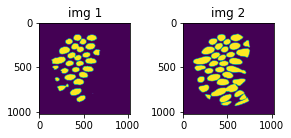

0.7176575064659119


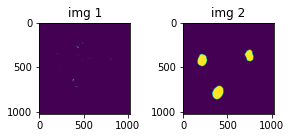

0.01108104269951582


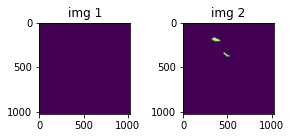

0.0002469135797582567


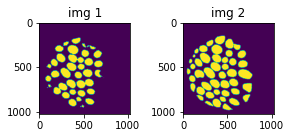

0.7922175526618958


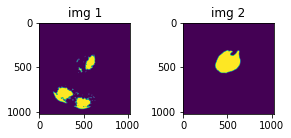

0.22213135659694672


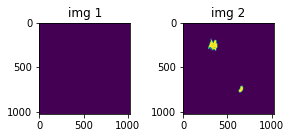

9.07605717657134e-05


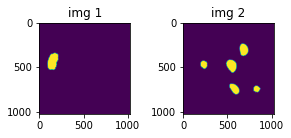

0.0006744954152964056


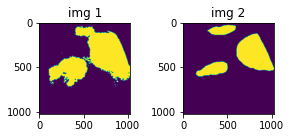

0.7180830240249634


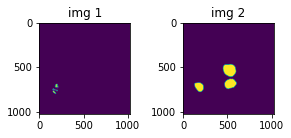

0.04677053913474083


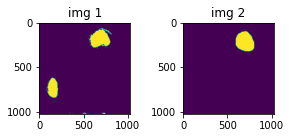

0.612490713596344


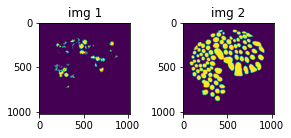

0.17866989970207214


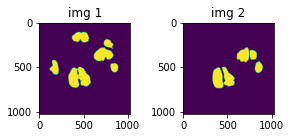

0.7315391302108765


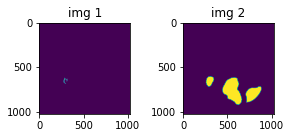

0.045667096972465515


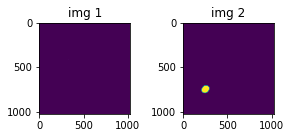

0.00011652295506792143


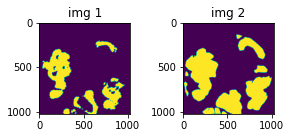

0.7093612551689148


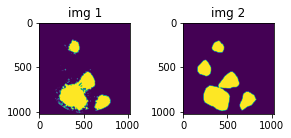

0.8248317837715149


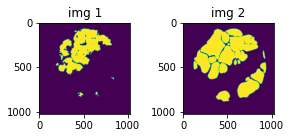

0.6068174242973328


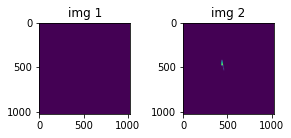

0.0009569377871230245


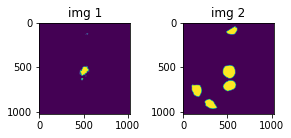

0.18308775126934052


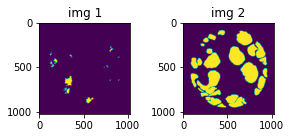

0.08556409180164337


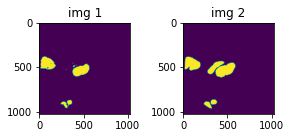

0.764599621295929


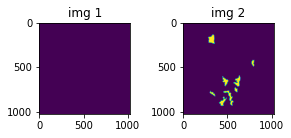

2.7652573407976888e-05


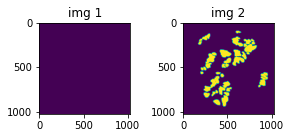

0.011451750062406063


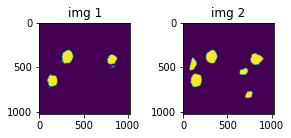

0.7161982655525208


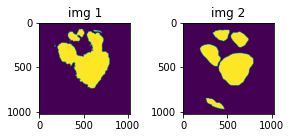

0.8563228249549866


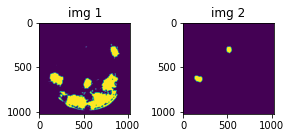

0.07836449891328812


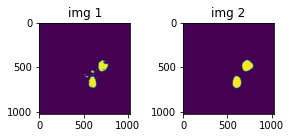

0.8398391008377075


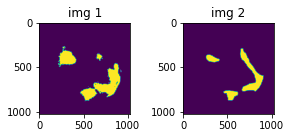

0.6206969022750854


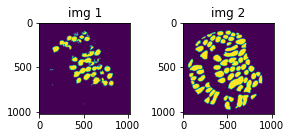

0.49231424927711487


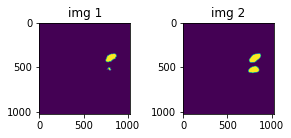

0.6538676023483276


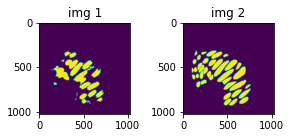

0.7006639838218689


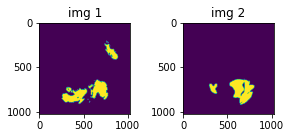

0.4566681683063507


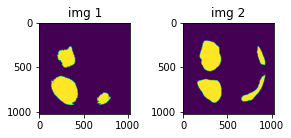

0.6985076665878296


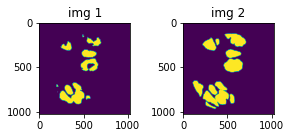

0.7336121201515198


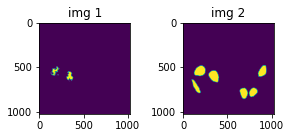

0.223139226436615


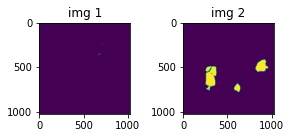

2.3945785869727843e-05


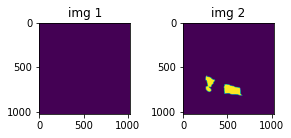

0.0005493700737133622


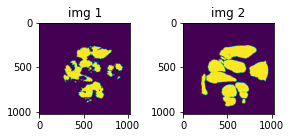

0.6708700060844421


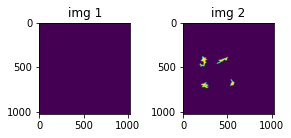

5.537098695640452e-05


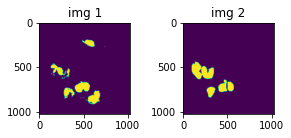

0.5422375202178955


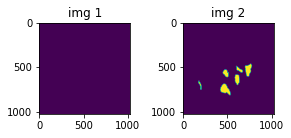

3.5931156162405387e-05


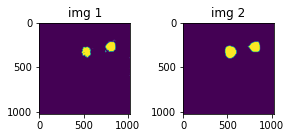

0.8171544671058655


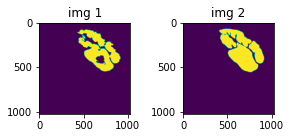

0.8485316634178162


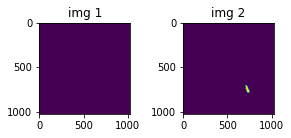

0.00024360536190215498


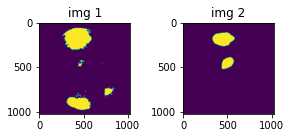

0.448318749666214


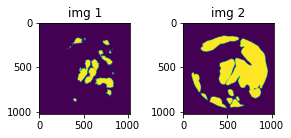

0.3667919635772705


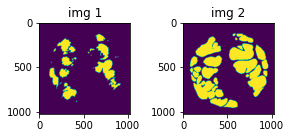

0.4935222268104553


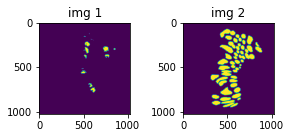

0.12163201719522476


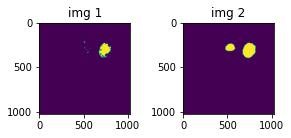

0.6498203277587891


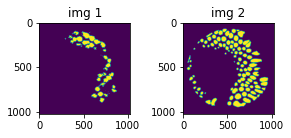

0.4208492934703827


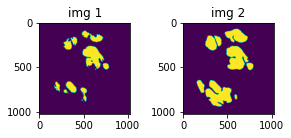

0.6668825745582581


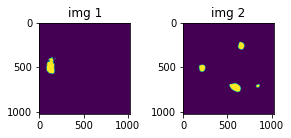

3.285366983618587e-05


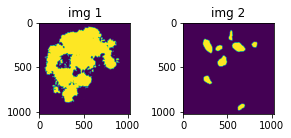

0.24079501628875732


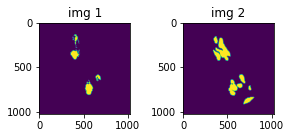

0.4709198474884033


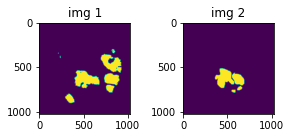

0.4378798305988312


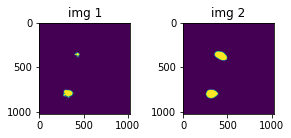

0.5246771574020386


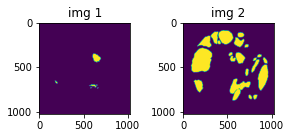

0.07222520560026169


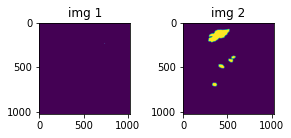

3.81577447114978e-05


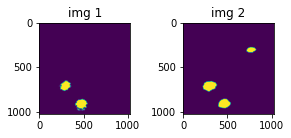

0.727637529373169


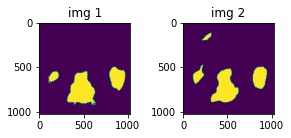

0.8452036380767822


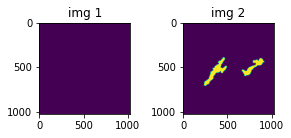

0.00027083331951871514


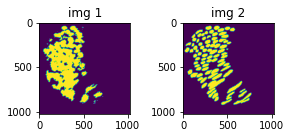

0.729789674282074


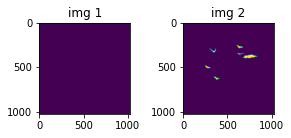

0.00012706480629276484


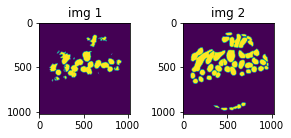

0.5952600240707397


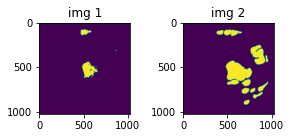

0.3228031098842621


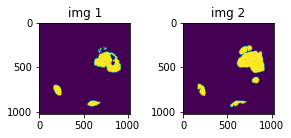

0.7763102650642395


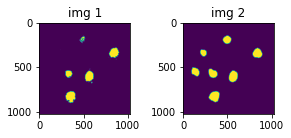

0.7164095640182495


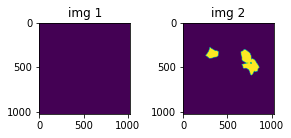

0.0003274537157267332


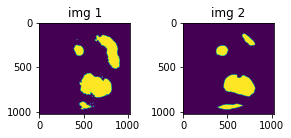

0.7172170877456665


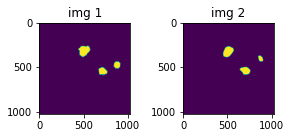

0.7109659314155579


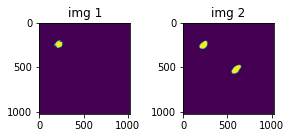

0.4268364906311035


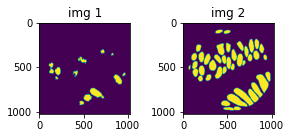

0.271447092294693


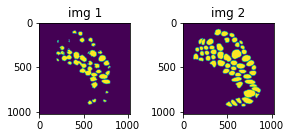

0.6027958393096924
FOLD: 0, EPOCH: 16, valid_loss: 0.7330939068712972 , Val Dice COE : 0.39589737845813033


  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 17, train_loss: 0.6782264184951782 , Dice coe : 0.5267577455085796 
0.6091969609260559
0.8139695525169373
0.7197854518890381
0.6419308185577393
0.5792118906974792
0.3563537299633026
0.7976711988449097
0.002938338788226247
0.6366901397705078
0.801108181476593
0.6720520853996277
8.443093247478828e-05
0.5987951755523682
0.6153246164321899
0.2003113031387329
0.0001305312616750598
0.342646062374115
0.7120928168296814
0.0008072221535257995
0.24900445342063904
0.7669232487678528
4.0168710256693885e-05
0.7518815994262695
0.8137521147727966
0.7789043188095093
0.08850184828042984
0.48542582988739014
0.6340786218643188
0.819364070892334
9.434852108824998e-05
0.888537585735321
0.0012227656552568078
0.7806066274642944
0.6365339756011963
0.7671408653259277
0.843914806842804
0.8249922394752502
0.6058864593505859
0.8245536684989929
0.6125297546386719
2.2831571186543442e-05
0.30357033014297485
0.583079993724823
0.6785116195678711
0.787377655506134
0.36701637506484985
0.00116811937186867

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 18, train_loss: 0.6867952743598393 , Dice coe : 0.5252540439811257 
0.6491391062736511
0.00445239432156086
0.8020769953727722
0.6644668579101562
0.5430379509925842
0.36932680010795593
0.0032043971586972475
0.00016381805471610278
0.023763999342918396
0.49665752053260803
0.7315285205841064
8.410429290961474e-05
0.6583452820777893
0.0007963329553604126
0.41708388924598694
0.00013419215974863619
0.439157634973526
0.19766399264335632
1.648668694542721e-05
0.18619398772716522
0.8200312852859497
4.0251168684335425e-05
0.736569344997406
0.8388749957084656
0.8351471424102783
0.08287249505519867
0.441408634185791
0.6404169797897339
0.8680968880653381
0.00016770082584116608
0.9002085328102112
0.00011120996350655332
0.8691256046295166
0.6611942052841187
0.7345901727676392
0.8953840136528015
0.8575313687324524
0.5456929802894592
0.7744594216346741
0.7090713381767273
2.285400842083618e-05
0.3585131764411926
0.08329103887081146
0.5911886692047119
0.8357430696487427
0.4534105360507965


  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 19, train_loss: 0.6827233958244324 , Dice coe : 0.516877090249197 
0.7514882683753967
0.014930864796042442
0.7675691246986389
0.682834267616272
0.5766397714614868
0.3744004964828491
0.6539768576622009
0.005571247078478336
0.7676181197166443
0.0007522910600528121
0.7114273905754089
4.749240179080516e-05
0.7267280220985413
0.0048957401886582375
4.328030172473518e-06
8.326394890900701e-05
0.7415167093276978
0.7114648818969727
1.356226403004257e-05
0.0005348987178876996
0.6586153507232666
3.042195203306619e-05
0.011162449605762959
0.8399862051010132
0.8751161694526672
0.04205682873725891
0.2609228789806366
0.7936867475509644
0.8914873003959656
0.00017059023957699537
0.5440259575843811
7.980845839483663e-05
0.8941515684127808
0.850202739238739
0.40731993317604065
0.7896818518638611
0.8812474012374878
0.5087380409240723
0.32982566952705383
0.9017165303230286
2.173582288378384e-05
0.4131729006767273
0.31560924649238586
0.19047445058822632
0.8618443012237549
0.3435498774051666


  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 20, train_loss: 0.6814490701471057 , Dice coe : 0.5765791856880268 
0.6903271675109863
0.005855105351656675
0.7047199010848999
0.6576878428459167
0.5054518580436707
0.31864821910858154
0.6320863366127014
0.003911138977855444
0.7322932481765747
0.7188770771026611
0.7222205996513367
0.0020081934053450823
0.7359998226165771
0.040109213441610336
0.00435820035636425
0.0022897084709256887
0.8472816348075867
0.6407914161682129
0.00017350705456919968
1.3715539353142958e-05
0.778437077999115
3.9956845284905285e-05
0.6208128929138184
0.8453291654586792
0.8377673625946045
0.6663667559623718
0.00805728044360876
0.8436527252197266
0.8704786896705627
0.006381723564118147
0.8197625875473022
0.0001564602425787598
0.8710625767707825
0.8919914364814758
0.7115151286125183
0.8097660541534424
0.8202901482582092
0.5490508675575256
0.6469364166259766
0.7088525891304016
4.610887117451057e-06
0.3250886797904968
0.6612363457679749
0.4179762601852417
0.8612274527549744
0.7868874669075012
0.002582

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 21, train_loss: 0.688850109747478 , Dice coe : 0.5145341346165436 


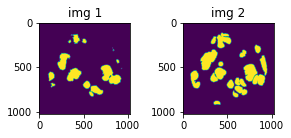

0.6782044172286987


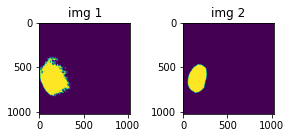

0.7531310319900513


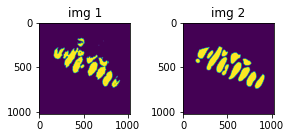

0.8028697371482849


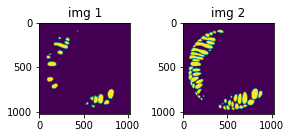

0.4898272454738617


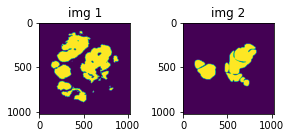

0.5961371660232544


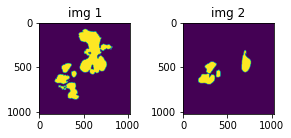

0.3865269422531128


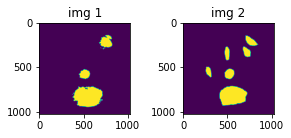

0.786300778388977


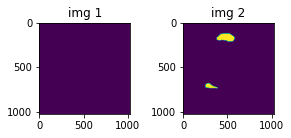

5.446029899758287e-05


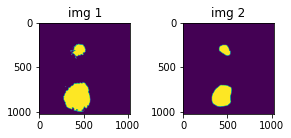

0.7601702213287354


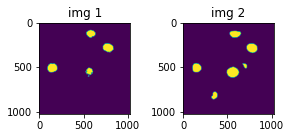

0.7268653512001038


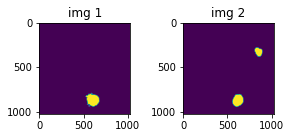

0.7070285677909851


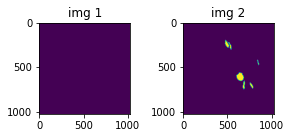

8.32570149214007e-05


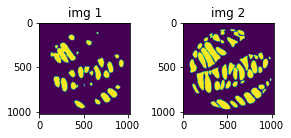

0.6486322283744812


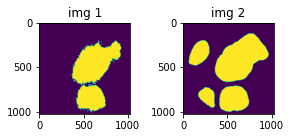

0.7629155516624451


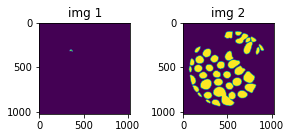

4.3237632780801505e-06


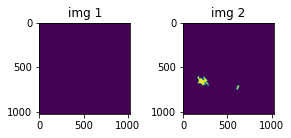

0.00013354701513890177


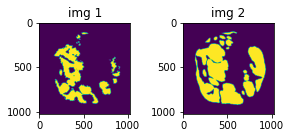

0.6415356397628784


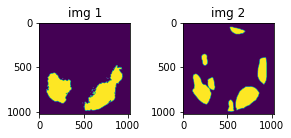

0.7522856593132019


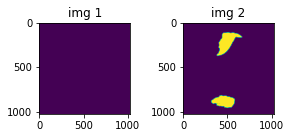

0.000805782969109714


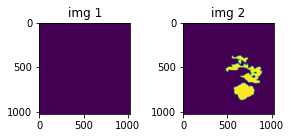

0.010131041519343853


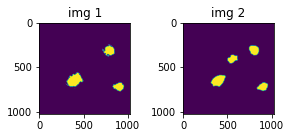

0.7955862879753113


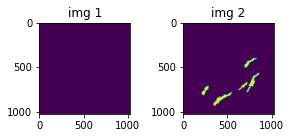

3.8759688322898e-05


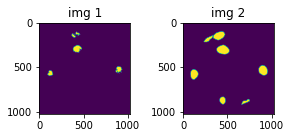

0.39555755257606506


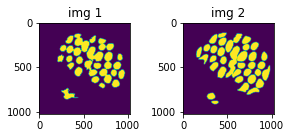

0.8268761038780212


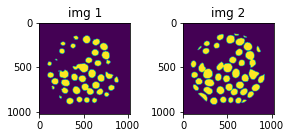

0.8089597821235657


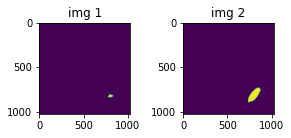

0.17040054500102997


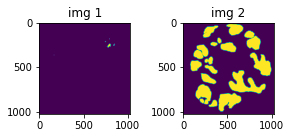

0.0059301117435097694


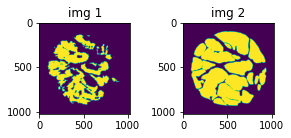

0.6353267431259155


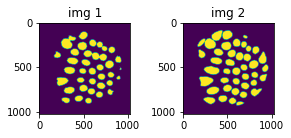

0.8278906941413879


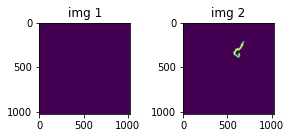

0.00016767269698902965


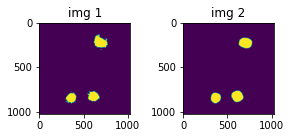

0.8723369240760803


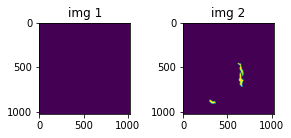

0.00011153245577588677


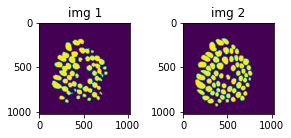

0.8140913248062134


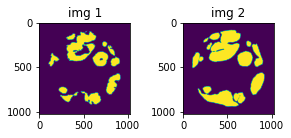

0.7572354674339294


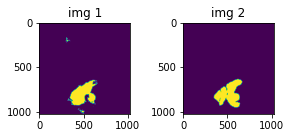

0.8071708679199219


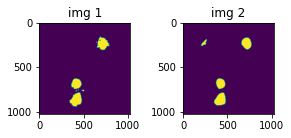

0.9044061303138733


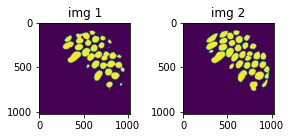

0.8460572361946106


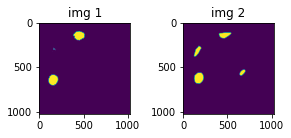

0.5768800377845764


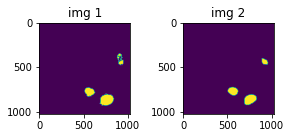

0.849071741104126


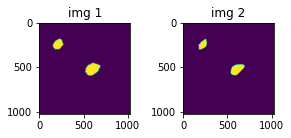

0.8593652248382568


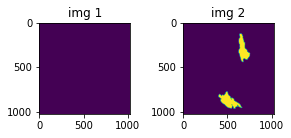

2.273657446494326e-05


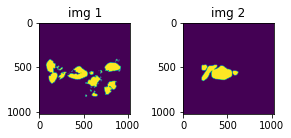

0.3626856803894043


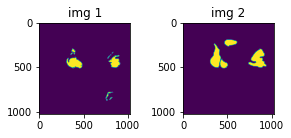

0.5726666450500488


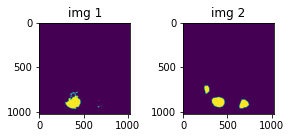

0.594599187374115


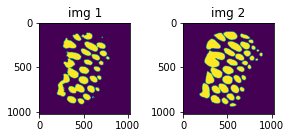

0.8130236864089966


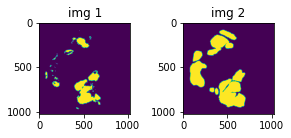

0.5111972093582153


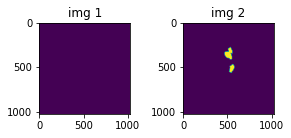

8.866820280672982e-05


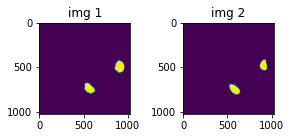

0.7953927516937256


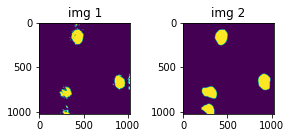

0.7420222163200378


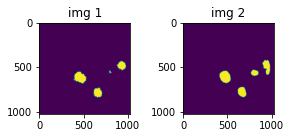

0.7620972394943237


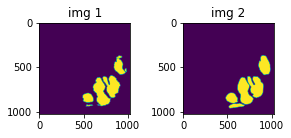

0.8698720335960388


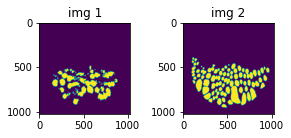

0.5708692073822021


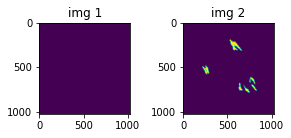

5.953443906037137e-05


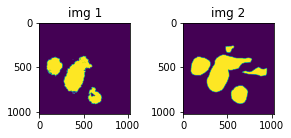

0.7380271553993225


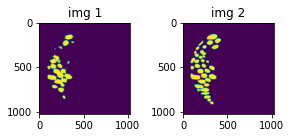

0.6672960519790649


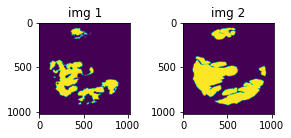

0.676072895526886


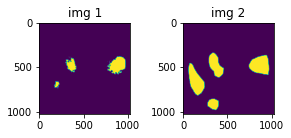

0.47054293751716614


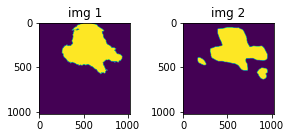

0.822870671749115


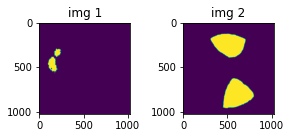

5.998548203933751e-06


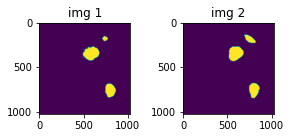

0.8632746934890747


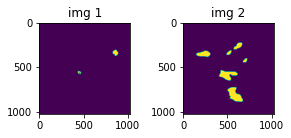

0.01845095306634903


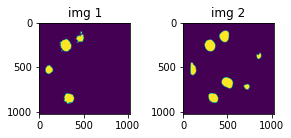

0.6760156154632568


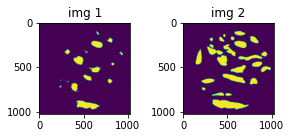

0.45171648263931274


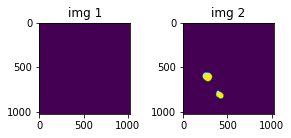

0.005698216613382101


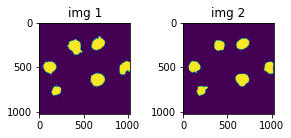

0.8627457022666931


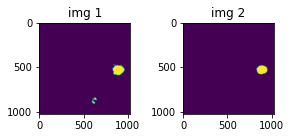

0.8635812997817993


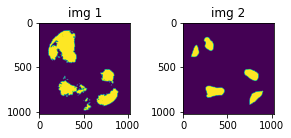

0.531814694404602


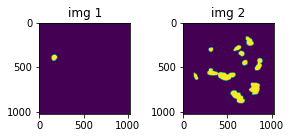

1.301744305237662e-05


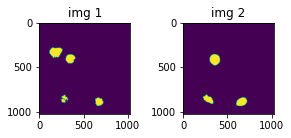

0.5776549577713013


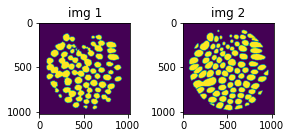

0.8442453742027283


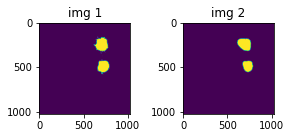

0.8828960657119751


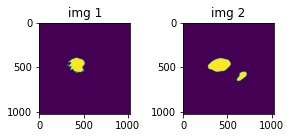

0.6775645017623901


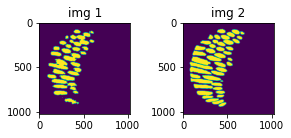

0.7550997138023376


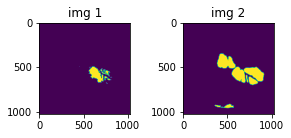

0.3667467534542084


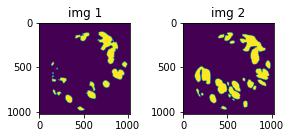

0.6607949733734131


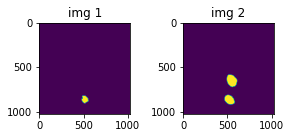

0.339188814163208


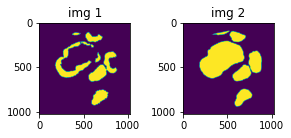

0.6646251678466797


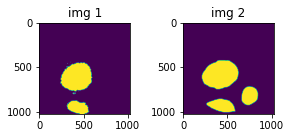

0.7335478067398071


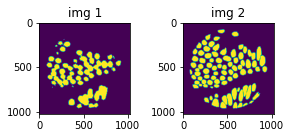

0.719305694103241


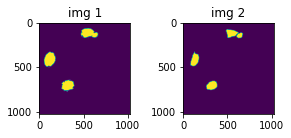

0.8251801133155823


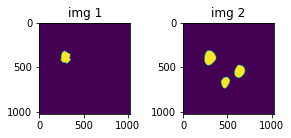

0.43314412236213684


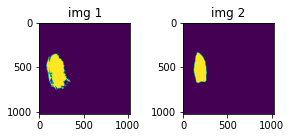

0.7734760642051697


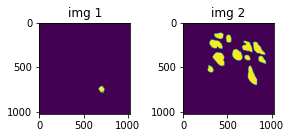

1.0784927326312754e-05


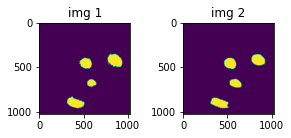

0.9045096039772034


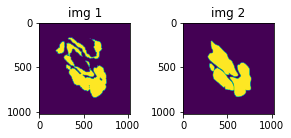

0.7085328102111816


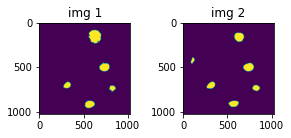

0.8194983005523682


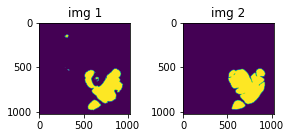

0.8465335965156555


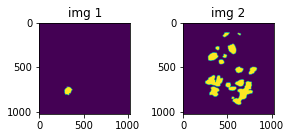

0.07938376814126968


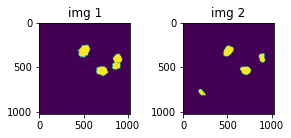

0.73459792137146


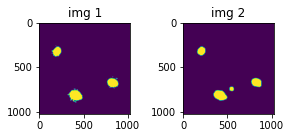

0.8927339315414429


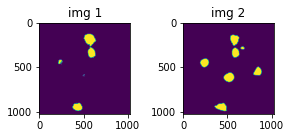

0.6187224388122559


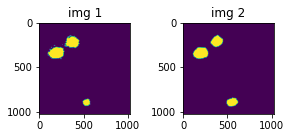

0.8628988265991211


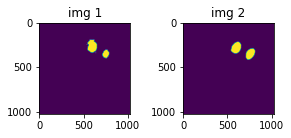

0.7621741890907288


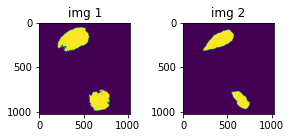

0.7213407158851624


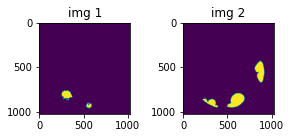

0.07457399368286133


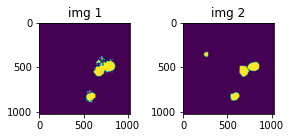

0.828513503074646


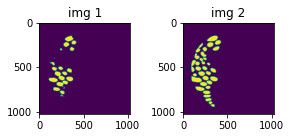

0.646517813205719


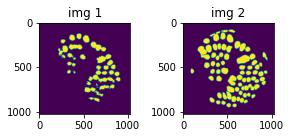

0.6044298410415649


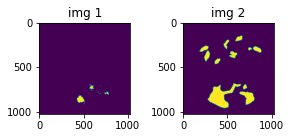

0.07051578164100647


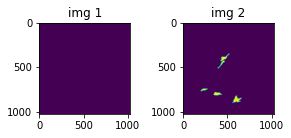

3.571811248548329e-05


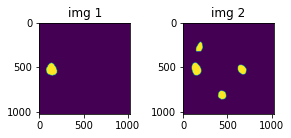

0.47711166739463806


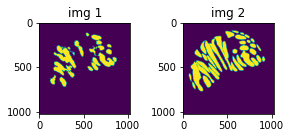

0.6197088360786438


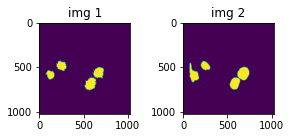

0.8362097144126892


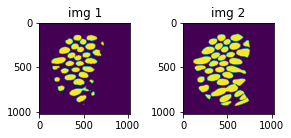

0.7512297034263611


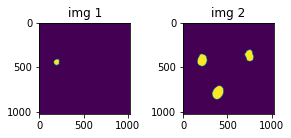

0.14737959206104279


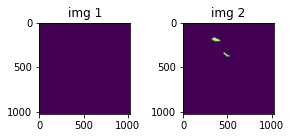

0.00026198584237135947


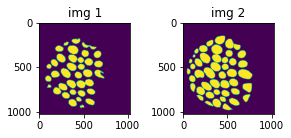

0.7943984270095825


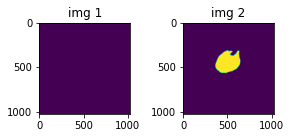

1.8917180568678305e-05


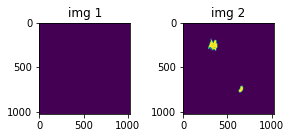

9.66370280366391e-05


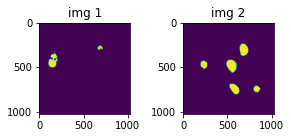

0.05724511295557022


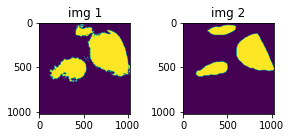

0.7747398614883423


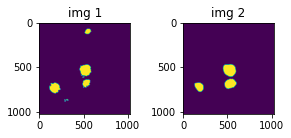

0.7716579437255859


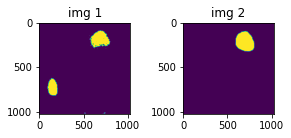

0.6463635563850403


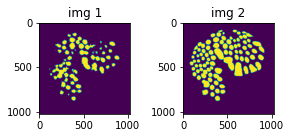

0.6256895065307617


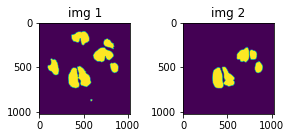

0.7149940729141235


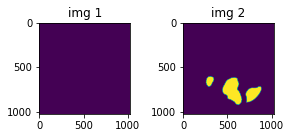

0.03111531212925911


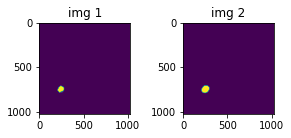

0.751937985420227


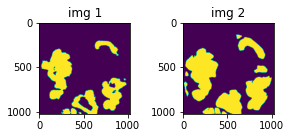

0.8205806612968445


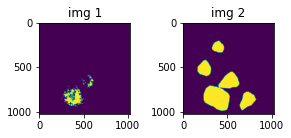

0.2397739738225937


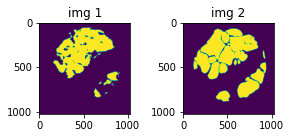

0.7481096386909485


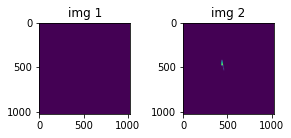

0.001172332908026874


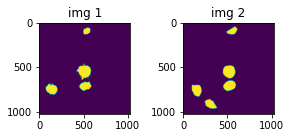

0.7647656202316284


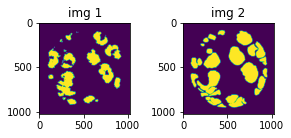

0.6646531820297241


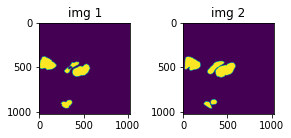

0.8423140048980713


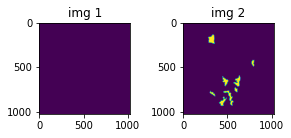

1.9414836060605012e-05


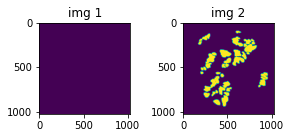

0.001974148442968726


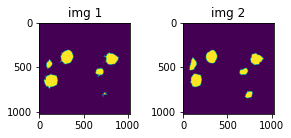

0.8484314680099487


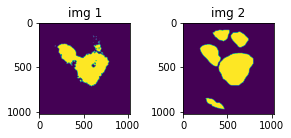

0.7634286880493164


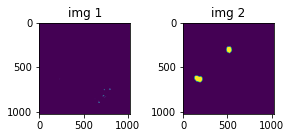

0.0008566533215343952


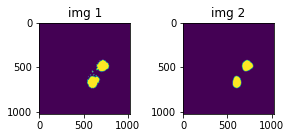

0.8950963020324707


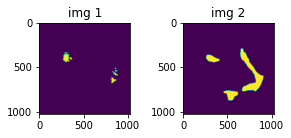

0.19736354053020477


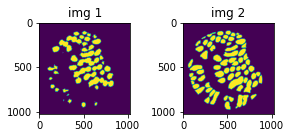

0.6907277703285217


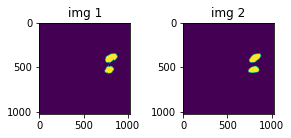

0.9078390598297119


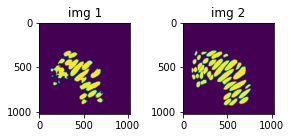

0.7329314351081848


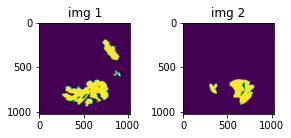

0.523474931716919


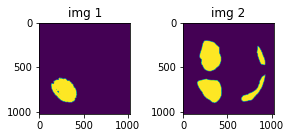

0.4526907205581665


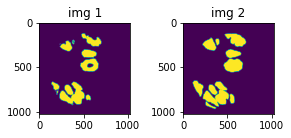

0.8353478312492371


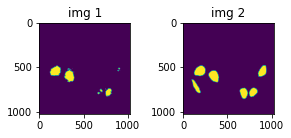

0.6184773445129395


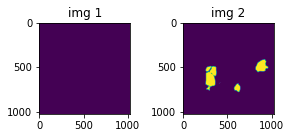

0.0003619429189711809


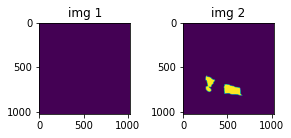

0.00047666189493611455


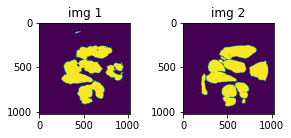

0.8776441216468811


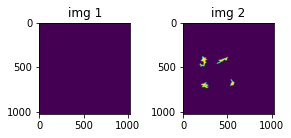

3.243172977818176e-05


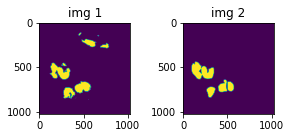

0.7366730570793152


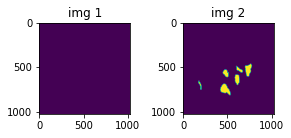

3.598675539251417e-05


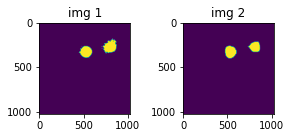

0.8777170181274414


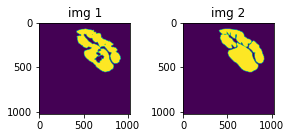

0.9038066267967224


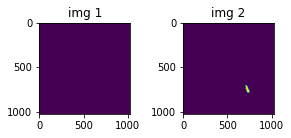

0.0003822630096692592


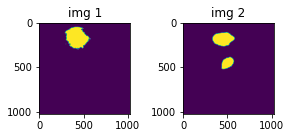

0.6310432553291321


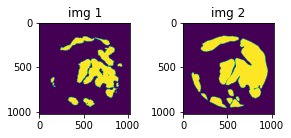

0.7171051502227783


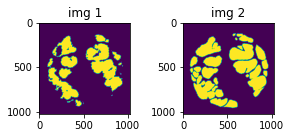

0.7615858912467957


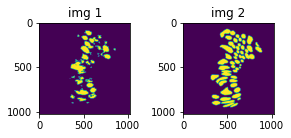

0.5443441867828369


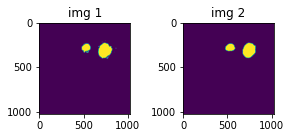

0.9411776065826416


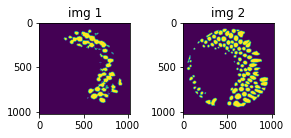

0.5732519626617432


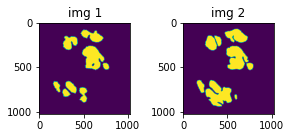

0.8114765286445618


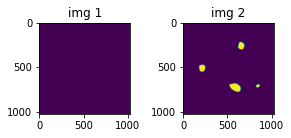

0.0006924796616658568


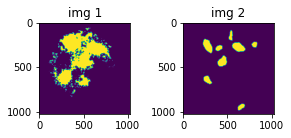

0.37088295817375183


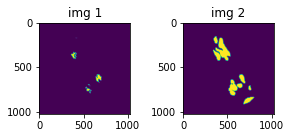

0.1715589463710785


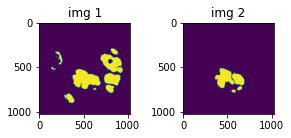

0.46958643198013306


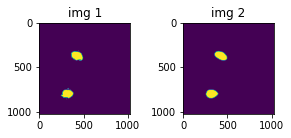

0.9335765242576599


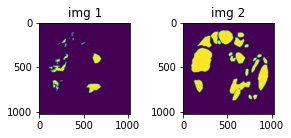

0.24356216192245483


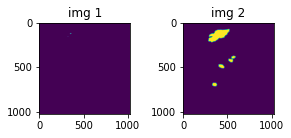

0.017280668020248413


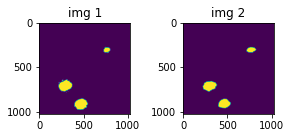

0.8776955008506775


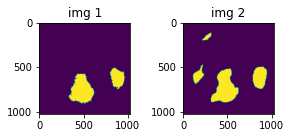

0.7706732749938965


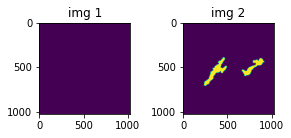

0.0005558349657803774


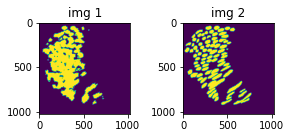

0.7469748258590698


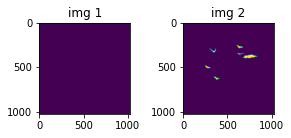

4.380393511382863e-05


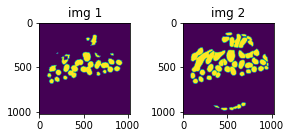

0.6241587400436401


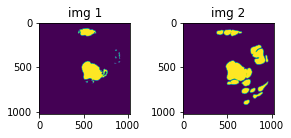

0.5847808122634888


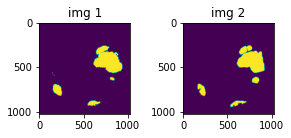

0.8990151882171631


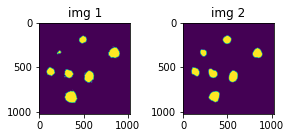

0.8727505803108215


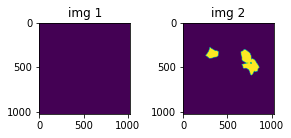

2.3874896214692853e-05


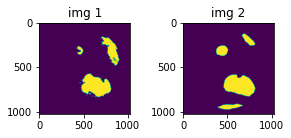

0.6857334971427917


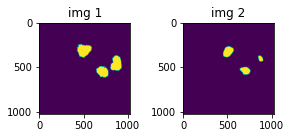

0.6184316873550415


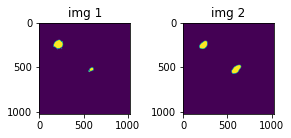

0.6095387935638428


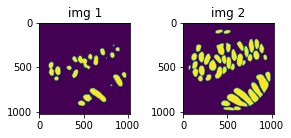

0.4850054681301117


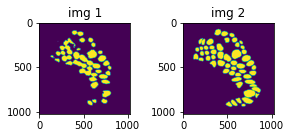

0.7531775236129761
FOLD: 0, EPOCH: 21, valid_loss: 0.7267849259078503 , Val Dice COE : 0.5317717179324419
Saved model for best loss : FOLD0_best_loss.pth


  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 22, train_loss: 0.6888110072272164 , Dice coe : 0.5859309266068782 
0.8058773875236511
0.7979313731193542
0.7044979929924011
0.6489520072937012
0.5770838856697083
0.3761953115463257
0.6194362640380859
3.264666520408355e-05
0.8118969202041626
0.010158167220652103
0.6817282438278198
8.274036372313276e-05
0.6832113265991211
0.6553741097450256
4.299281499697827e-06
0.00013159625814296305
0.8391693830490112
0.6496400237083435
0.003946150653064251
0.04088923707604408
0.7399950623512268
2.439143463561777e-05
0.06704438477754593
0.8515085577964783
0.8469634652137756
0.08804982155561447
0.19112855195999146
0.8300083875656128
0.8701232671737671
2.9790277039865032e-05
0.09262750297784805
0.00010704345913836733
0.8768449425697327
0.8810509443283081
0.7126563191413879
0.7039536833763123
0.8792625665664673
0.5910127758979797
0.019892916083335876
0.8844285011291504
3.290808672318235e-05
0.45139577984809875
0.5848454833030701
0.5792933106422424
0.8598098158836365
0.7343006730079651
0.0

  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 23, train_loss: 0.6864689883163997 , Dice coe : 0.5634369868215903 
0.6739273071289062
0.7422695159912109
0.7820368409156799
0.49268394708633423
0.5908939838409424
0.40510499477386475
0.7064037322998047
0.0023739247117191553
0.6053013205528259
1.4826896403974388e-05
0.00023330999829340726
0.004729749169200659
0.5132714509963989
0.8071402311325073
0.41887447237968445
0.0022790462244302034
0.06314267218112946
0.682915449142456
7.375012046395568e-06
0.000666097505018115
2.41207962972112e-05
4.168924715486355e-05
1.5558875020360574e-05
0.6910021901130676
0.6603953838348389
0.036326609551906586
0.4181429147720337
0.674159586429596
0.6866950988769531
0.00017064846178982407
0.0004266115720383823
9.747986041475087e-05
0.7113623023033142
0.7384554147720337
0.7727649211883545
0.022016102448105812
0.8212822675704956
0.03322073444724083
2.512247192498762e-05
3.181673673680052e-05
6.014350219629705e-06
6.10948191024363e-05
0.41509926319122314
3.97867443098221e-05
0.7371973991394043


  0%|          | 0/175 [00:00<?, ?it/s]

FOLD: 0, EPOCH: 24, train_loss: 0.6920585463728224 , Dice coe : 0.5547509945166452 
0.5267861485481262
0.46452775597572327
0.6283669471740723
0.3572210371494293
0.5338340401649475
0.3612145483493805
0.7652302980422974
0.004502182360738516
0.5820534229278564
0.6307174563407898
0.6259838342666626
5.550313653657213e-05
0.43281951546669006
0.8176876902580261
4.330991487222491e-06
0.0006769171450287104
0.27777329087257385
0.6645336747169495
1.560914643050637e-05
0.02316867746412754
0.7729282379150391
9.188136027660221e-05
0.7888717651367188
0.6001491546630859
0.5632056593894958
0.034281548112630844
0.00026565222651697695
0.43527066707611084
0.675081193447113
0.00036163750337436795
0.8730473518371582
0.00011273957352386788
0.609613299369812
0.5852150917053223
0.5811758637428284
0.8639472126960754
0.6775650978088379
0.5789371132850647
0.7969226241111755
0.8491592407226562
1.0390474017185625e-05
1.9325165339978412e-05
0.3044883608818054
0.6961023807525635
0.6110692620277405
0.06304602324962616

  0%|          | 0/175 [00:00<?, ?it/s]

In [ ]:
print(f"Running on device :  {DEVICE}" )
for fold in range(nfolds):
    
    val_losses = []
    losses = []
    train_scores=[]
    val_scores = []
    best_loss = 999
    best_score = 0
    
    ds_train = HuBMAPDataset(fold=fold, train=True, tfms=transformer())
    ds_val = HuBMAPDataset(fold=fold, train=False)
    
    dataloader_train = torch.utils.data.DataLoader(ds_train,batch_size=BATCH_SIZE, shuffle=True,num_workers=NUM_WORKERS)
    dataloader_val = torch.utils.data.DataLoader(ds_val,batch_size=1, shuffle=False,num_workers=NUM_WORKERS)
    
    model = init_model().to(DEVICE)
    
    optimizer = torch.optim.Adam([
        {'params': model.decoder.parameters(), 'lr': 5e-4}, 
        {'params': model.encoder.parameters(), 'lr': 8e-4},  
    ])
    
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer=optimizer, pct_start=0.1, div_factor=1e3, 
                                              max_lr=1e-3, epochs=EPOCHS, steps_per_epoch=len(dataloader_train))
    
    loss_func = CustomLoss()
    dice_coe = DiceCoef()
    
    print(f"######## FOLD: {fold} ##############")
    
    
    
    for epoch in tqdm.notebook.tqdm(range(EPOCHS)):
        
        ### Train ###########################################################################################
        
        model.train()
        train_loss = 0
        score = 0
        
        for data in tqdm.notebook.tqdm(dataloader_train ,total = len(dataloader_train)):
            optimizer.zero_grad()
            img, mask = data
            img = img.to(DEVICE)
            mask = mask.to(DEVICE)
        
            outputs = model(img)['probability']    

            loss = loss_func(outputs, mask)
            loss.backward()
            optimizer.step()
            scheduler.step()
            train_loss += loss.item()
            score += dice_coe(outputs,mask).item()

            
        train_loss /= len(dataloader_train)
        score /= len(dataloader_train)
        losses.append(train_loss)
        train_scores.append(score)
        print(f"FOLD: {fold}, EPOCH: {epoch + 1}, train_loss: {train_loss} , Dice coe : {score} ") #
        
        
        gc.collect()
        torch.cuda.empty_cache()
        
        ### Validation ####################################################################################
        
        model.eval()
        
        with torch.no_grad():
            
            valid_loss = 0
            val_score = 0
            
            for data in dataloader_val:
                
                img, mask = data
                img = img.to(DEVICE)
                mask = mask.to(DEVICE)

                outputs = model(img)['probability']
                


                if epoch%5 == 0:
                    masks = (outputs.permute((0, 2, 3, 1))>0.4).to(torch.uint8).cpu().detach().numpy()
                    msk = cv2.resize(masks[0].squeeze(), dsize=(1024, 1024), interpolation=cv2.INTER_NEAREST)

                    #msk.astype(np.float32)

                    fig = plt.figure()
                    rows = 1; cols = 3

                    ax1 = fig.add_subplot(rows, cols, 1)
                    ax1.set_title('img 1')
                    ax1.imshow(msk*255)

                    ax2 = fig.add_subplot(rows, cols, 2)
                    ax2.set_title('img 2')
                    ax2.imshow(mask.to(torch.uint8).cpu().detach().numpy().squeeze()*255)

                    #gc.collect()


                    #plt.imshow(msk*255)

                    #plt.imshow(mask.to(torch.uint8).cpu().detach().numpy().squeeze()*255)

                    fig.tight_layout()
                    plt.show()
                    #print(outputs.cpu().size())

                loss = loss_func(outputs, mask)
                valid_loss += loss.item()
                temp = dice_coe(outputs,mask).item()
                print(temp)
                val_score += temp
                #gc.collect()
                
            valid_loss /= len(dataloader_val)
            val_losses.append(valid_loss)
            
            val_score /= len(dataloader_val)
            val_scores.append(val_score)
            
            print(f"FOLD: {fold}, EPOCH: {epoch + 1}, valid_loss: {valid_loss} , Val Dice COE : {val_score}") #
            
            gc.collect()
            torch.cuda.empty_cache()
            
        if val_score > best_score:
            best_score = val_score
            torch.save(model.state_dict(), f"/content/drive/MyDrive/DeepLearning/CoatModel/{fold}_best_score.pth")
            print(f"Saved model for best score : FOLD{fold}_best_score.pth")
            
        if valid_loss < best_loss:
            best_loss = valid_loss
            torch.save(model.state_dict(), f"/content/drive/MyDrive/DeepLearning/CoatModel/FOLD{fold}_best_loss.pth")
            print(f"Saved model for best loss : FOLD{fold}_best_loss.pth")   
           
    
    
    column_names = ['Train_loss','Val_loss','Train_Dice','Val_Dice']
    df = pd.DataFrame(np.stack([losses,val_losses,train_scores,val_scores],axis=1),columns=column_names)
    print(f" ################# FOLD {fold} #####################")
    plot_df(df)
    plt.show(block=False)
    df.to_csv(f"logs_fold{fold}.csv")
    break

## Model

## Train